<a href="https://colab.research.google.com/github/Eylz-Liu/ALM-study/blob/main/Etude_GSE_Output_PVFP%202025.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Section 1 - Importation de tirage


In [1]:
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
from sklearn.cluster import KMeans
from google.colab import files

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix, classification_report

from sklearn.decomposition import PCA
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.cross_decomposition import PLSRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.inspection import permutation_importance
import shap
from scipy.spatial import distance
from scipy.stats import chi2
import statsmodels.api as sm
from sklearn.datasets import make_regression


!pip install xlsxwriter
# Définir les bornes de colonnes
col_start = 1   # [ 2025(1) - 2034(10) ]  [ 2025(11) - 2044(20) ]
col_end   = 43  # correspond à la colonne 11

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.3/175.3 kB 4.0 MB/s eta 0:00:00


1.1 Extraction de GSE Taux *court* Yearly


In [2]:
def load_matrix_from_excel(filename, col_start, col_end, print_title="Matrix shape"):
    from google.colab import files
    uploaded = files.upload()
    df = pd.read_excel(filename, sheet_name=0, header=None)

    maturities = df.iloc[0, col_start:col_end+1].astype(float).values
    scenario   = df.iloc[1:, 0].astype(float).values
    matrix     = df.iloc[1:, col_start:col_end+1].astype(float).values

    print("T_array (maturities):", maturities.shape)
    print(f"{print_title}. shape:", matrix.shape)
    #print(f"{print_title} (extrait):\n", matrix[:5, :7])

    return maturities, scenario, matrix

Extraction Taux court

In [3]:
maturities, scenario, TL_matrix = load_matrix_from_excel( filename="TIRAGES_TXCOURT_Y.xlsx",col_start=1,col_end=43,print_title="TL Matrix")

Saving TIRAGES_TXCOURT_Y.xlsx to TIRAGES_TXCOURT_Y.xlsx
T_array (maturities): (42,)
TL Matrix. shape: (1000, 42)


 extraction Taux long Tirage

In [4]:
maturities, scenario, TLT_matrix = load_matrix_from_excel( filename="TIRAGES_TXLONG_Y.xlsx",col_start=1,col_end=43,print_title="TLT Matrix")

Saving TIRAGES_TXLONG_Y.xlsx to TIRAGES_TXLONG_Y.xlsx
T_array (maturities): (42,)
TLT Matrix. shape: (1000, 42)


Extraction Tirage Action transformé en %

In [5]:
maturities, scenario, ACT_matrix = load_matrix_from_excel( filename="TIRAGES_INDACT_Y.xlsx",col_start=1,col_end=43,print_title="ACT Matrix")

Saving TIRAGES_INDACT_Y.xlsx to TIRAGES_INDACT_Y.xlsx
T_array (maturities): (42,)
ACT Matrix. shape: (1000, 42)


Extraction IMMO transformé en %

In [6]:
maturities, scenario, IMMO_matrix = load_matrix_from_excel( filename="TIRAGES_INDIMMO_Y.xlsx",col_start=1,col_end=43,print_title="IMMO Matrix")

Saving TIRAGES_INDIMMO_Y.xlsx to TIRAGES_INDIMMO_Y.xlsx
T_array (maturities): (42,)
IMMO Matrix. shape: (1000, 42)


Extraction de resultat finanicer analytique

In [7]:
maturities2, scenario, RFA_matrix = load_matrix_from_excel( filename="RES_RFA_Y.xlsx",col_start=1,col_end=43,print_title="RFA Matrix")

Saving RES_RFA_Y.xlsx to RES_RFA_Y.xlsx
T_array (maturities): (41,)
RFA Matrix. shape: (1000, 41)


Extraction de montant de rachat conjoncturel

In [8]:
maturities2, scenario, MRC_matrix = load_matrix_from_excel( filename="MT_RC_Y.xlsx",col_start=1,col_end=43,print_title="MRC Matrix")

Saving MT_RC_Y.xlsx to MT_RC_Y.xlsx
T_array (maturities): (41,)
MRC Matrix. shape: (1000, 41)


Extraction de taux de rachat conjoncturel

In [9]:
maturities2, scenario, TRC_matrix = load_matrix_from_excel( filename="Tx_RC_Y.xlsx",col_start=1,col_end=43,print_title="TRC Matrix")

Saving Tx_RC_Y.xlsx to Tx_RC_Y.xlsx
T_array (maturities): (41,)
TRC Matrix. shape: (1000, 41)


Extraction des output BE&PVFFP des 1000 scénarios

In [10]:
# Étape 1 : ********* Output BE PVFP **************************************
# ***********************************************************************
from google.colab import files
uploaded = files.upload()  # Choisis le fichier SXE5 OVDV 1211.xlsx
filename = "BE_PVFP.xlsx"

# Lire la 2e feuille (index 1) sans en-tête
df = pd.read_excel(filename, sheet_name="V2", header=None)
df = df.iloc[1:].reset_index(drop=True)

# Extraire les colonnes BE et PVFP
be_array = df.iloc[:, 1].values       # 2e colonne → BE
pvfp_array = df.iloc[:, 2].values     # 3e colonne → PVFP

# Optionnel : convertir en DataFrames séparés
be_df = pd.DataFrame(be_array, columns=["BE"])
pvfp_df = pd.DataFrame(pvfp_array, columns=["PVFP"])

# Affichage complet des DataFrames
print("Shape du fichier :", df.shape)
print("BE DataFrame :\n", be_df)
print("PVFP DataFrame :\n", pvfp_df)

Saving BE_PVFP.xlsx to BE_PVFP.xlsx
Shape du fichier : (1000, 3)
BE DataFrame :
                BE
0    10575371.264
1    14082946.048
2    11811144.704
3     12618593.28
4    12981169.152
..            ...
995  10347578.368
996   10410808.32
997  12838995.968
998  11640549.376
999  11731661.824

[1000 rows x 1 columns]
PVFP DataFrame :
             PVFP
0      414908.64
1        1583008
2     513327.008
3    1386158.336
4     997441.344
..           ...
995   888557.248
996  1019376.576
997   102227.272
998   703375.296
999   962644.352

[1000 rows x 1 columns]


In [11]:
# Créer un nouvel array binaire basé sur pvfp_array
pvfp_binary = (pvfp_array > 0).astype(int)

# Vérifier la structure
print("Shape du nouvel array :", pvfp_binary.shape)
print("Premières valeurs :", pvfp_binary[:10])

# Compter le nombre de 0 dans pvfp_binary
nb_zeros = np.sum(pvfp_binary == 0)
nb_un = np.sum(pvfp_binary == 1)

print("Nombre de 0 dans pvfp_binary :", nb_zeros)
print("Nombre de 1 dans pvfp_binary :", nb_un)

Shape du nouvel array : (1000,)
Premières valeurs : [1 1 1 1 1 1 1 1 1 1]
Nombre de 0 dans pvfp_binary : 19
Nombre de 1 dans pvfp_binary : 981


Extraction de 4 hypothèses et Y explicative pour une année donnée

In [12]:
import numpy as np

def prepare_year_data(year_index, TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix, RES_RFA):

    # Extraire les colonnes correspondant à l'année
    X = np.column_stack([
        TL_matrix[:, year_index],
        TLT_matrix[:, year_index],
        ACT_matrix[:, year_index],
        IMMO_matrix[:, year_index]
    ])

    # Variable cible
    y = RES_RFA[:, year_index]

    return X, y

In [13]:
# Supposons qu'on veuille l'année 5 (index 4 car Python commence à 0)
hypo, RFA = prepare_year_data(1, TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix, RFA_matrix)

print("Shape X :", hypo.shape)  # (1000, 4)
print("Shape y :", RFA.shape)  # (1000,)
print("Extrait X:\n", hypo[:5])
print("Extrait y:\n", RFA[:5])

Shape X : (1000, 4)
Shape y : (1000,)
Extrait X:
 [[ 0.04132304  0.03097075  0.03389637  0.01081637]
 [ 0.00696715  0.01986689 -0.05710373  0.02941115]
 [ 0.0192707   0.01993678 -0.04384015  0.13004762]
 [ 0.02490723  0.03029036  0.01785899 -0.08050301]
 [ 0.01238482  0.01386565  0.13933165  0.1348437 ]]
Extrait y:
 [20814.21  22719.336 22757.2   16799.388 19397.836]


# Section 2 - étude statistique exploratoire des GSE

Fonction de plot 1000 trajectoires

In [14]:
def plot_scenario_trajectories(TL_matrix, maturities, plot_title):
    plt.figure(figsize=(14, 7))

    # Tracer tous les scénarios
    for i in range(TL_matrix.shape[0]):
        plt.plot(maturities, TL_matrix[i, :], color='gray', alpha=0.1)

    # Moyenne par année
    mean_by_year = TL_matrix.mean(axis=0)
    plt.plot(maturities, mean_by_year, color='pink', linewidth=2, label='Moyenne')

    # Points annotés
    indices_to_annotate = [0, 10, 20, 30, 39]
    for idx in indices_to_annotate:
        if idx < len(maturities):
            x = maturities[idx]
            y = mean_by_year[idx]
            plt.scatter(x, y, color='pink', zorder=5)
            plt.text(x, y + 0.02, f"{y*100:.2f}%", fontsize=9, ha='center', va='bottom', color='pink')

    # Personnalisation
    plt.title(plot_title, fontsize=16)
    plt.xlabel("Années", fontsize=12)
    plt.ylabel("Taux", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend()
    plt.tight_layout()
    plt.show()


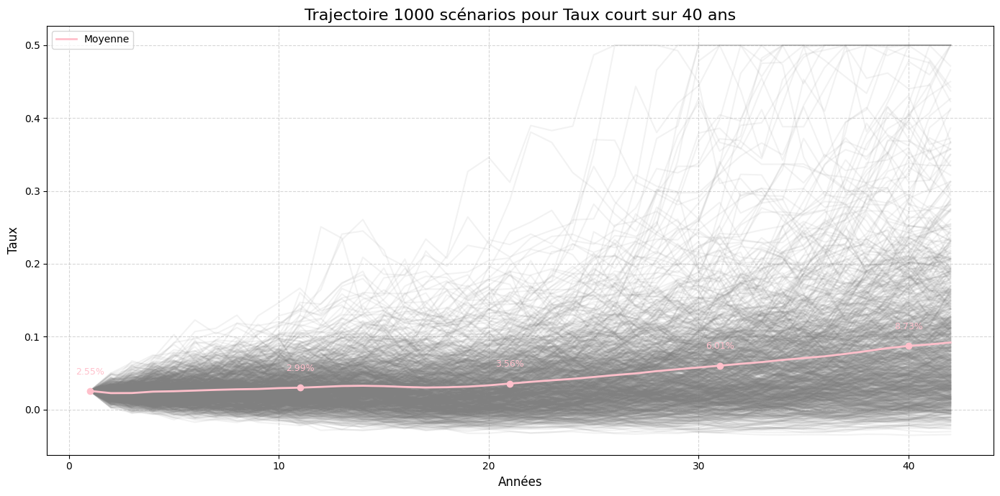

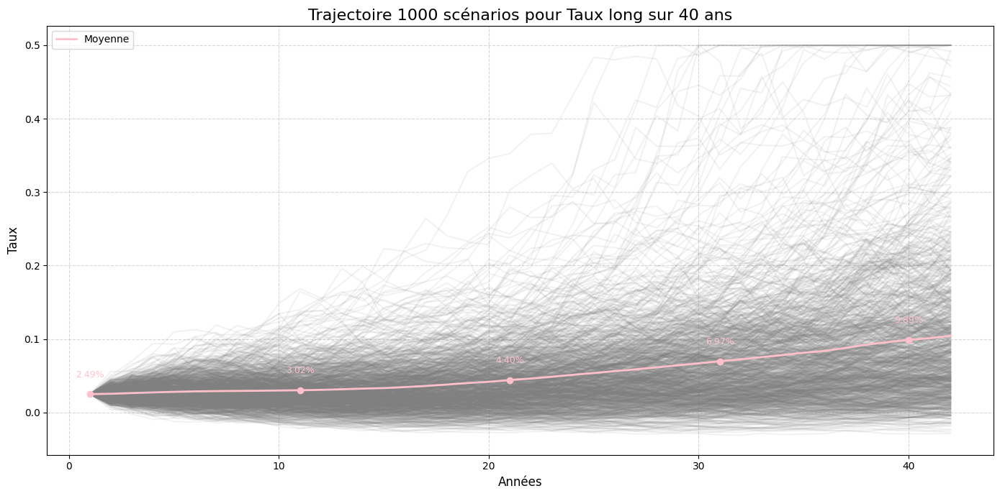

In [15]:
plot_scenario_trajectories(TL_matrix, maturities, "Trajectoire 1000 scénarios pour Taux court sur 40 ans")
plot_scenario_trajectories(TLT_matrix, maturities, "Trajectoire 1000 scénarios pour Taux long sur 40 ans")

Fonction de plot trajectoire positive & négative

In [16]:
import numpy as np
import matplotlib.pyplot as plt

def plot_positive_negative_trajectories(TL_matrix, maturities):
    """
    Sépare et trace les trajectoires positives et négatives selon la moyenne par scénario.

    Parameters:
    - TL_matrix : np.ndarray, shape (n_scenarios, n_years)
    - maturities : array-like, les années correspondantes
    """
    # Séparation des scénarios
    mean_by_scenario = TL_matrix.mean(axis=1)
    positive_indices = np.where(mean_by_scenario > 0)[0]
    negative_indices = np.where(mean_by_scenario < 0)[0]

    TL_positive = TL_matrix[positive_indices, :]
    TL_negative = TL_matrix[negative_indices, :]

    # Choix des années à annoter
    indices_to_annotate = [0, 10, 20, 30, 39]

    # 📈 Groupe 1 : Trajectoires positives
    plt.figure(figsize=(12, 6))
    for i in range(TL_positive.shape[0]):
        plt.plot(maturities, TL_positive[i, :], color='lightgreen', alpha=0.05)

    mean_pos = TL_positive.mean(axis=0)
    plt.plot(maturities, mean_pos, color='yellow', linewidth=2, label='Moyenne (positive)')

    for idx in indices_to_annotate:
        if idx < len(maturities):
            x = maturities[idx]
            y = mean_pos[idx]
            plt.scatter(x, y, color='yellow', zorder=5)
            plt.text(x, y + 0.02, f"{y*100:.2f}%", fontsize=9, ha='center', va='bottom', color='yellow')

    plt.title(f"Trajectoires positives ({len(positive_indices)} scénarios)", fontsize=16)
    plt.xlabel("Années")
    plt.ylabel("Taux")
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # 📉 Groupe 2 : Trajectoires négatives
    plt.figure(figsize=(12, 6))
    for i in range(TL_negative.shape[0]):
        plt.plot(maturities, TL_negative[i, :], color='red', alpha=0.05)

    mean_neg = TL_negative.mean(axis=0)
    plt.plot(maturities, mean_neg, color='blue', linewidth=2, label='Moyenne (négative)')

    for idx in indices_to_annotate:
        if idx < len(maturities):
            x = maturities[idx]
            y = mean_neg[idx]
            plt.scatter(x, y, color='blue', zorder=5)
            plt.text(x, y + 0.02, f"{y*100:.2f}%", fontsize=9, ha='center', va='bottom', color='blue')

    plt.title(f"Trajectoires négatives ({len(negative_indices)} scénarios)", fontsize=16)
    plt.xlabel("Années")
    plt.ylabel("Taux")
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.legend()
    plt.tight_layout()
    plt.show()

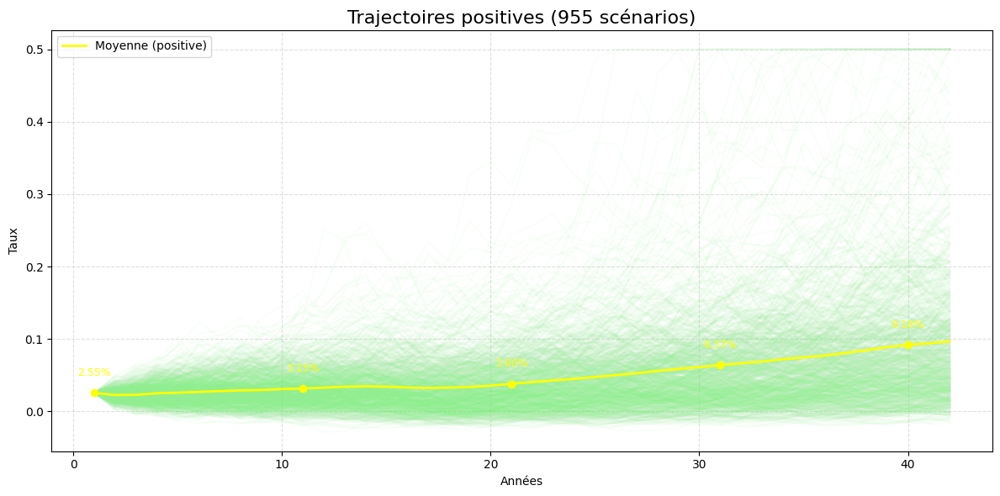

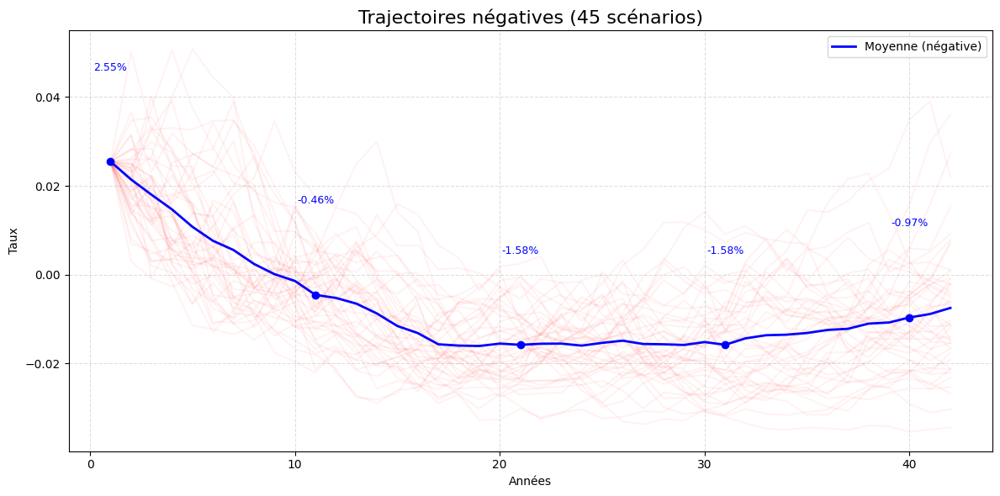

In [17]:
plot_positive_negative_trajectories(TL_matrix, maturities)

1.2 Statistiques descriptives par année ( par colonnes) sur les 1000 scnéarios

In [18]:
import numpy as np
import matplotlib.pyplot as plt

def plot_yearly_statistics(TL_matrix, maturities, plot_titre):

    # Calcul des statistiques
    mean_by_year = np.mean(TL_matrix, axis=0)
    median_by_year = np.median(TL_matrix, axis=0)
    std_by_year = np.std(TL_matrix, axis=0)
    min_by_year = np.min(TL_matrix, axis=0)
    max_by_year = np.max(TL_matrix, axis=0)

    # Indices à annoter
    indices_to_annotate = [0, 10, 20, 30, 39]

    plt.figure(figsize=(12, 6))

    # Tracer les courbes principales
    plt.plot(maturities, mean_by_year, label='Moyenne', color='blue', linewidth=2)
    plt.plot(maturities, median_by_year, label='Médiane', color='green', linestyle='--')
    plt.plot(maturities, min_by_year, label='Min', color='red', linestyle=':')
    plt.plot(maturities, max_by_year, label='Max', color='orange', linestyle=':')

    # Zone ±1 écart-type
    plt.fill_between(maturities,
                     mean_by_year - std_by_year,
                     mean_by_year + std_by_year,
                     alpha=0.2, label='Moyenne ±1σ', color='lightblue')

    # Points annotés
    for idx in indices_to_annotate:
        if idx < len(maturities):
            x = maturities[idx]

            y_mean = mean_by_year[idx]
            plt.scatter(x, y_mean, color='blue', zorder=5)
            plt.text(x, y_mean + 0.005, f"{y_mean*100:.2f}%", fontsize=9, ha='center', va='bottom', color='blue')

            y_median = median_by_year[idx]
            plt.scatter(x, y_median, color='green', zorder=5)
            plt.text(x, y_median + 0.005, f"{y_median*100:.2f}%", fontsize=9, ha='center', va='bottom', color='green')

            y_min = min_by_year[idx]
            plt.scatter(x, y_min, color='red', zorder=5)
            plt.text(x, y_min + 0.005, f"{y_min*100:.2f}%", fontsize=9, ha='center', va='bottom', color='red')

            y_max = max_by_year[idx]
            plt.scatter(x, y_max, color='orange', zorder=5)
            plt.text(x, y_max + 0.005, f"{y_max*100:.2f}%", fontsize=9, ha='center', va='bottom', color='orange')

    # Personnalisation
    plt.title(plot_titre, fontsize=16)
    plt.xlabel("Années", fontsize=12)
    plt.ylabel("Taux", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.legend()
    plt.tight_layout()
    plt.show()

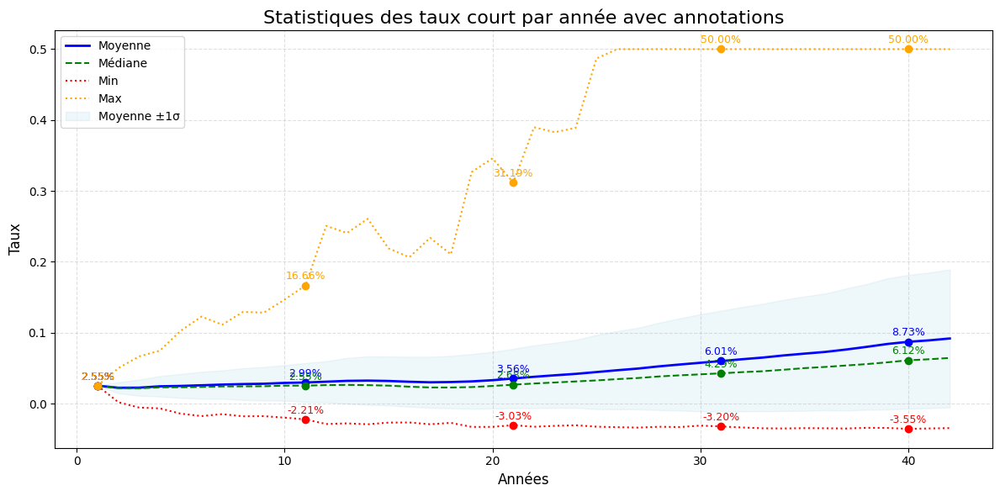

In [19]:
plot_yearly_statistics(TL_matrix, maturities, "Statistiques des taux court par année avec annotations")

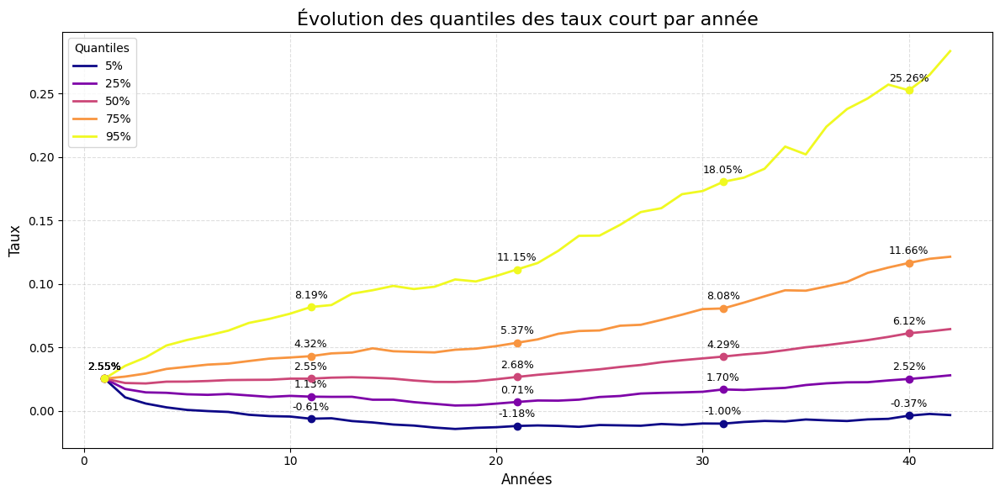

In [20]:

#*******************************************************************
# 1.2.2 - Quantile sur 1000 scénarios par année
#*******************************************************************
# Définir les niveaux de quantiles
quantile_levels = [0.05, 0.25, 0.5, 0.75, 0.95]

# Créer un DataFrame pour stocker les quantiles
quantile_df = pd.DataFrame(index=quantile_levels, columns=maturities)

# Calculer les quantiles pour chaque année
for i, year in enumerate(maturities):
    quantile_df[year] = np.quantile(TL_matrix[:, i], quantile_levels)

# Choisir les indices d'années à annoter (ex : début, milieu, fin)
indices_to_annotate = [0, 10, 20, 30, 39]

# Tracer les courbes de quantiles
plt.figure(figsize=(12, 6))
colors = plt.cm.plasma(np.linspace(0, 1, len(quantile_levels)))

for i, q in enumerate(quantile_levels):
    y_values = quantile_df.loc[q]
    plt.plot(maturities, y_values, label=f"{int(q*100)}%", color=colors[i], linewidth=2)

    # Ajouter des points annotés
    for idx in indices_to_annotate:
        x = maturities[idx]
        y = y_values.iloc[idx]
        plt.scatter(x, y, color=colors[i], zorder=5)
        plt.text(x, y + 0.005, f"{y*100:.2f}%", fontsize=9, ha='center', va='bottom', color='black')

# Personnalisation
plt.title("Évolution des quantiles des taux court par année", fontsize=16)
plt.xlabel("Années", fontsize=12)
plt.ylabel("Taux", fontsize=12)
plt.legend(title="Quantiles")
plt.grid(True, linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()


1.3 Analyse par scénario / par ligne sur 40ans de projection

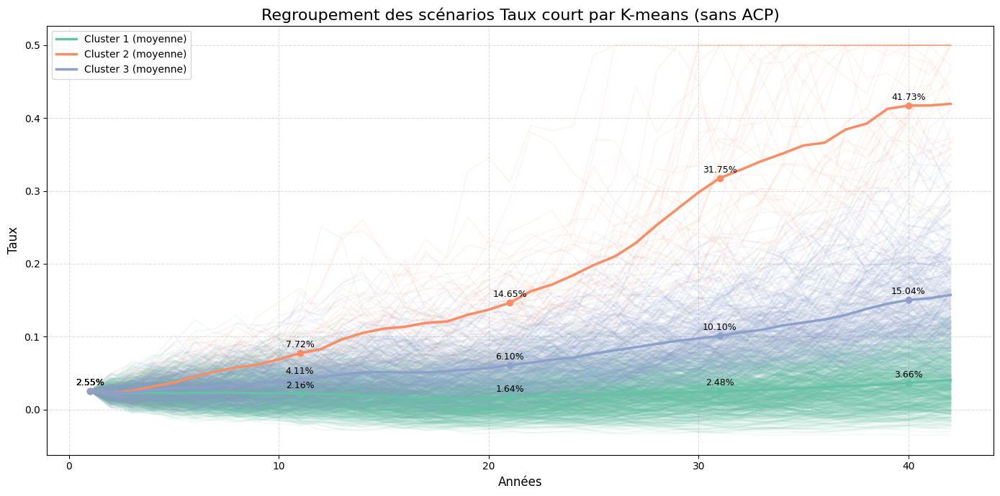

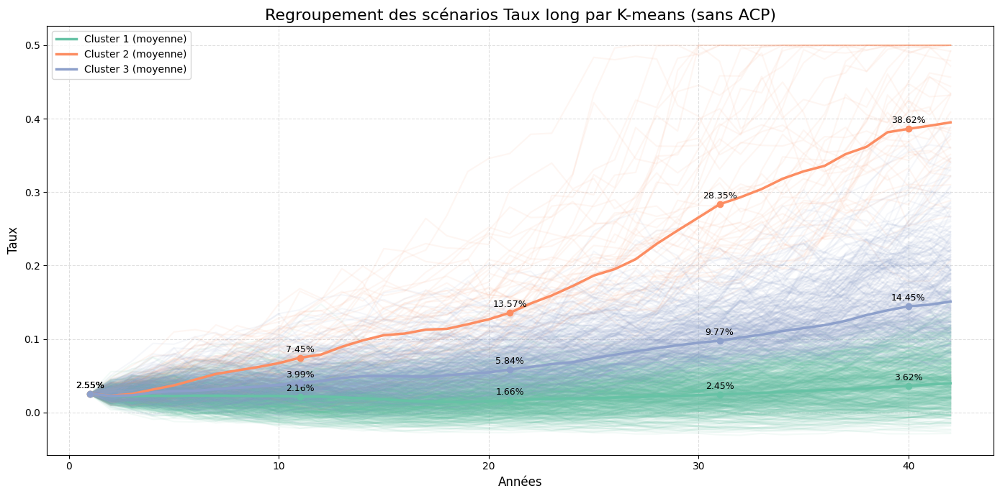

In [21]:
# ****************************************************************** Tuax court ******* axis = 0, par ligne/par scénario **************************************************
# Étape 1 : Appliquer K-means sur les scénarios
k = 3  # nombre de groupes à ajuster selon ton besoin
kmeans = KMeans(n_clusters=k, random_state=42)
labels = kmeans.fit_predict(TL_matrix)

# Étape 2 : Visualiser les scénarios regroupés
plt.figure(figsize=(14, 7))
palette = sns.color_palette("Set2", k)

for cluster in range(k):
    cluster_indices = np.where(labels == cluster)[0]
    for i in cluster_indices:
        plt.plot(maturities, TL_matrix[i, :], color=palette[cluster], alpha=0.08)

# Ajouter les moyennes de chaque cluster
for cluster in range(k):
    cluster_indices = np.where(labels == cluster)[0]
    cluster_mean = TL_matrix[cluster_indices].mean(axis=0)
    plt.plot(maturities, cluster_mean, color=palette[cluster], linewidth=2.5, label=f'Cluster {cluster+1} (moyenne)')

    # Choisir les années à annoter (ex : tous les 10 ans)
    indices_to_annotate = [0, 10, 20, 30, 39]

    for idx in indices_to_annotate:
        x = maturities[idx]
        y = cluster_mean[idx]
        plt.scatter(x, y, color=palette[cluster], zorder=5)
        plt.text(x, y+0.005, f"{y*100:.2f}%", fontsize=9, ha='center', va='bottom', color='black')

# Personnalisation
plt.title("Regroupement des scénarios Taux court par K-means (sans ACP)", fontsize=16)
plt.xlabel("Années", fontsize=12)
plt.ylabel("Taux", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.4)
plt.legend()
plt.tight_layout()
plt.show()


# ****************************************************************** Tuax long ******* axis = 0, par ligne/par scénario **************************************************
# Étape 1 : Appliquer K-means sur les scénarios
k = 3  # nombre de groupes à ajuster selon ton besoin
kmeans = KMeans(n_clusters=k, random_state=42)
labels = kmeans.fit_predict(TLT_matrix)

# Étape 2 : Visualiser les scénarios regroupés
plt.figure(figsize=(14, 7))
palette = sns.color_palette("Set2", k)

for cluster in range(k):
    cluster_indices = np.where(labels == cluster)[0]
    for i in cluster_indices:
        plt.plot(maturities, TLT_matrix[i, :], color=palette[cluster], alpha=0.08)

# Ajouter les moyennes de chaque cluster
for cluster in range(k):
    cluster_indices = np.where(labels == cluster)[0]
    cluster_mean = TL_matrix[cluster_indices].mean(axis=0)
    plt.plot(maturities, cluster_mean, color=palette[cluster], linewidth=2.5, label=f'Cluster {cluster+1} (moyenne)')

    for idx in indices_to_annotate:
        x = maturities[idx]
        y = cluster_mean[idx]
        plt.scatter(x, y, color=palette[cluster], zorder=5)
        plt.text(x, y+0.005, f"{y*100:.2f}%", fontsize=9, ha='center', va='bottom', color='black')

# Personnalisation
plt.title("Regroupement des scénarios Taux long par K-means (sans ACP)", fontsize=16)
plt.xlabel("Années", fontsize=12)
plt.ylabel("Taux", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.4)
plt.legend()
plt.tight_layout()
plt.show()

In [22]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

def cluster_scenarios_kmeans(TL_matrix, plot_title, k=3):

    # Étape 1 : Clustering
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(TL_matrix)

    # Étape 2 : Coordonnées des points
    mean_by_scenario = TL_matrix.mean(axis=1)
    std_by_scenario = TL_matrix.std(axis=1)

    # Étape 3 : Visualisation
    plt.figure(figsize=(10, 7))
    palette = sns.color_palette("Set2", k)
    sns.scatterplot(x=mean_by_scenario, y=std_by_scenario, hue=labels,
                    palette=palette, s=50, alpha=0.8)

    # Étape 4 : Annotation des clusters
    for cluster in range(k):
        indices = np.where(labels == cluster)[0]
        x_cluster = mean_by_scenario[indices]
        y_cluster = std_by_scenario[indices]
        count = len(indices)
        x_text = np.median(x_cluster)
        y_text = np.median(y_cluster)
        plt.text(x_text, y_text, f"{count} scénarios", fontsize=12, weight='bold',
                 ha='center', va='center',
                 bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))

    # Personnalisation
    plt.title(plot_title, fontsize=16)
    plt.xlabel("Moyenne du scénario", fontsize=12)
    plt.ylabel("Volatilité du scénario (écart-type)", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.legend(title="Cluster")
    plt.tight_layout()
    plt.show()

    # Regrouper les indices par cluster
    scenarios_by_cluster = {}
    for cluster_id in range(k):
        indices = np.where(labels == cluster_id)[0]
        scenarios_by_cluster[f"Cluster_{cluster_id}"] = indices.tolist()

    # Affichage résumé
    for name, scenario_list in scenarios_by_cluster.items():
        print(f"{name} contient {len(scenario_list)} scénarios :")
        print(scenario_list[:20])
        print("...")

    return scenarios_by_cluster

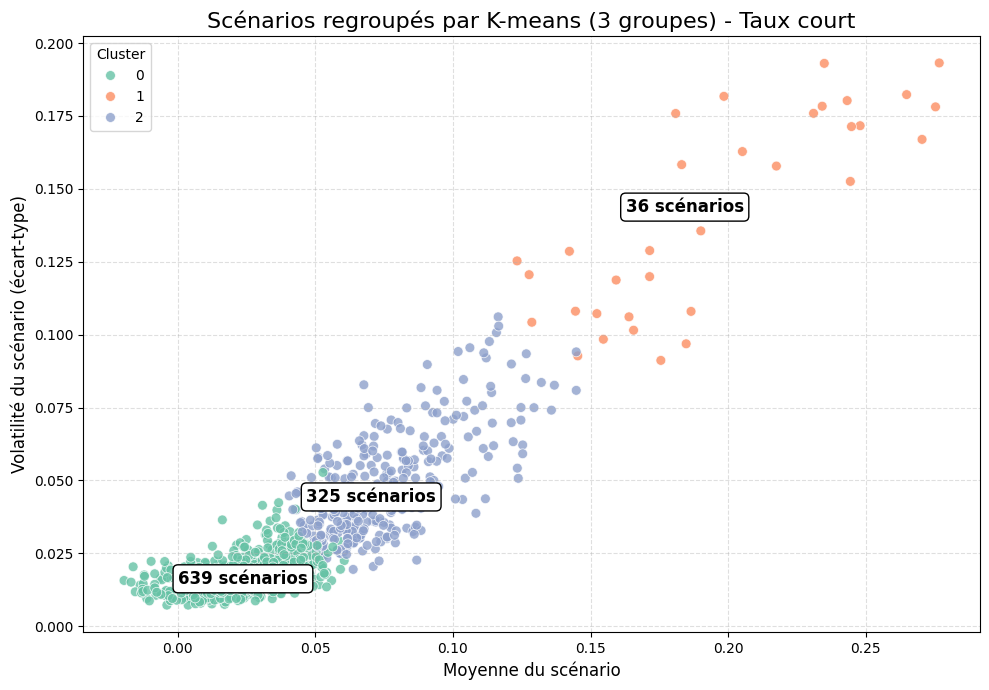

Cluster_0 contient 639 scénarios :
[0, 2, 4, 5, 7, 9, 11, 12, 13, 14, 15, 16, 19, 20, 21, 22, 23, 25, 26, 29]
...
Cluster_1 contient 36 scénarios :
[18, 28, 70, 76, 133, 191, 213, 272, 297, 314, 339, 363, 368, 373, 385, 450, 485, 513, 555, 581]
...
Cluster_2 contient 325 scénarios :
[1, 3, 6, 8, 10, 17, 24, 27, 31, 33, 35, 38, 40, 44, 47, 49, 54, 56, 61, 63]
...


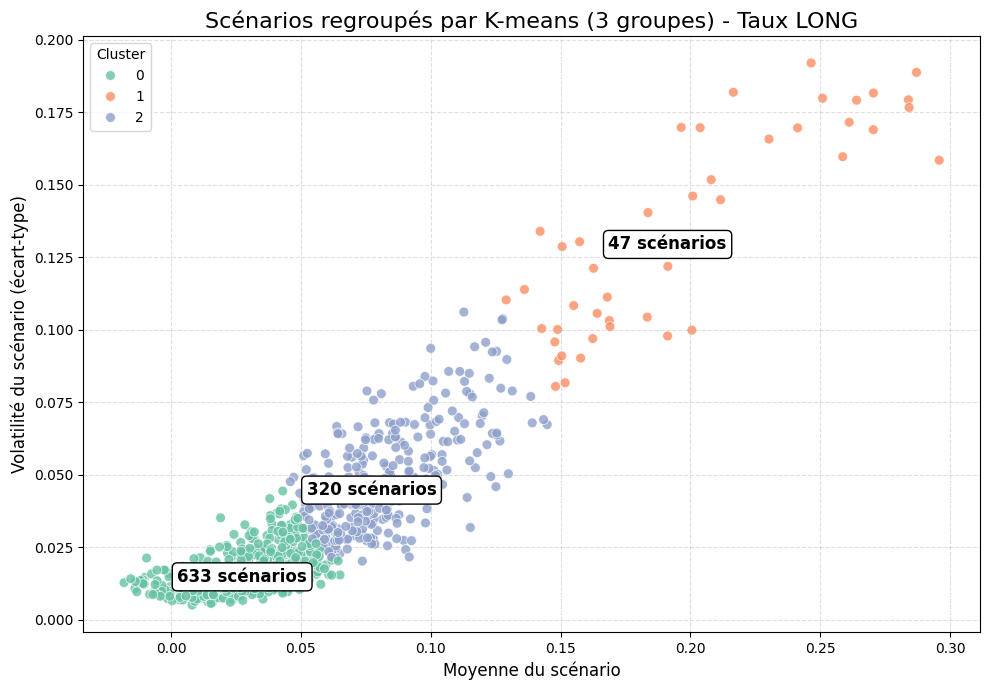

Cluster_0 contient 633 scénarios :
[0, 2, 5, 7, 9, 11, 12, 14, 15, 16, 19, 20, 21, 22, 23, 25, 26, 29, 30, 32]
...
Cluster_1 contient 47 scénarios :
[18, 27, 28, 70, 76, 133, 191, 213, 272, 297, 314, 317, 339, 363, 368, 373, 385, 394, 450, 485]
...
Cluster_2 contient 320 scénarios :
[1, 3, 4, 6, 8, 10, 13, 17, 24, 31, 33, 35, 38, 40, 44, 47, 49, 52, 54, 56]
...


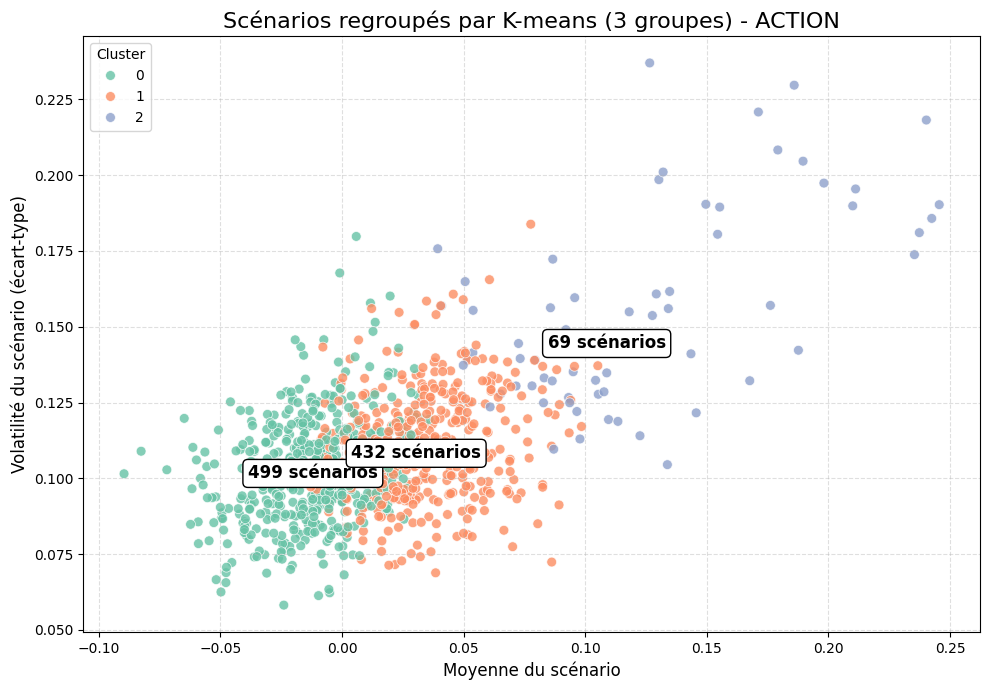

Cluster_0 contient 499 scénarios :
[0, 2, 5, 7, 9, 11, 12, 15, 16, 19, 21, 22, 24, 26, 29, 30, 32, 34, 37, 39]
...
Cluster_1 contient 432 scénarios :
[1, 3, 4, 8, 10, 13, 14, 17, 20, 23, 25, 33, 35, 36, 38, 40, 42, 44, 47, 49]
...
Cluster_2 contient 69 scénarios :
[6, 18, 27, 28, 31, 70, 76, 133, 191, 213, 218, 225, 247, 272, 297, 314, 317, 339, 342, 348]
...


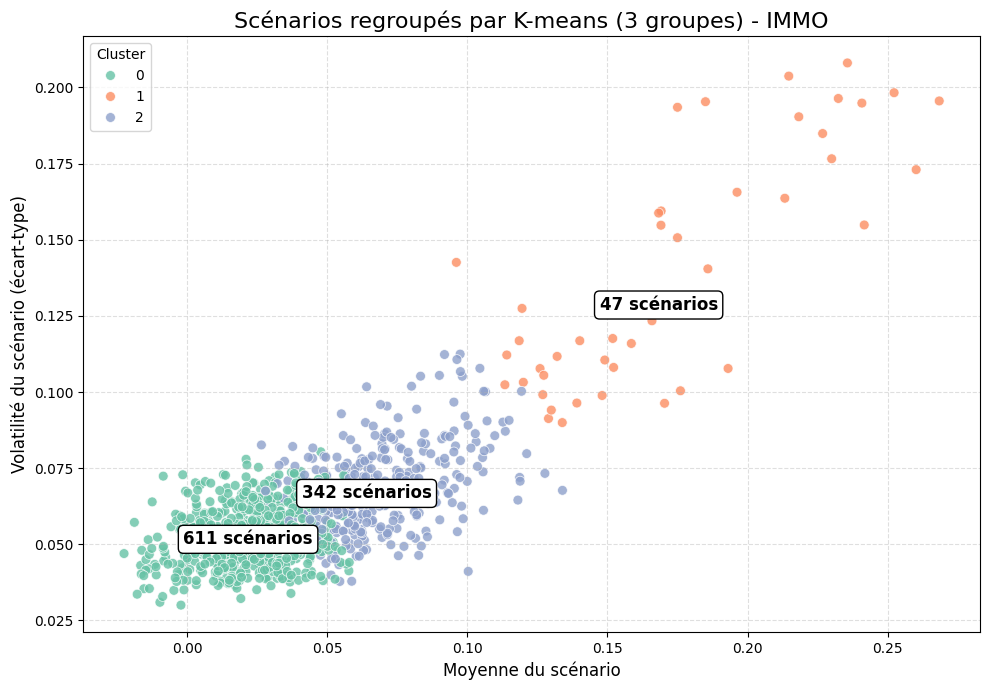

Cluster_0 contient 611 scénarios :
[0, 2, 4, 5, 7, 9, 11, 12, 14, 15, 16, 19, 20, 21, 22, 25, 26, 29, 30, 32]
...
Cluster_1 contient 47 scénarios :
[18, 27, 28, 70, 76, 133, 191, 213, 218, 272, 297, 314, 317, 339, 363, 368, 373, 385, 394, 450]
...
Cluster_2 contient 342 scénarios :
[1, 3, 6, 8, 10, 13, 17, 23, 24, 31, 33, 35, 36, 38, 40, 44, 47, 49, 54, 56]
...


In [23]:
scenarios_by_cluster = cluster_scenarios_kmeans(TL_matrix, "Scénarios regroupés par K-means (3 groupes) - Taux court")
scenarios_by_cluster = cluster_scenarios_kmeans(TLT_matrix, "Scénarios regroupés par K-means (3 groupes) - Taux LONG")
scenarios_by_cluster = cluster_scenarios_kmeans(ACT_matrix, "Scénarios regroupés par K-means (3 groupes) - ACTION")
scenarios_by_cluster = cluster_scenarios_kmeans(IMMO_matrix, "Scénarios regroupés par K-means (3 groupes) - IMMO")

TL_matrix.shape[0] :  1000
Corrélation moyenne : 0.838
Corrélation min : 0.086
Corrélation max : 0.993


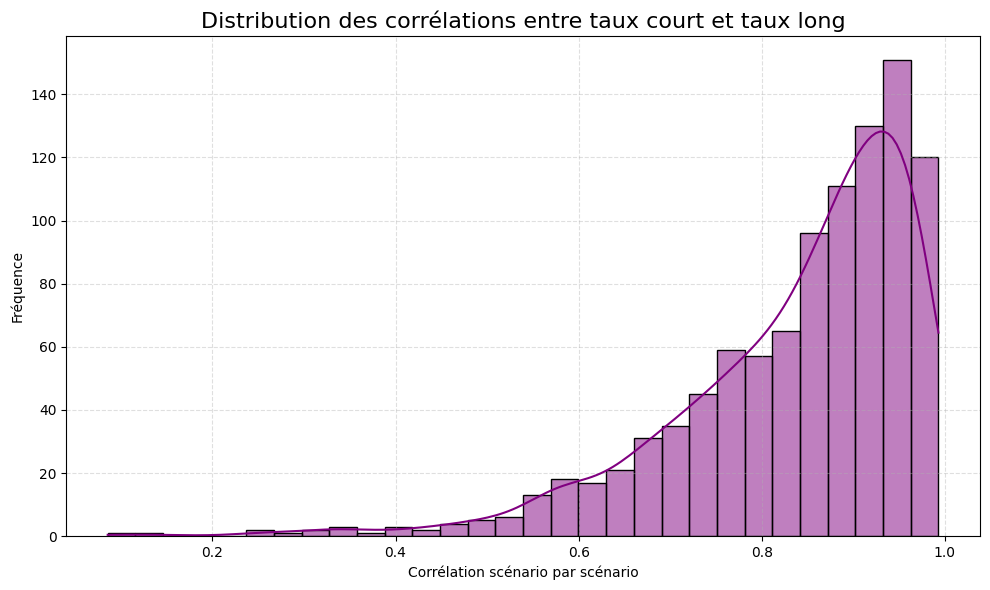

In [24]:

# Vérification des dimensions
assert TL_matrix.shape == TLT_matrix.shape, "Les deux matrices doivent avoir la même forme"
print("TL_matrix.shape[0] : ", TL_matrix.shape[0])

# Étape 1 : Calcul de la corrélation scénario par scénario
correlations = []
for i in range(TL_matrix.shape[0]):
    corr = np.corrcoef(TL_matrix[i], TLT_matrix[i])[0, 1]
    correlations.append(corr)

correlations = np.array(correlations)

# Étape 2 : Statistiques descriptives
print(f"Corrélation moyenne : {np.mean(correlations):.3f}")
print(f"Corrélation min : {np.min(correlations):.3f}")
print(f"Corrélation max : {np.max(correlations):.3f}")

# Étape 3 : Visualisation de la distribution des corrélations
plt.figure(figsize=(10, 6))
sns.histplot(correlations, bins=30, kde=True, color='purple')
plt.title("Distribution des corrélations entre taux court et taux long", fontsize=16)
plt.xlabel("Corrélation scénario par scénario")
plt.ylabel("Fréquence")
plt.grid(True, linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

1.4 Quantiles Par année

# Section 3 - étude statistique exploratoire BE & PVFP

📊 Statistiques descriptives :
                 BE          PVFP
count  1.000000e+03  1.000000e+03
mean   1.182987e+07  8.185805e+05
std    1.324786e+06  3.501355e+05
min    7.933769e+06 -1.162633e+06
25%    1.094081e+07  6.754256e+05
50%    1.173189e+07  8.348527e+05
75%    1.260535e+07  1.020289e+06
max    1.752459e+07  1.867620e+06

🔗 Corrélation BE ↔ PVFP : 0.0428


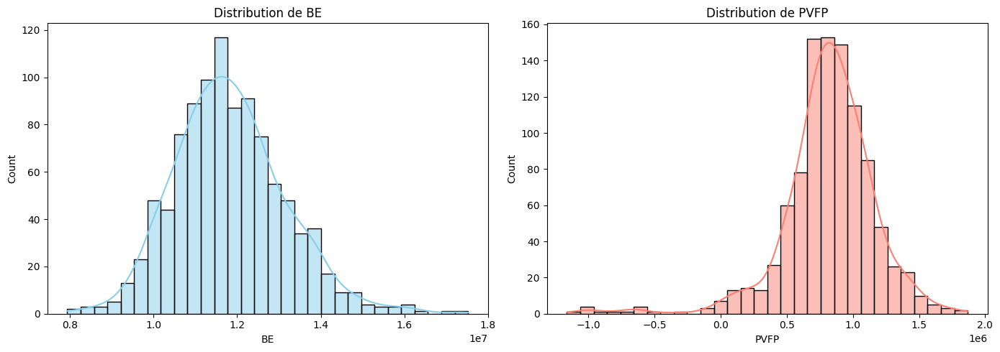

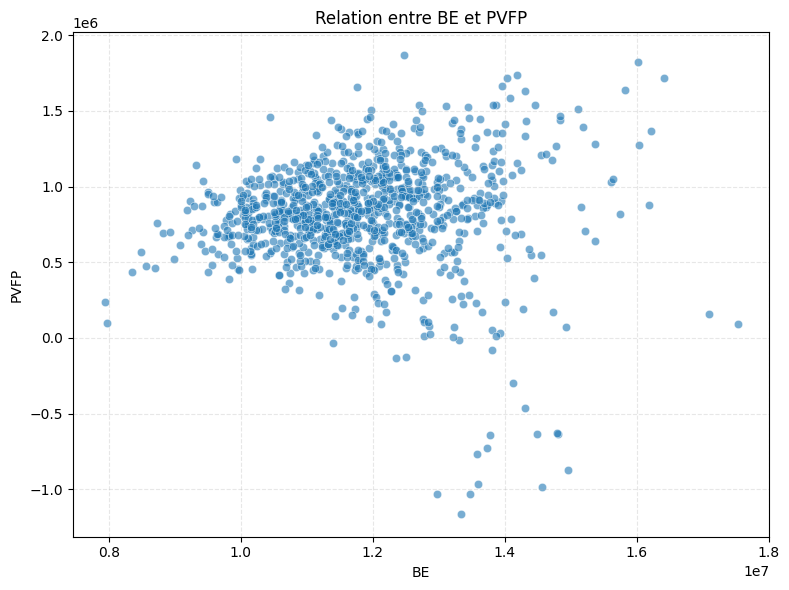

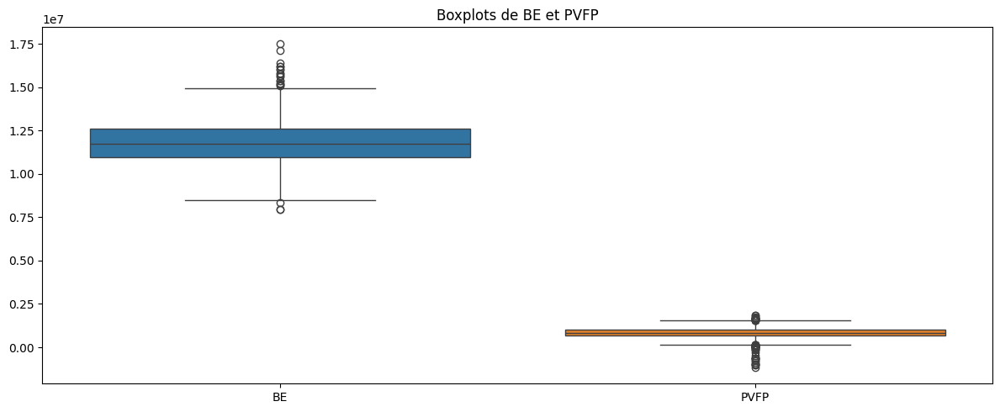

In [25]:

# Charger les données
df = pd.read_excel("BE_PVFP.xlsx", header=None)
df.columns = ["Scenario", "BE", "PVFP"]

# Nettoyage : suppression des lignes vides ou non numériques
df = df[pd.to_numeric(df["BE"], errors='coerce').notnull()]
df = df[pd.to_numeric(df["PVFP"], errors='coerce').notnull()]
df["BE"] = df["BE"].astype(float)
df["PVFP"] = df["PVFP"].astype(float)

# Statistiques descriptives
print("📊 Statistiques descriptives :")
print(df[["BE", "PVFP"]].describe())

# Corrélation
correlation = df["BE"].corr(df["PVFP"])
print(f"\n🔗 Corrélation BE ↔ PVFP : {correlation:.4f}")

# Histogrammes
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
sns.histplot(df["BE"], bins=30, kde=True, color='skyblue')
plt.title("Distribution de BE")
plt.xlabel("BE")

plt.subplot(1, 2, 2)
sns.histplot(df["PVFP"], bins=30, kde=True, color='salmon')
plt.title("Distribution de PVFP")
plt.xlabel("PVFP")

plt.tight_layout()
plt.show()

# Nuage de points
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x="BE", y="PVFP", alpha=0.6)
plt.title("Relation entre BE et PVFP")
plt.xlabel("BE")
plt.ylabel("PVFP")
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Boxplots
plt.figure(figsize=(12, 5))
sns.boxplot(data=df[["BE", "PVFP"]])
plt.title("Boxplots de BE et PVFP")
plt.tight_layout()
plt.show()

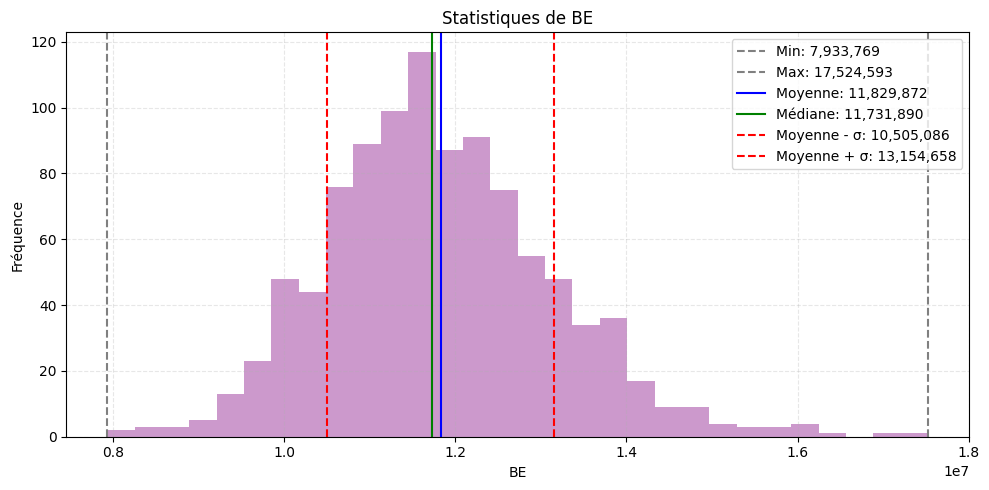

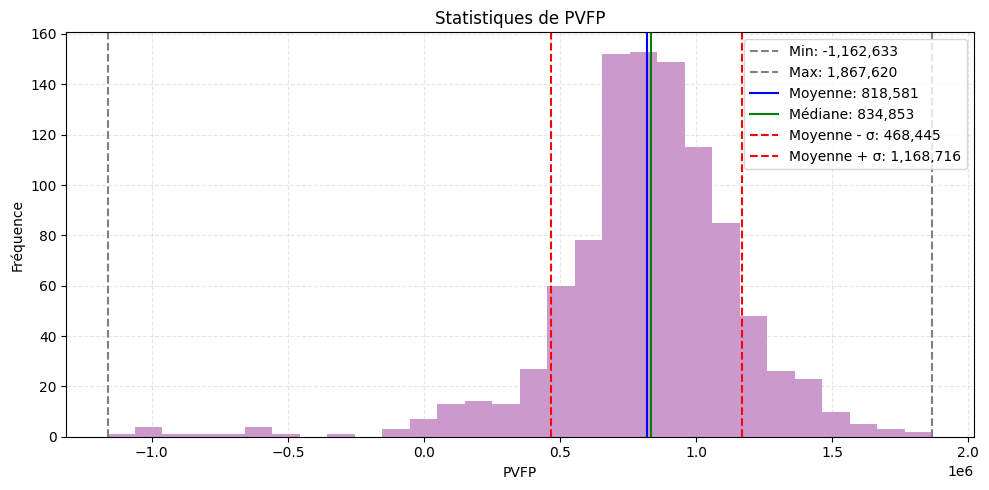

In [26]:

# Charger les données
df = pd.read_excel("BE_PVFP.xlsx", header=None)
df.columns = ["Scenario", "BE", "PVFP"]

# Nettoyage
df = df[pd.to_numeric(df["BE"], errors='coerce').notnull()]
df = df[pd.to_numeric(df["PVFP"], errors='coerce').notnull()]
df["BE"] = df["BE"].astype(float)
df["PVFP"] = df["PVFP"].astype(float)

# Fonction pour tracer les statistiques
def plot_stat_summary(variable, name):
    data = df[variable]
    mean = data.mean()
    std = data.std()
    median = data.median()
    min_val = data.min()
    max_val = data.max()

    plt.figure(figsize=(10, 5))
    plt.axvline(min_val, color='gray', linestyle='--', label=f"Min: {min_val:,.0f}")
    plt.axvline(max_val, color='gray', linestyle='--', label=f"Max: {max_val:,.0f}")
    plt.axvline(mean, color='blue', linestyle='-', label=f"Moyenne: {mean:,.0f}")
    plt.axvline(median, color='green', linestyle='-', label=f"Médiane: {median:,.0f}")
    plt.axvline(mean - std, color='red', linestyle='--', label=f"Moyenne - σ: {(mean - std):,.0f}")
    plt.axvline(mean + std, color='red', linestyle='--', label=f"Moyenne + σ: {(mean + std):,.0f}")

    plt.hist(data, bins=30, alpha=0.4, color='purple')
    plt.title(f"Statistiques de {name}")
    plt.xlabel(name)
    plt.ylabel("Fréquence")
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()

# Tracer pour BE
plot_stat_summary("BE", "BE")

# Tracer pour PVFP
plot_stat_summary("PVFP", "PVFP")


Clustering corrélation ( BE, PVFP)

In [27]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

def cluster_be_pvfp(be_df, pvfp_df, plot_title="Clustering BE vs PVFP", k=3):

    # Étape 1 : Construction de la matrice
    data_matrix = np.column_stack((be_df["BE"].values, pvfp_df["PVFP"].values))

    # Étape 2 : Clustering
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(data_matrix)

    # Étape 3 : Visualisation
    plt.figure(figsize=(10, 7))
    palette = sns.color_palette("Set2", k)
    sns.scatterplot(x=data_matrix[:, 0], y=data_matrix[:, 1], hue=labels,
                    palette=palette, s=60, alpha=0.85)

    # Annotation des clusters
    for cluster in range(k):
        indices = np.where(labels == cluster)[0]
        x_cluster = data_matrix[indices, 0]
        y_cluster = data_matrix[indices, 1]
        count = len(indices)
        x_text = np.median(x_cluster)
        y_text = np.median(y_cluster)
        plt.text(x_text, y_text, f"{count} scénarios", fontsize=12, weight='bold',
                 ha='center', va='center',
                 bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))

    # Personnalisation
    plt.title(plot_title, fontsize=16)
    plt.xlabel("BE", fontsize=12)
    plt.ylabel("PVFP", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.legend(title="Cluster")
    plt.tight_layout()
    plt.show()

    # Regrouper les indices par cluster
    scenarios_by_cluster = {}
    for cluster_id in range(k):
        indices = np.where(labels == cluster_id)[0]
        scenarios_by_cluster[f"Cluster_{cluster_id}"] = indices.tolist()

    # Affichage résumé
    #for name, scenario_list in scenarios_by_cluster.items():
    #    print(f"{name} contient {len(scenario_list)} scénarios :")
    #    print(scenario_list[:20])
    #    print("...")

    return scenarios_by_cluster

In [28]:
# cluster_be_pvfp(be_df, pvfp_df, plot_title="Clustering des scénarios BE vs PVFP", k=3)

Clustering PVFP

In [29]:
def cluster_pvfp(pvfp_df, plot_title="Clustering sur PVFP", k=3):
    pvfp_values = pvfp_df["PVFP"].values.reshape(-1, 1)
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(pvfp_values)

    plt.figure(figsize=(10, 5))
    palette = sns.color_palette("Set2", k)
    sns.scatterplot(x=range(len(pvfp_values)), y=pvfp_values.flatten(), hue=labels,
                    palette=palette, s=60, alpha=0.85)

    # Ajouter le nombre de points par cluster
    for cluster_id in range(k):
        indices = np.where(labels == cluster_id)[0]
        y_cluster = pvfp_values[indices].flatten()
        x_text = np.median(indices)
        y_text = np.median(y_cluster)
        count = len(indices)
        plt.text(x_text, y_text, f"{count} pts", fontsize=11, weight='bold',
                 ha='center', va='center',
                 bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))

    plt.title(plot_title, fontsize=16)
    plt.xlabel("Index scénario", fontsize=12)
    plt.ylabel("PVFP", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.legend(title="Cluster")
    plt.tight_layout()
    plt.show()

    clusters = {}
    for cluster_id in range(k):
        indices = np.where(labels == cluster_id)[0]
        clusters[f"Cluster_{cluster_id}"] = indices.tolist()
        # print(f"Cluster_{cluster_id} contient {len(indices)} scénarios : {indices[:20]}...")
        clusters[f"Cluster_{cluster_id}"] = indices
        print(f"Cluster_{cluster_id} contient {len(indices)} scénarios:")
        print("Premiers 20 scénarios :", ", ".join(map(str, indices[:20])))

    return clusters

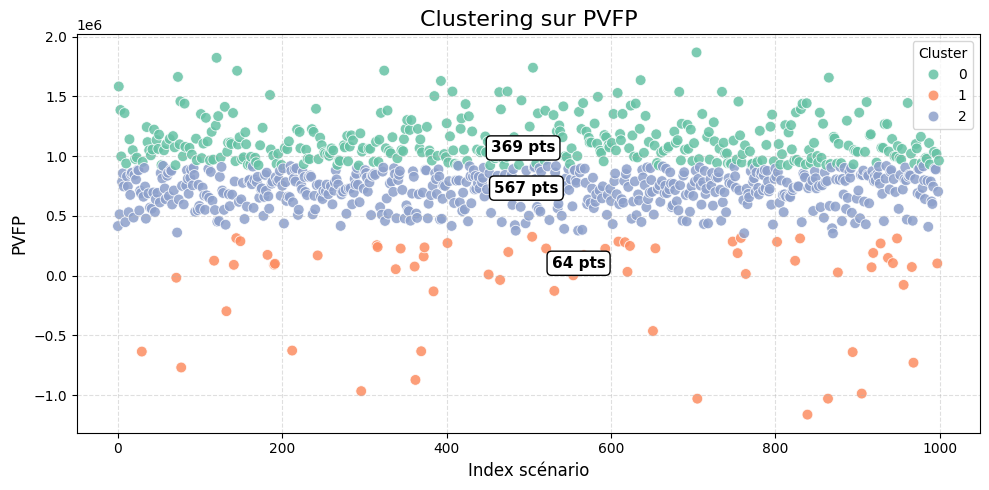

Cluster_0 contient 369 scénarios:
Premiers 20 scénarios : 1, 3, 4, 8, 10, 14, 18, 21, 23, 30, 35, 36, 38, 40, 42, 44, 47, 49, 50, 53
Cluster_1 contient 64 scénarios:
Premiers 20 scénarios : 29, 71, 77, 117, 132, 141, 144, 149, 182, 190, 191, 212, 243, 296, 315, 316, 338, 344, 361, 362
Cluster_2 contient 567 scénarios:
Premiers 20 scénarios : 0, 2, 5, 6, 7, 9, 11, 12, 13, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28


{'Cluster_0': array([  1,   3,   4,   8,  10,  14,  18,  21,  23,  30,  35,  36,  38,
         40,  42,  44,  47,  49,  50,  53,  56,  59,  63,  67,  69,  70,
         73,  75,  76,  79,  81,  82,  87,  90,  95,  96, 101, 102, 104,
        107, 109, 112, 114, 116, 119, 120, 122, 125, 130, 133, 134, 137,
        138, 140, 143, 145, 146, 148, 151, 153, 155, 156, 158, 161, 162,
        167, 168, 171, 173, 176, 185, 186, 189, 193, 195, 199, 203, 206,
        208, 218, 221, 222, 226, 229, 231, 233, 236, 238, 241, 244, 246,
        248, 251, 252, 255, 257, 258, 260, 262, 267, 269, 270, 275, 276,
        279, 280, 282, 284, 286, 293, 295, 297, 298, 305, 307, 311, 314,
        317, 318, 320, 324, 326, 328, 330, 332, 334, 340, 345, 347, 348,
        350, 352, 355, 357, 365, 367, 368, 370, 376, 379, 380, 382, 385,
        389, 393, 397, 399, 400, 402, 404, 407, 408, 410, 413, 417, 418,
        421, 423, 425, 427, 431, 437, 441, 442, 447, 448, 450, 453, 455,
        456, 459, 460, 463, 464, 466, 

In [30]:
cluster_pvfp(pvfp_df, k=3)

Exemple Clustering 1 : afficher pour 4 paramètres les trajectoires classifiés dans le clustering 1

In [31]:
import matplotlib.pyplot as plt
import numpy as np

def plot_individual_gse(cluster_indices, TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix, cluster_id=1):
    params = {
        "Taux court (TL)": TL_matrix,
        "Taux long (TLT)": TLT_matrix,
        "Action (ACT)": ACT_matrix,
        "Immobilier (IMMO)": IMMO_matrix
    }

    # S'assurer que cluster_indices est une liste d'entiers
    cluster_indices = list(np.array(cluster_indices).flatten())

    for name, matrix in params.items():
        plt.figure(figsize=(12, 5))

        # Tracer chaque trajectoire
        for idx in cluster_indices:
            plt.plot(range(matrix.shape[1]), matrix[idx, :], alpha=0.4, linewidth=1)

        # 🔍 Trouver les deux trajectoires les plus hautes
        max_vals = []
        for idx in cluster_indices:
            local_max = matrix[idx, :].max()
            max_vals.append((local_max, idx))

        # Trier par valeur max décroissante
        max_vals_sorted = sorted(max_vals, key=lambda x: x[0], reverse=True)

        # Prendre les deux premiers
        top_two = max_vals_sorted[:2]

        # Ajouter une annotation pour chacun
        for rank, (val, idx) in enumerate(top_two, start=1):
            year_max = np.argmax(matrix[idx, :])  # année où la valeur est max
            plt.plot(range(matrix.shape[1]), matrix[idx, :], linewidth=2,
                     label=f"Top {rank} – Scénario {idx}")
            plt.text(year_max, val, f"Scénario {idx}", fontsize=11, weight="bold",
                     ha="center", va="bottom", color="black",
                     bbox=dict(facecolor="white", edgecolor="black", boxstyle="round,pad=0.3"))

        # Ajuster les axes
        plt.title(f"Trajectoires individuelles – {name} – Cluster {cluster_id}", fontsize=15)
        plt.xlabel("Année", fontsize=12)
        plt.ylabel("Valeur", fontsize=12)
        plt.grid(True, linestyle='--', alpha=0.5)

        # 🔧 Forcer l'échelle demandée
        plt.xlim(0, 45)       # Axe X jusqu’à 45 ans
        plt.ylim(top=0.8)     # Borne supérieure fixée à 0.8, borne inférieure automatique

        plt.legend()
        plt.tight_layout()
        plt.show()

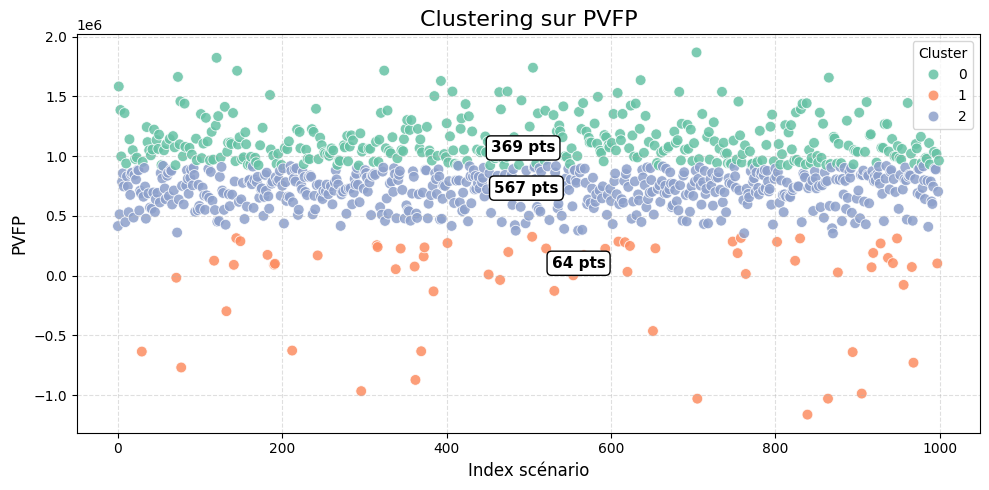

Cluster_0 contient 369 scénarios:
Premiers 20 scénarios : 1, 3, 4, 8, 10, 14, 18, 21, 23, 30, 35, 36, 38, 40, 42, 44, 47, 49, 50, 53
Cluster_1 contient 64 scénarios:
Premiers 20 scénarios : 29, 71, 77, 117, 132, 141, 144, 149, 182, 190, 191, 212, 243, 296, 315, 316, 338, 344, 361, 362
Cluster_2 contient 567 scénarios:
Premiers 20 scénarios : 0, 2, 5, 6, 7, 9, 11, 12, 13, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28


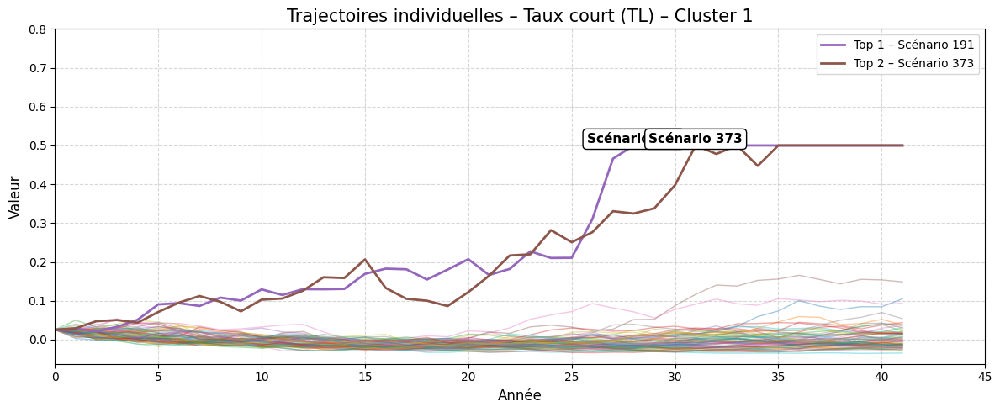

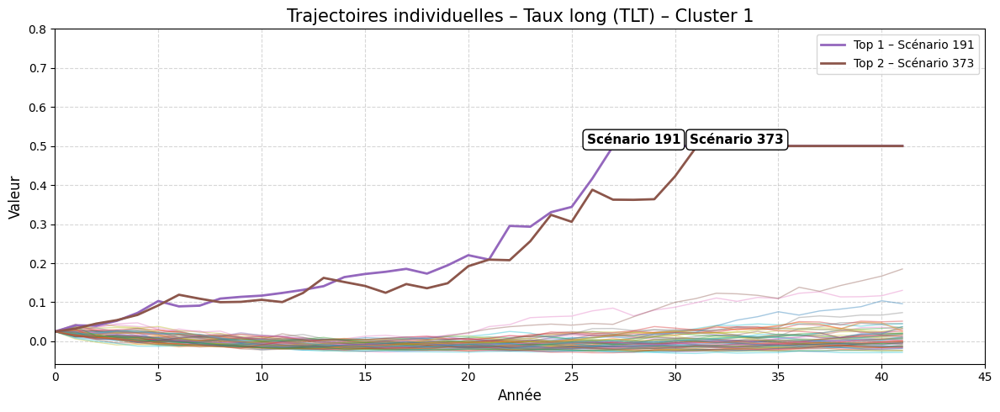

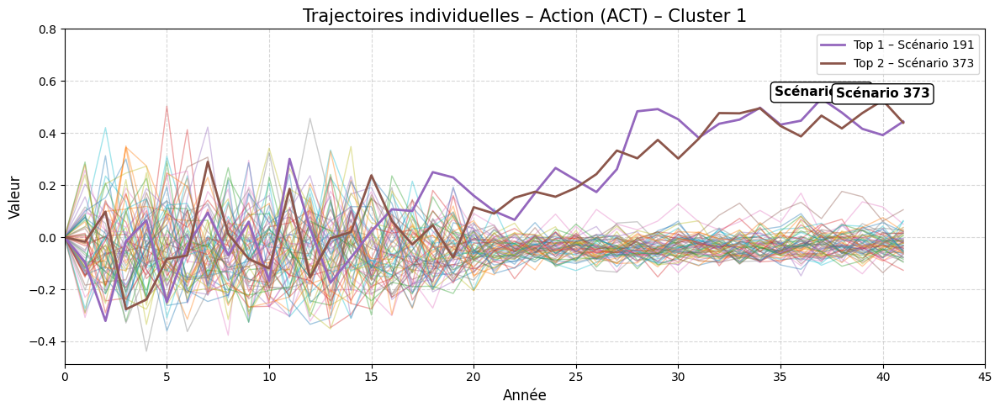

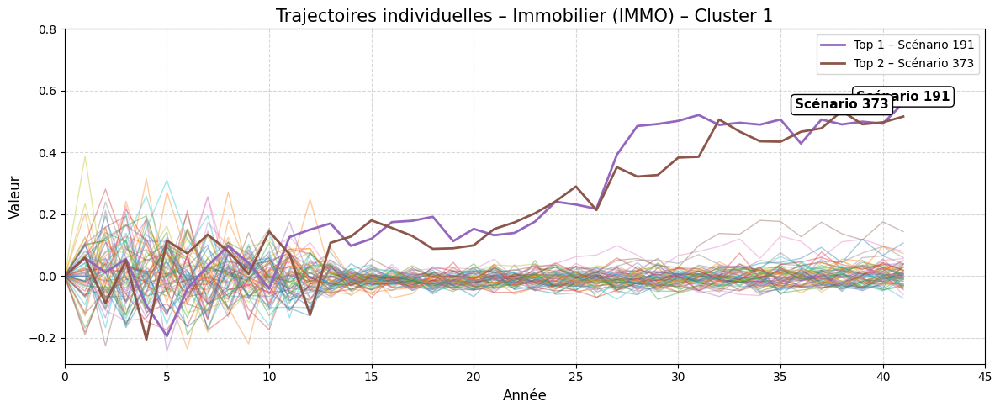

In [32]:
clusters = cluster_pvfp(pvfp_df, k=3)
plot_individual_gse(clusters["Cluster_1"], TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix, cluster_id=1)

pour N° scénario fixé, Plot scénario et la valeur de scénario

📋 Scénario 191 – Valeurs Action :
[ 0.         -0.09614791 -0.32144154 -0.01602026  0.0650843  -0.24939791
 -0.03304855  0.09433864 -0.06939208  0.05954242 -0.1676615   0.30048654
  0.03461983 -0.17480481 -0.07869643  0.0228514   0.10709302  0.10062038
  0.24977193  0.22931313  0.15961881  0.10015672  0.06664237  0.16975092
  0.26583804  0.21926685  0.17338791  0.26102273  0.48342872  0.49194762
  0.45275113  0.38166103  0.43556518  0.45152122  0.49716331  0.43225883
  0.4473565   0.53230053  0.47843603  0.41609088  0.39197393  0.44413413]
📋 Scénario 373 – Valeurs Action :
[ 0.         -0.01763049  0.09790552 -0.27664072 -0.23923954 -0.0841314
 -0.0701576   0.28940293  0.01258128 -0.08304023 -0.11993841  0.18566676
 -0.15525005 -0.00419676  0.01965592  0.23755996  0.06243503 -0.02813288
  0.04641902 -0.07863592  0.11513607  0.09078573  0.15148311  0.17451972
  0.15530341  0.18954324  0.24218018  0.33264571  0.30301168  0.37361932
  0.30208566  0.37799782  0.47659429  0.47563161  0.4949

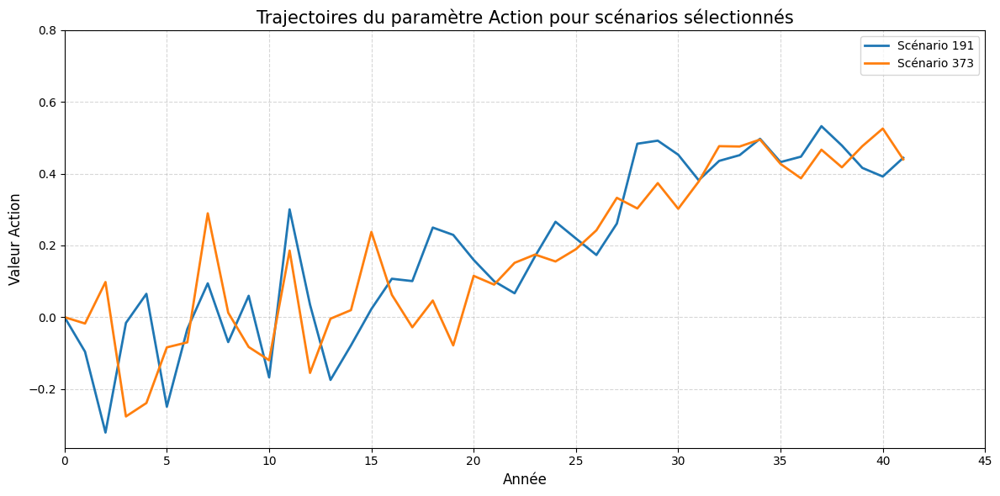

In [33]:
import matplotlib.pyplot as plt

def plot_and_print_action(ACT_matrix, scenario_ids=[191, 373]):
    plt.figure(figsize=(12, 6))

    for sid in scenario_ids:
        values = ACT_matrix[sid, :]   # les 42 valeurs du scénario
        print(f"📋 Scénario {sid} – Valeurs Action :")
        print(values)  # affiche toutes les valeurs dans la console

        # Tracer la trajectoire
        plt.plot(range(ACT_matrix.shape[1]), values, linewidth=2, label=f"Scénario {sid}")

    plt.title("Trajectoires du paramètre Action pour scénarios sélectionnés", fontsize=15)
    plt.xlabel("Année", fontsize=12)
    plt.ylabel("Valeur Action", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend()
    plt.xlim(0, 45)   # Axe X jusqu’à 45 ans
    plt.ylim(top=0.8) # Axe Y max fixé à 0.8, min auto
    plt.tight_layout()
    plt.show()

# Exemple d'utilisation
plot_and_print_action(ACT_matrix, scenario_ids=[191, 373])

Pour Taux court et Taux long : calculer le NB de taux < 0% permis 42 ans

In [34]:

# Fonction 1 : compter le nombre d'années où le taux est inférieur à un seuil
def count_years_below_threshold(matrix, seuil=0.0, title="Résultat - années sous seuil"):
    """
    Compte et affiche le nombre de points (scénario × année) où le taux est inférieur au seuil.
    """
    count = (matrix < seuil).sum()
    print(f"{title} : {count} (seuil = {seuil})")
    return count


# Fonction 2 : compter le nombre de variations inter-annuelles supérieures à un seuil
def count_variations_above_threshold(matrix, seuil_var=0.04, title="Résultat - variations au-dessus du seuil"):
    """
    Compte et affiche le nombre de variations inter-annuelles supérieures au seuil.
    """
    variations = np.diff(matrix, axis=1)
    count = (variations > seuil_var).sum()
    print(f"{title} : {count} (seuil = {seuil_var})")
    return count

In [35]:
# Supposons que TL_matrix et TLT_matrix soient définis
count_years_below_threshold(TL_matrix, seuil=0.0, title="Taux court < 0%")
count_years_below_threshold(TLT_matrix, seuil=0.0, title="Taux long < 0%")
count_years_below_threshold(ACT_matrix, seuil=0.0, title="Revalorisation action < 0%")
count_years_below_threshold(IMMO_matrix, seuil=0.0, title="Revalorisation IMMO < 0%")

count_variations_above_threshold(TL_matrix, seuil_var=0.04, title="Variations intra-annuelle taux court > 4%")
count_variations_above_threshold(TLT_matrix, seuil_var=0.04, title="Variations intra-annuelle taux long > 4%")
count_variations_above_threshold(ACT_matrix, seuil_var=0.05, title="Variations intra-annuelle ACTION > 5%")
count_variations_above_threshold(ACT_matrix, seuil_var=0.05, title="Variations intra-annuelle IMMO > 5%")

Taux court < 0% : 4278 (seuil = 0.0)
Taux long < 0% : 2825 (seuil = 0.0)
Revalorisation action < 0% : 18576 (seuil = 0.0)
Revalorisation IMMO < 0% : 9641 (seuil = 0.0)
Variations intra-annuelle taux court > 4% : 471 (seuil = 0.04)
Variations intra-annuelle taux long > 4% : 253 (seuil = 0.04)
Variations intra-annuelle ACTION > 5% : 11885 (seuil = 0.05)
Variations intra-annuelle IMMO > 5% : 11885 (seuil = 0.05)


np.int64(11885)

Matrice des variation inter-annuelles

In [36]:
import numpy as np

# Calcul de la matrice des variations inter-annuelles pour le taux court
var_TL = np.diff(TL_matrix, axis=1)
print("Matrice des variations inter-annuelles - Taux court (TL) :")
print(var_TL)

# Calcul de la matrice des variations inter-annuelles pour le taux long
var_TLT = np.diff(TLT_matrix, axis=1)
print("\nMatrice des variations inter-annuelles - Taux long (TLT) :")
print(var_TLT)

Matrice des variations inter-annuelles - Taux court (TL) :
[[ 0.01586887  0.00421689 -0.01798701 ... -0.00688483  0.00889514
   0.00264469]
 [-0.01848702 -0.00297842  0.01489782 ...  0.04010862 -0.03146172
  -0.00193415]
 [-0.00618347 -0.00759255 -0.00411148 ...  0.00074241 -0.00569738
   0.01461982]
 ...
 [-0.00813431 -0.01215668 -0.00240545 ... -0.01146575 -0.00140597
  -0.00089041]
 [-0.0049511   0.00119367 -0.00466797 ...  0.02523742  0.03991431
   0.01256221]
 [-0.00186047 -0.00193401  0.00805204 ... -0.00418337 -0.00650183
  -0.00042707]]

Matrice des variations inter-annuelles - Taux long (TLT) :
[[ 0.00609277  0.00297659 -0.00247907 ...  0.00678772 -0.00082733
   0.00816059]
 [-0.0050111  -0.00146889  0.00224649 ... -0.0107076   0.00285541
  -0.01994142]
 [-0.0049412   0.00240595  0.00097592 ...  0.00592221  0.00675677
  -0.00433596]
 ...
 [-0.00850627 -0.01037949  0.00023556 ...  0.00492512  0.00103446
  -0.00292514]
 [-0.00040571 -0.00847998 -0.00607662 ...  0.02442953 -0.004

Vérification en Excel -  Clustering 1 : afficher pour 4 paramètres les trajectoires classifiés dans le clustering 1

In [37]:
# Supposons que tu as déjà exécuté :
# clusters = cluster_pvfp(pvfp_df, k=3)

# Extraire les indices du Cluster 1
cluster_1_indices = clusters["Cluster_1"]

# Afficher tous les numéros de scénario
print("📋 Numéros de scénario dans Cluster 1 :")
print(", ".join(map(str, cluster_1_indices)))

📋 Numéros de scénario dans Cluster 1 :
29, 71, 77, 117, 132, 141, 144, 149, 182, 190, 191, 212, 243, 296, 315, 316, 338, 344, 361, 362, 369, 372, 373, 384, 401, 451, 465, 475, 504, 521, 531, 554, 567, 585, 593, 609, 617, 620, 623, 651, 654, 705, 748, 754, 758, 764, 802, 824, 830, 839, 864, 876, 894, 905, 917, 919, 928, 937, 943, 948, 956, 966, 968, 997


In [38]:
import pandas as pd

# Extraire les indices du Cluster 1
cluster_1_indices = clusters["Cluster_1"]

# Créer un DataFrame
df_cluster_1 = pd.DataFrame({"Scenario_ID": cluster_1_indices})

# Sauvegarder en Excel
df_cluster_1.to_excel("cluster_1_scenarios.xlsx", index=False)

# Télécharger le fichier
from google.colab import files
files.download("cluster_1_scenarios.xlsx")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Pour chaque Paramètre, tracer les jrajectoire IN/OUT cluserting 1

In [39]:
import matplotlib.pyplot as plt
import numpy as np

def plot_cluster_vs_others(cluster_indices, TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix, cluster_id=1):
    params = {
        "Taux court (TL)": TL_matrix,
        "Taux long (TLT)": TLT_matrix,
        "Action (ACT)": ACT_matrix,
        "Immobilier (IMMO)": IMMO_matrix
    }

    # Convertir indices en liste d'entiers
    cluster_indices = list(np.array(cluster_indices).flatten())
    all_indices = set(range(TL_matrix.shape[0]))
    other_indices = list(all_indices - set(cluster_indices))

    for name, matrix in params.items():
        plt.figure(figsize=(12, 5))

        # Tracer les scénarios hors cluster 1 (gris clair)
        for idx in other_indices:
            plt.plot(range(matrix.shape[1]), matrix[idx, :], color="lightgray", alpha=0.4)

        # Tracer les scénarios du cluster 1 (rouge)
        for idx in cluster_indices:
            plt.plot(range(matrix.shape[1]), matrix[idx, :], color="pink", alpha=0.7)

        plt.title(f"Trajectoires – {name} – Cluster {cluster_id} vs autres", fontsize=15)
        plt.xlabel("Année", fontsize=12)
        plt.ylabel("Valeur", fontsize=12)
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.xlim(0, 45)   # Axe X jusqu’à 45 ans
        plt.ylim(top=0.8) # Axe Y max fixé à 0.8, min auto
        plt.tight_layout()
        plt.show()

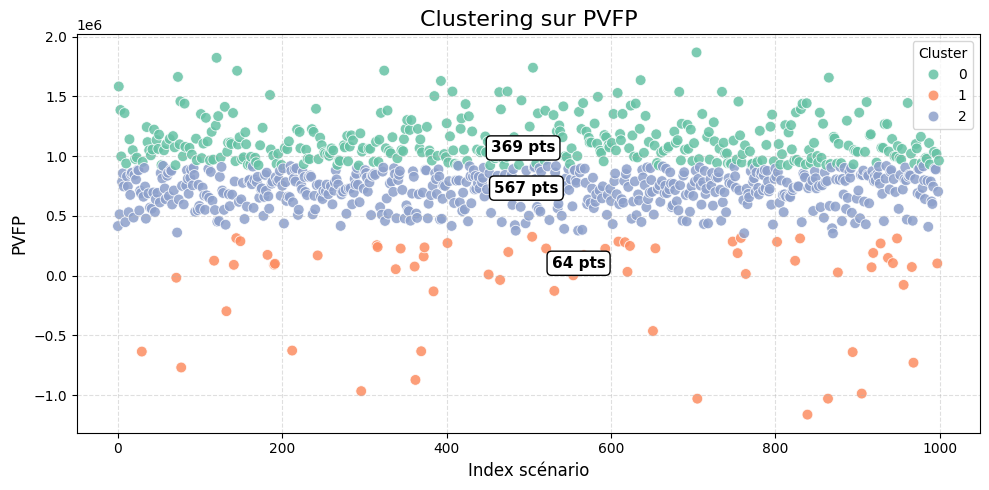

Cluster_0 contient 369 scénarios:
Premiers 20 scénarios : 1, 3, 4, 8, 10, 14, 18, 21, 23, 30, 35, 36, 38, 40, 42, 44, 47, 49, 50, 53
Cluster_1 contient 64 scénarios:
Premiers 20 scénarios : 29, 71, 77, 117, 132, 141, 144, 149, 182, 190, 191, 212, 243, 296, 315, 316, 338, 344, 361, 362
Cluster_2 contient 567 scénarios:
Premiers 20 scénarios : 0, 2, 5, 6, 7, 9, 11, 12, 13, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28


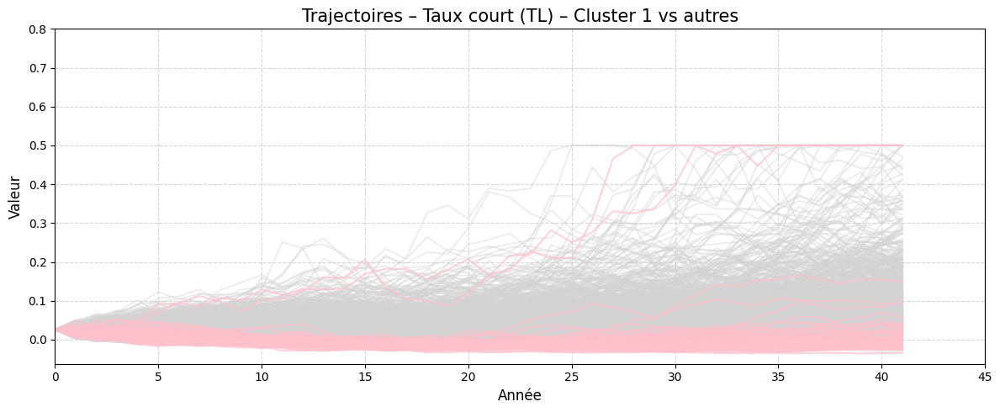

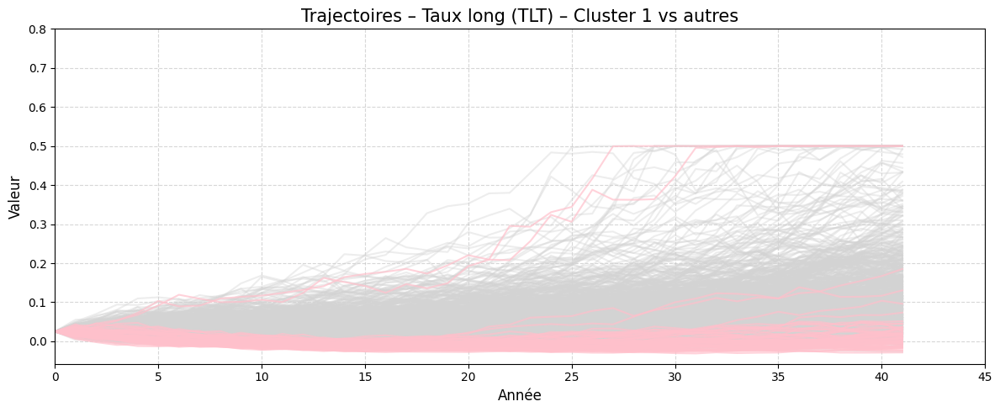

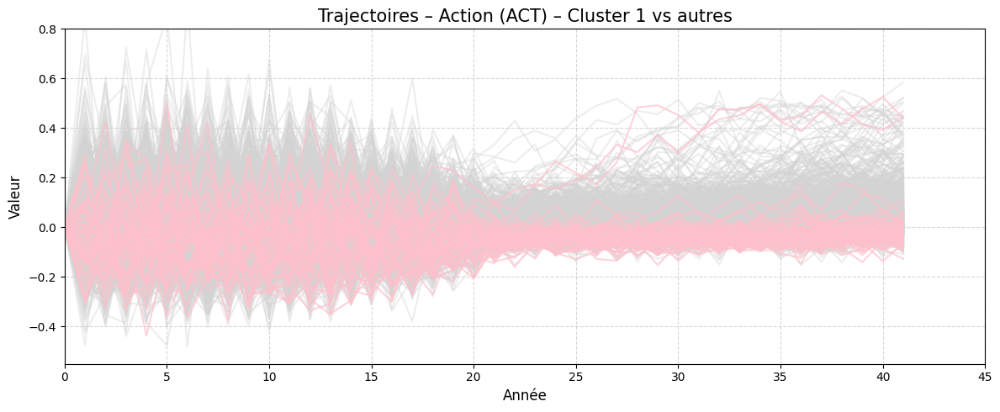

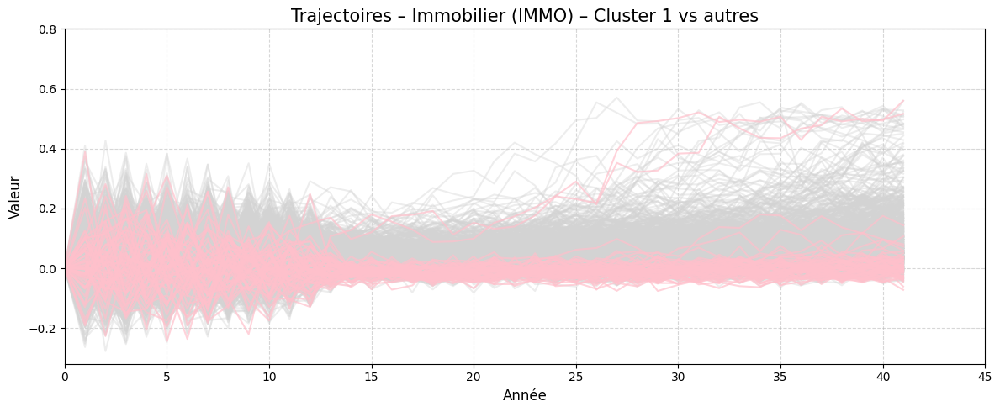

In [40]:
clusters = cluster_pvfp(pvfp_df, k=3)

# Tracer les trajectoires pour Cluster 1 vs autres
plot_cluster_vs_others(clusters["Cluster_1"], TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix, cluster_id=1)

3D Plot : 1000 scnéario & 42 ans, point négative & positive

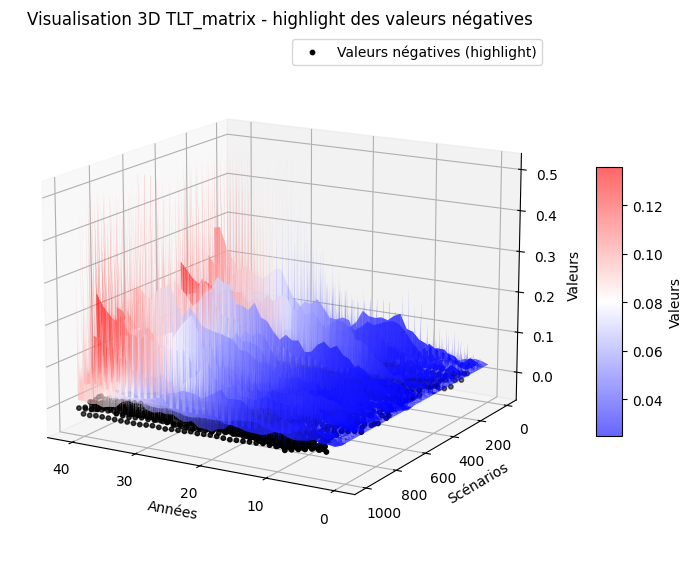

In [41]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import LinearSegmentedColormap


# Exemple : TLT_matrix est déjà défini (shape: 1000 x 42)
# TLT_matrix = np.random.randn(1000, 42)  # à remplacer par tes données réelles

n_scenarios, n_years = TLT_matrix.shape

# Créer les axes
X = np.arange(n_years)
Y = np.arange(n_scenarios)
X, Y = np.meshgrid(X, Y)
Z = TLT_matrix

fig = plt.figure(figsize=(12,7))
ax = fig.add_subplot(111, projection='3d')

colors = ["blue","white","red"]
custom_cmap = LinearSegmentedColormap.from_list("custom_cmap", colors)

# Surface globale
surf = ax.plot_surface(X, Y, Z, cmap=custom_cmap, edgecolor='none', alpha=0.6)

# Points négatifs en scatter pour les mettre en évidence
neg_idx = Z < 0
ax.scatter(X[neg_idx], Y[neg_idx], Z[neg_idx],
           color='black', s=10, label='Valeurs négatives (highlight)')

# Angle de vue
ax.view_init(elev=15, azim=120)

# Titres et labels
ax.set_title("Visualisation 3D TLT_matrix - highlight des valeurs négatives")
ax.set_xlabel("Années")
ax.set_ylabel("Scénarios")
ax.set_zlabel("Valeurs")
fig.colorbar(surf, shrink=0.5, aspect=10, label="Valeurs")
ax.legend()

plt.show()

In [42]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import LinearSegmentedColormap

def plot_matrix_3d(matrix, title="Visualisation 3D"):
    """
    Affiche un plot 3D pour une matrice (scénarios × années).
    Les valeurs négatives apparaissent en gris, zéro en blanc, positives en vert.

    Paramètres :
    - matrix : numpy array de shape (n_scenarios, n_years)
    - title  : titre du graphique
    """
    n_scenarios, n_years = matrix.shape

    # Créer les axes
    X = np.arange(n_years)
    Y = np.arange(n_scenarios)
    X, Y = np.meshgrid(X, Y)
    Z = matrix

    # Colormap personnalisée
    colors = ["blue", "white", "red"]
    custom_cmap = LinearSegmentedColormap.from_list("custom_cmap", colors)

    # Plot 3D
    fig = plt.figure(figsize=(12,7))
    ax = fig.add_subplot(111, projection='3d')

    surf = ax.plot_surface(X, Y, Z, cmap=custom_cmap, edgecolor='none')

    # Points négatifs en scatter pour les mettre en évidence
    neg_idx = Z < 0
    ax.scatter(X[neg_idx], Y[neg_idx], Z[neg_idx],color='black', s=10, label='Valeurs négatives (highlight)')

    # Angle de vue
    # ax.view_init(elev=30, azim=120)
    ax.view_init(elev=0, azim=90)

    # Titres et labels
    ax.set_title(title)
    ax.set_xlabel("Années")
    ax.set_ylabel("Scénarios")
    ax.set_zlabel("Valeurs")

    # Barre de couleur
    fig.colorbar(surf, shrink=0.5, aspect=10, label="Valeurs")

    plt.show()

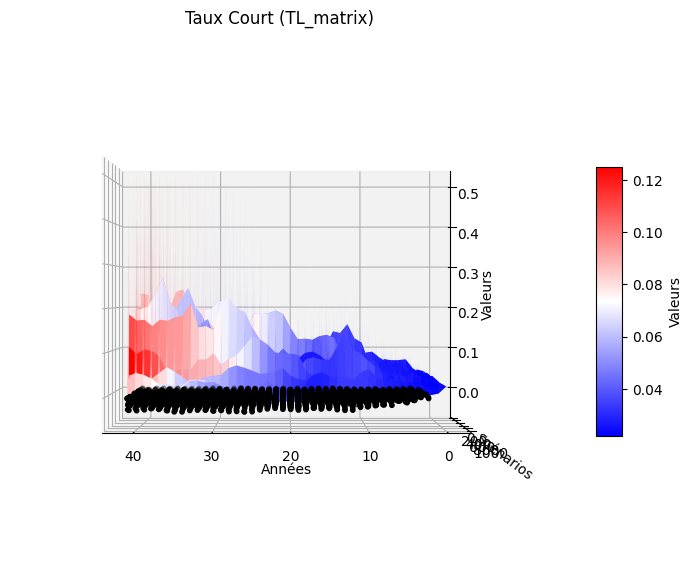

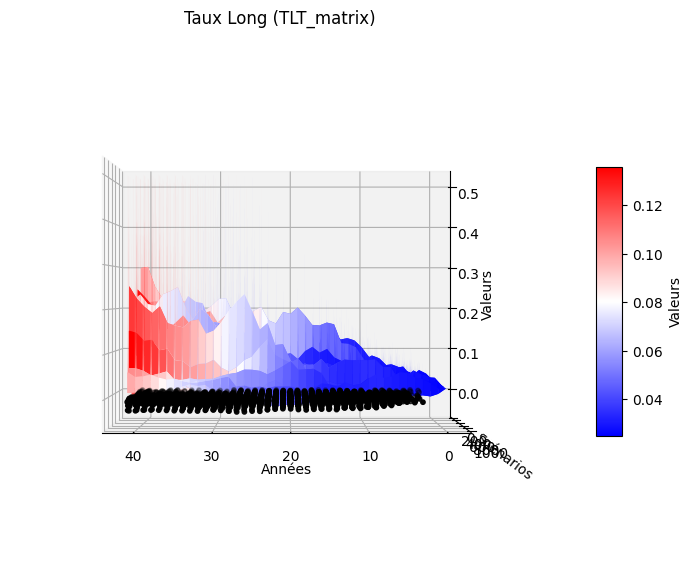

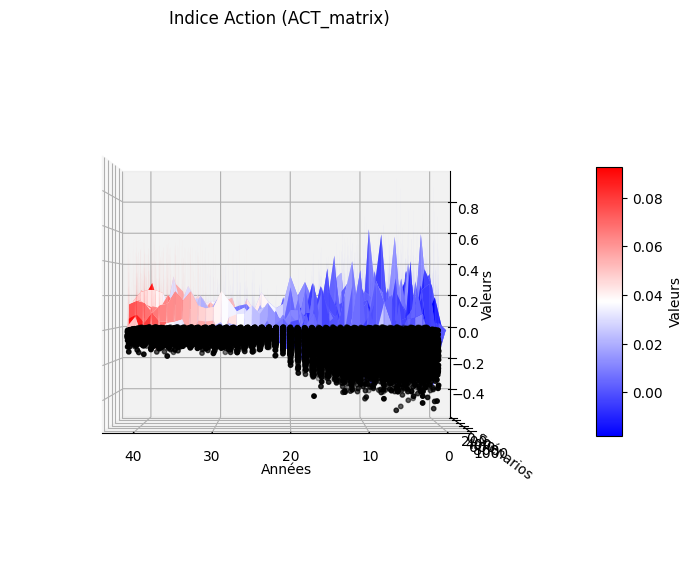

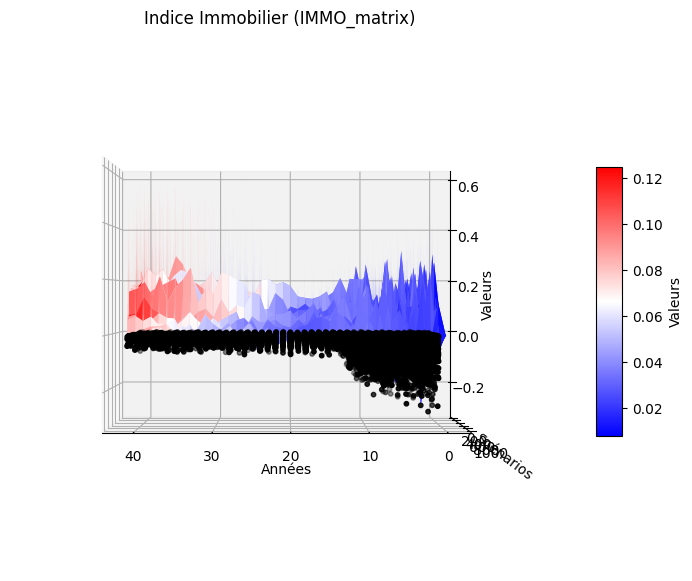

In [43]:
plot_matrix_3d(TL_matrix, title="Taux Court (TL_matrix)")
plot_matrix_3d(TLT_matrix, title="Taux Long (TLT_matrix)")
plot_matrix_3d(ACT_matrix, title="Indice Action (ACT_matrix)")
plot_matrix_3d(IMMO_matrix, title="Indice Immobilier (IMMO_matrix)")

In [44]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import LinearSegmentedColormap

def plot_matrix_interval(matrix, title="Visualisation 3D", start_year=0, end_year=None, elev=15, azim=120):
    """
    Trace un plot 3D pour une matrice (scénarios × années).
    - matrix : numpy array (n_scenarios × n_years)
    - title  : titre du graphique
    - start_year : année de début (index colonne)
    - end_year   : année de fin (index colonne, exclusif)
    - elev, azim : angles de vue pour la caméra
    """
    n_scenarios, n_years = matrix.shape

    # Si end_year n'est pas précisé, on prend jusqu'à la dernière année
    if end_year is None or end_year > n_years:
        end_year = n_years

    # Sélectionner l'intervalle d'années
    matrix_interval = matrix[:, start_year:end_year]
    years_interval = np.arange(start_year, end_year)
    scenarios = np.arange(n_scenarios)

    # Créer les axes
    X, Y = np.meshgrid(years_interval, scenarios)
    Z = matrix_interval

    # Colormap personnalisée
    colors = ["blue", "white", "red"]
    custom_cmap = LinearSegmentedColormap.from_list("custom_cmap", colors)

    # Plot 3D
    fig = plt.figure(figsize=(12,7))
    ax = fig.add_subplot(111, projection='3d')

    surf = ax.plot_surface(X, Y, Z, cmap=custom_cmap, edgecolor='none', alpha=0.6)

    # Points négatifs en scatter pour les mettre en évidence
    neg_idx = Z < 0
    ax.scatter(X[neg_idx], Y[neg_idx], Z[neg_idx],
               color='black', s=10, label='Valeurs négatives (highlight)')

    # Angle de vue
    ax.view_init(elev=elev, azim=azim)

    # Titres et labels
    ax.set_title(title + f" (années {start_year} à {end_year-1})")
    ax.set_xlabel("Années")
    ax.set_ylabel("Scénarios")
    ax.set_zlabel("Valeurs")
    fig.colorbar(surf, shrink=0.5, aspect=10, label="Valeurs")
    ax.legend()

    plt.show()

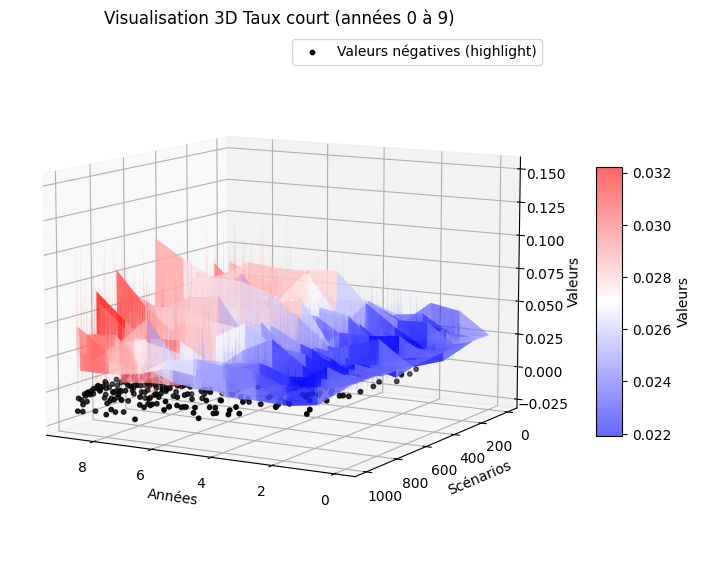

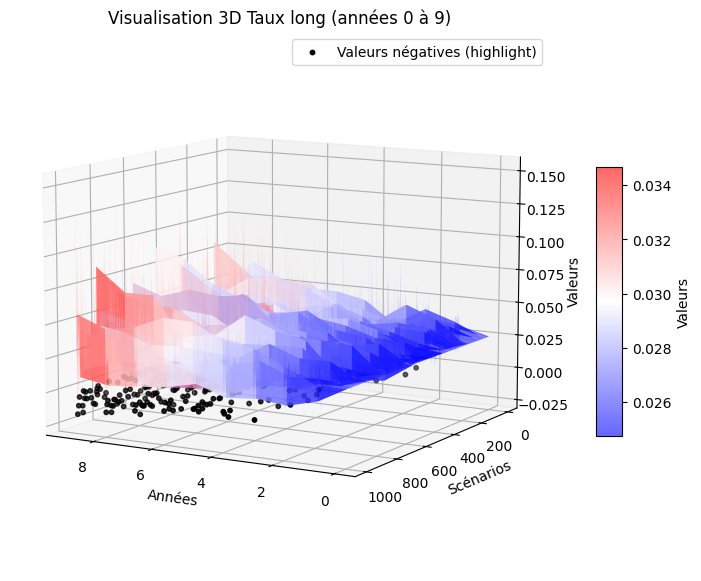

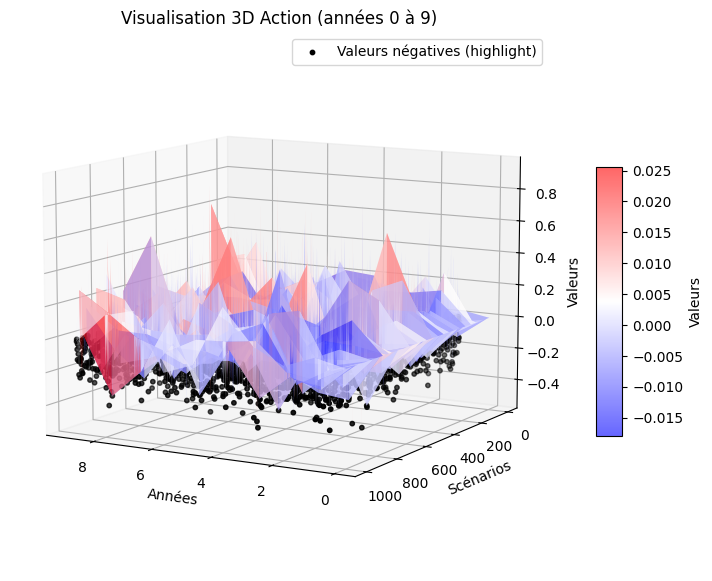

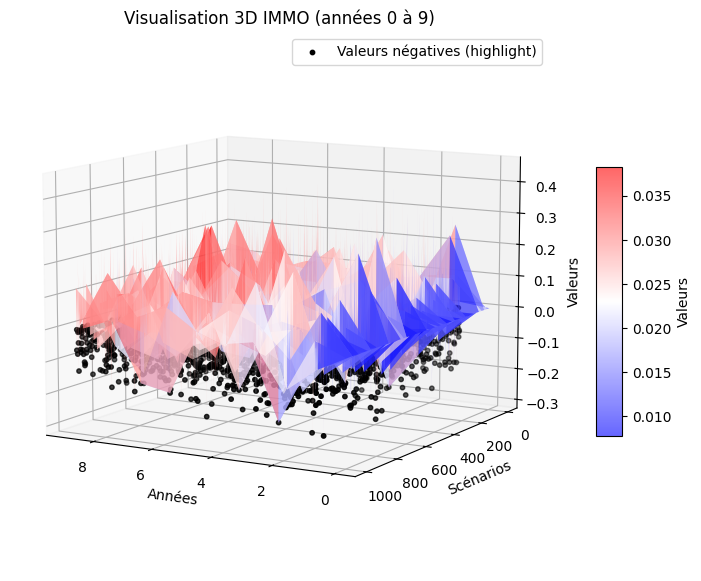

In [45]:
plot_matrix_interval(TL_matrix, title="Visualisation 3D Taux court", start_year=0, end_year=10, elev=10, azim=120)
plot_matrix_interval(TLT_matrix, title="Visualisation 3D Taux long", start_year=0, end_year=10, elev=10, azim=120)
plot_matrix_interval(ACT_matrix, title="Visualisation 3D Action", start_year=0, end_year=10, elev=10, azim=120)
plot_matrix_interval(IMMO_matrix, title="Visualisation 3D IMMO", start_year=0, end_year=10, elev=10, azim=120)

Paramètre clustering, (2,5), (70,76), (44,47), étude de la cohérence des output be_df, pvfp_df

In [46]:
def check_output_clustering_consistency(be_df, pvfp_df, scenario_groups, k=3):
    """
    Vérifie si les groupes de scénarios sont dans le même cluster pour BE et PVFP.

    Parameters:
    - be_df : DataFrame avec colonne "BE"
    - pvfp_df : DataFrame avec colonne "PVFP"
    - scenario_groups : liste de tuples, ex. [(2,5), (70,76), (44,47)]
    - k : nombre de clusters

    Returns:
    - Résumé affiché à l'écran
    """
    from sklearn.cluster import KMeans

    # Clustering BE
    be_values = be_df["BE"].values.reshape(-1, 1)
    be_labels = KMeans(n_clusters=k, random_state=42).fit_predict(be_values)

    # Clustering PVFP
    pvfp_values = pvfp_df["PVFP"].values.reshape(-1, 1)
    pvfp_labels = KMeans(n_clusters=k, random_state=42).fit_predict(pvfp_values)

    print(f"\n🔍 Vérification de cohérence des groupes dans les clusters BE et PVFP (k={k})\n")

    for group in scenario_groups:
        i, j = group
        same_be = be_labels[i] == be_labels[j]
        same_pvfp = pvfp_labels[i] == pvfp_labels[j]

        print(f"Groupe ({i}, {j}) :")
        print(f"  ➤ BE : Cluster {be_labels[i]} vs {be_labels[j]} → {'✅ même cluster' if same_be else '❌ clusters différents'}")
        print(f"  ➤ PVFP : Cluster {pvfp_labels[i]} vs {pvfp_labels[j]} → {'✅ même cluster' if same_pvfp else '❌ clusters différents'}")
        print("")

    return

In [47]:
scenario_groups = [(2, 5), (70, 76), (44, 47),(12,15),(339,363),(133,191)]
check_output_clustering_consistency(be_df, pvfp_df, scenario_groups, k=3)


🔍 Vérification de cohérence des groupes dans les clusters BE et PVFP (k=3)

Groupe (2, 5) :
  ➤ BE : Cluster 0 vs 1 → ❌ clusters différents
  ➤ PVFP : Cluster 2 vs 2 → ✅ même cluster

Groupe (70, 76) :
  ➤ BE : Cluster 1 vs 1 → ✅ même cluster
  ➤ PVFP : Cluster 0 vs 0 → ✅ même cluster

Groupe (44, 47) :
  ➤ BE : Cluster 0 vs 0 → ✅ même cluster
  ➤ PVFP : Cluster 0 vs 0 → ✅ même cluster

Groupe (12, 15) :
  ➤ BE : Cluster 2 vs 0 → ❌ clusters différents
  ➤ PVFP : Cluster 2 vs 2 → ✅ même cluster

Groupe (339, 363) :
  ➤ BE : Cluster 1 vs 1 → ✅ même cluster
  ➤ PVFP : Cluster 2 vs 2 → ✅ même cluster

Groupe (133, 191) :
  ➤ BE : Cluster 1 vs 1 → ✅ même cluster
  ➤ PVFP : Cluster 0 vs 1 → ❌ clusters différents



Pourcentage de clustering d'output PVFP vs clustering d'input

In [48]:
def evaluate_cluster_consistency(TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix,
                                 be_df, pvfp_df, k=3):
    """
    Vérifie si les scénarios qui sont dans le même cluster pour les 4 inputs
    sont aussi dans le même cluster pour les outputs BE et PVFP.

    Parameters:
    - TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix : np.ndarray
    - be_df, pvfp_df : DataFrames avec colonnes "BE" et "PVFP"
    - k : nombre de clusters

    Returns:
    - Pourcentage de cohérence
    """
    from sklearn.cluster import KMeans
    import numpy as np

    # Clustering des inputs
    labels_TL = KMeans(n_clusters=k, random_state=42).fit_predict(TL_matrix)
    labels_TLT = KMeans(n_clusters=k, random_state=42).fit_predict(TLT_matrix)
    labels_ACT = KMeans(n_clusters=k, random_state=42).fit_predict(ACT_matrix)
    labels_IMMO = KMeans(n_clusters=k, random_state=42).fit_predict(IMMO_matrix)

    # Clustering des outputs
    labels_BE = KMeans(n_clusters=k, random_state=42).fit_predict(be_df["BE"].values.reshape(-1, 1))
    labels_PVFP = KMeans(n_clusters=k, random_state=42).fit_predict(pvfp_df["PVFP"].values.reshape(-1, 1))

    n_scenarios = TL_matrix.shape[0]
    matched_count = 0
    total_checked = 0

    for i in range(n_scenarios):
        for j in range(i + 1, n_scenarios):
            # Vérifier si i et j sont dans le même cluster pour les 4 inputs
            if (labels_TL[i] == labels_TL[j] and
                labels_TLT[i] == labels_TLT[j] and
                labels_ACT[i] == labels_ACT[j] and
                labels_IMMO[i] == labels_IMMO[j]):

                total_checked += 1
                # Vérifier si i et j sont aussi dans le même cluster pour les outputs
                if labels_BE[i] == labels_BE[j] and labels_PVFP[i] == labels_PVFP[j]:
                    matched_count += 1

    if total_checked == 0:
        print("⚠️ Aucun groupe commun trouvé dans les 4 clusters d'entrée.")
        return 0.0

    pourcentage = (matched_count / total_checked) * 100
    print(f"\n✅ {matched_count} sur {total_checked} groupes d'entrée cohérents ont aussi des sorties cohérentes.")
    print(f"📊 Pourcentage de cohérence : {pourcentage:.2f}%\n")

    return pourcentage

In [49]:
evaluate_cluster_consistency(TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix,be_df, pvfp_df, k=3)


✅ 32584 sur 144608 groupes d'entrée cohérents ont aussi des sorties cohérentes.
📊 Pourcentage de cohérence : 22.53%



22.532639964593937

# Section 4 - Marchine learing regression surpervisée BE / PVFP


Préparation des données

In [50]:
# Chaque matrice : shape (1000, 42)
# On concatène les 4 matrices en une seule matrice X
X = np.hstack([TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix])  # shape (1000, 168)

# Cibles
y_be = be_df["BE"].values  # shape (1000,)
y_pvfp = pvfp_df["PVFP"].values  # shape (1000,)
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [51]:

# 🔄 Normalisation par scénario (ligne par ligne)
X_scaled = np.zeros_like(X)
for i in range(X.shape[0]):
    scaler = StandardScaler()
    X_scaled[i, :] = scaler.fit_transform(X[i, :].reshape(-1, 1)).flatten()


Regression multivariée

In [52]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split   # divesion des données en ensemble d'entraînement et de test
from sklearn.metrics import mean_squared_error, r2_score  # erreur quadratique moyenne, coeff de determination

# Split 20% de données pour le test, 80% de données pour le train
X_be_train, X_be_test, y_be_train, y_be_test = train_test_split(X_scaled, y_be, test_size=0.2, random_state=42)
X_pvfp_train, X_pvfp_test, y_pvfp_train, y_pvfp_test = train_test_split(X_scaled, y_pvfp, test_size=0.2, random_state=42)

# Modèle Random forest pour prédire BE : 100 arbres
model_be = RandomForestRegressor(n_estimators=100, random_state=42)
model_be.fit(X_be_train, y_be_train)

model_pvfp = RandomForestRegressor(n_estimators=100, random_state=42)
model_pvfp.fit(X_pvfp_train, y_pvfp_train)

# Prédiction BE sur les données de test
y_be_pred = model_be.predict(X_be_test)
y_pvfp_pred = model_pvfp.predict(X_pvfp_test)

# Évaluation
from math import sqrt
print("BE - RMSE :", sqrt(mean_squared_error(y_be_test, y_be_pred)))
print("BE - R² :", r2_score(y_be_test, y_be_pred))

print("pvfp - RMSE :", sqrt(mean_squared_error(y_pvfp_test, y_pvfp_pred)))
print("pvfp - R² :", r2_score(y_pvfp_test, y_pvfp_pred))

BE - RMSE : 832112.6967575795
BE - R² : 0.5565704682296231
pvfp - RMSE : 173830.6479834533
pvfp - R² : 0.7002877178673343


In [53]:
def generate_feature_names():
    labels = ["TL", "TLT", "ACT", "IMMO"]
    feature_names = []
    for label in labels:
        for i in range(1, 43):  # années 1 à 42
            feature_names.append(f"{label}_{i}")
    return feature_names

In [54]:
def plot_feature_importance_named(importances, title="Importance des variables", step=1):
    feature_names = generate_feature_names()
    x = np.arange(len(importances))

    plt.figure(figsize=(22, 6))  # ✅ élargir la figure
    plt.plot(x, importances, marker='o', linestyle='-', alpha=0.7)
    plt.title(title, fontsize=16)
    plt.xlabel("Paramètre & Année", fontsize=12)
    plt.ylabel("Importance", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.4)

    # ✅ afficher plus de labels en réduisant le pas
    plt.xticks(x[::step], feature_names[::step], rotation=90, fontsize=8)

    plt.tight_layout()
    plt.show()

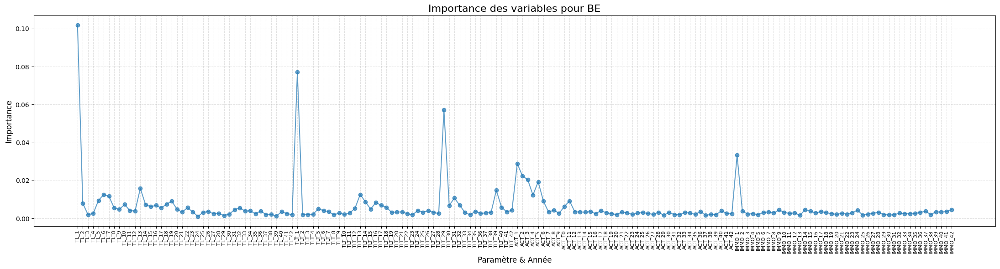

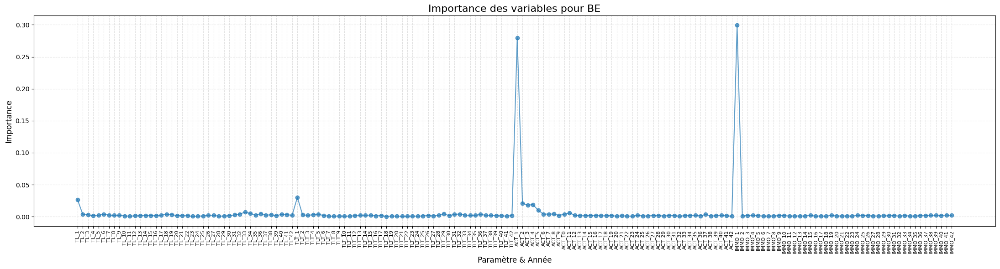

In [55]:
importances_be = model_be.feature_importances_
plot_feature_importance_named(importances_be, title="Importance des variables pour BE")

importances_pvfp = model_pvfp.feature_importances_
plot_feature_importance_named(importances_pvfp, title="Importance des variables pour BE")

In [56]:
pip install xgboost

In [57]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from xgboost import XGBRegressor
from math import sqrt
import numpy as np

def test_models(X, y, target_name="BE"):
    """
    Teste plusieurs modèles de régression et compare leurs performances.

    Parameters:
    - X : matrice des features (shape: n_samples, n_features)
    - y : vecteur cible (shape: n_samples,)
    - target_name : nom de la cible ("BE" ou "PVFP")
    """
    # Split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Liste des modèles
    models = {
        "LinearRegression": LinearRegression(),
        "GradientBoosting": GradientBoostingRegressor(random_state=42),
        "XGBoost": XGBRegressor(random_state=42),
        "MLPRegressor": MLPRegressor(hidden_layer_sizes=(100,), max_iter=500, random_state=42)
    }

    print(f"\n📊 Évaluation des modèles pour la cible : {target_name}\n")

    for name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        rmse = sqrt(mean_squared_error(y_test, y_pred))
        r2 = r2_score(y_test, y_pred)
        print(f"🔹 {name} → RMSE: {rmse:.4f} | R²: {r2:.4f}")

In [58]:
# X = np.hstack([TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix])
# X_scaled = StandardScaler().fit_transform(X)

test_models(X_scaled, y_be, target_name="BE")
test_models(X_scaled, y_pvfp, target_name="PVFP")


📊 Évaluation des modèles pour la cible : BE

🔹 LinearRegression → RMSE: 393273.6562 | R²: 0.9010
🔹 GradientBoosting → RMSE: 732200.5353 | R²: 0.6567
🔹 XGBoost → RMSE: 856051.9808 | R²: 0.5307


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


🔹 MLPRegressor → RMSE: 11843532.6694 | R²: -88.8303

📊 Évaluation des modèles pour la cible : PVFP

🔹 LinearRegression → RMSE: 203418.4673 | R²: 0.5896
🔹 GradientBoosting → RMSE: 158346.7609 | R²: 0.7513
🔹 XGBoost → RMSE: 172128.1041 | R²: 0.7061
🔹 MLPRegressor → RMSE: 869182.6001 | R²: -6.4933


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


In [59]:
pip install shap

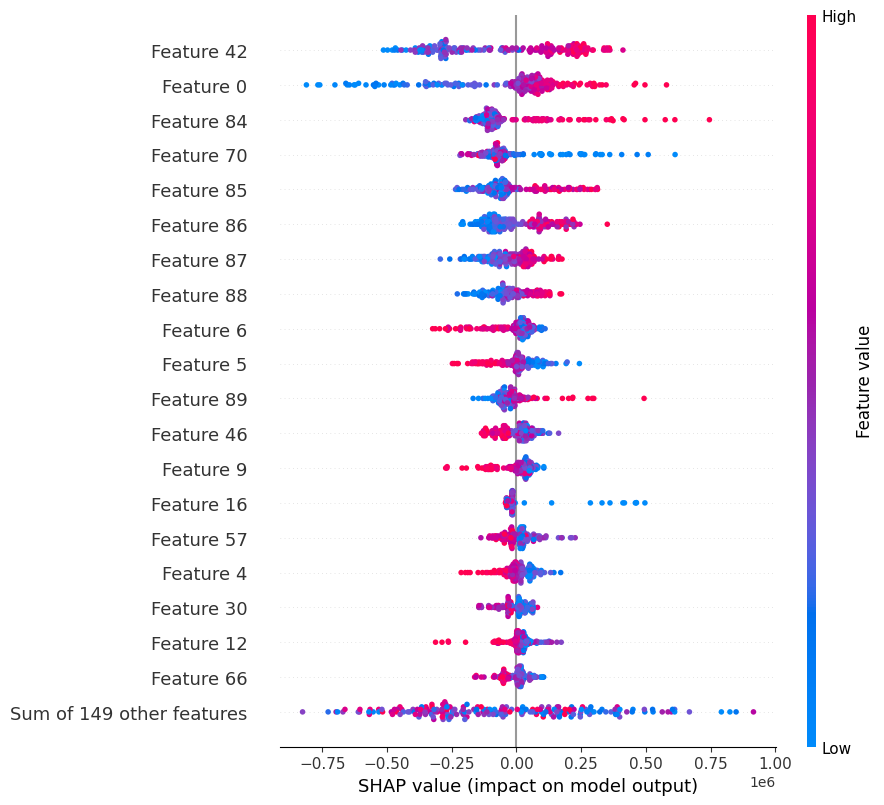

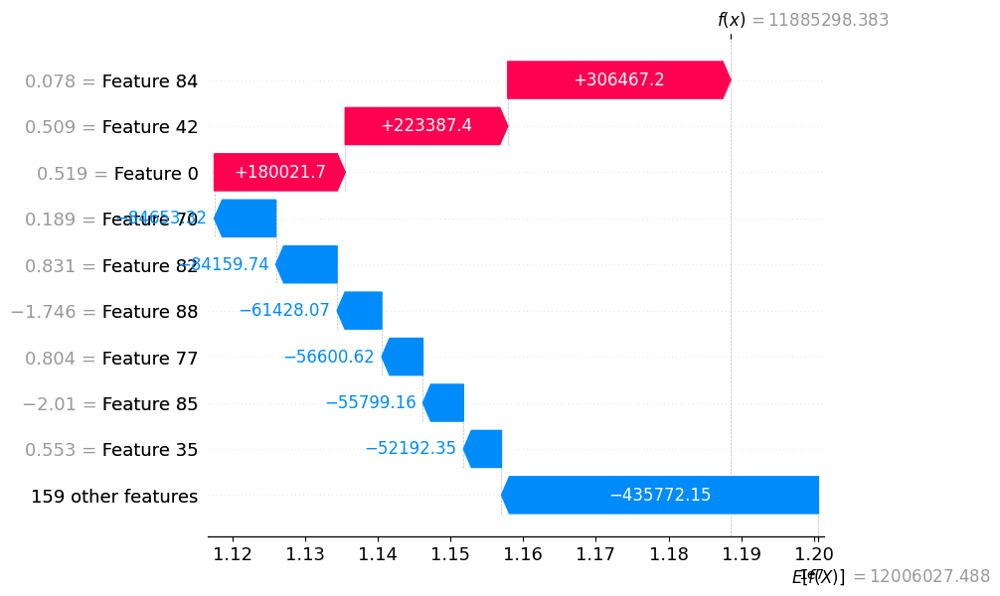

In [60]:
import shap

# Entraîner le modèle
model = XGBRegressor(random_state=42)
model.fit(X_be_train, y_be_train)

# Créer l'explainer SHAP
explainer = shap.Explainer(model, X_be_train)
shap_values = explainer(X_be_test)

# Visualisation globale
shap.plots.beeswarm(shap_values, max_display=20)

# Visualisation pour un scénario spécifique
shap.plots.waterfall(shap_values[0])

# Section 4.2 PVFP Gradientboosting

- Entraînement du modèle
- Évaluation des performances
- Importance des variables
- Visualisation des prédictions
- Interprétation avec SHAP


In [61]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from math import sqrt
import matplotlib.pyplot as plt
import shap
import numpy as np

def study_PVFP(X_scaled, y_pvfp):
    print("\n🔸 Étude approfondie pour PVFP (Gradient Boosting)\n")

    # 1. Split des données
    X_pvfp_train, X_pvfp_test, y_pvfp_train, y_pvfp_test = train_test_split(X_scaled, y_pvfp, test_size=0.2, random_state=42)

    # 2. Entraînement du modèle
    model = GradientBoostingRegressor(random_state=42)
    model.fit(X_pvfp_train, y_pvfp_train)
    y_pvfp_pred = model.predict(X_pvfp_test)

    # 3. Évaluation
    rmse = sqrt(mean_squared_error(y_pvfp_test, y_pvfp_pred))
    r2 = r2_score(y_pvfp_test, y_pvfp_pred)
    print(f"✅ RMSE : {rmse:.4f}")
    print(f"✅ R² : {r2:.4f}")

    # 4. Importance des variables (triées et filtrées)
    importances = model.feature_importances_
    feature_names = [f"{label}_{i}" for label in ["TL", "TLT", "ACT", "IMMO"] for i in range(1, 43)]

    # Filtrer les importances non nulles
    non_zero_indices = np.where(importances > 0)[0]
    filtered_importances = importances[non_zero_indices]
    filtered_names = [feature_names[i] for i in non_zero_indices]

    # Trier par ordre décroissant
    sorted_indices = np.argsort(filtered_importances)[::-1]
    sorted_importances = filtered_importances[sorted_indices]
    sorted_names = [filtered_names[i] for i in sorted_indices]

     # Tracer avec annotations
    plt.figure(figsize=(10, max(6, len(sorted_names) * 0.3)))
    bars = plt.barh(sorted_names, sorted_importances, color='skyblue')
    plt.gca().invert_yaxis()
    plt.title("📈 Importance des variables (PVFP - Gradient Boosting)", fontsize=16)
    plt.xlabel("Importance", fontsize=12)
    plt.ylabel("Paramètre + N° variable", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.4)

     # Ajouter les valeurs sur les barres
    for bar in bars:
      width = bar.get_width()
      plt.text(width + 0.001, bar.get_y() + bar.get_height()/2,
             f"{width:.4f}", va='center', fontsize=10, color='black')

    plt.tight_layout()
    plt.show()

    # 5. Visualisation des prédictions
    plt.figure(figsize=(6, 4))
    plt.scatter(y_pvfp_test, y_pvfp_pred, alpha=0.6)
    plt.plot([min(y_pvfp_test), max(y_pvfp_test)], [min(y_pvfp_test), max(y_pvfp_test)], color='red', linestyle='--')
    plt.title("🔍 PVFP réel vs PVFP prédit", fontsize=14)
    plt.xlabel("PVFP réel", fontsize=12)
    plt.ylabel("PVFP prédit", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.tight_layout()
    plt.show()

    # 6. SHAP values
    feature_names = [f"{label}_{i}" for label in ["TL", "TLT", "ACT", "IMMO"] for i in range(1, 43)]
    explainer = shap.Explainer(model, X_pvfp_train, feature_names=feature_names)
    shap_values = explainer(X_pvfp_test)
    shap.plots.beeswarm(shap_values, max_display=20)

    return model


🔸 Étude approfondie pour PVFP (Gradient Boosting)

✅ RMSE : 158346.7609
✅ R² : 0.7513


/tmp/ipython-input-2528312566.py:55: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


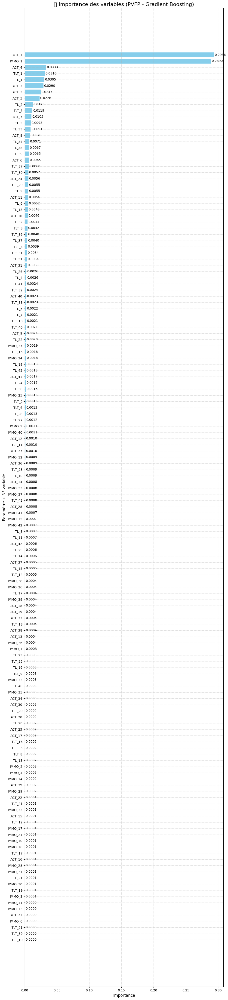

/tmp/ipython-input-2528312566.py:66: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


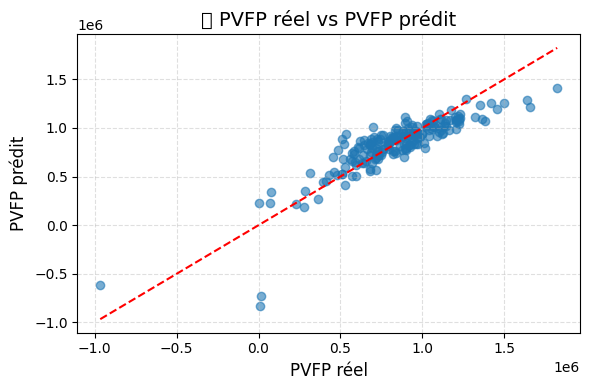

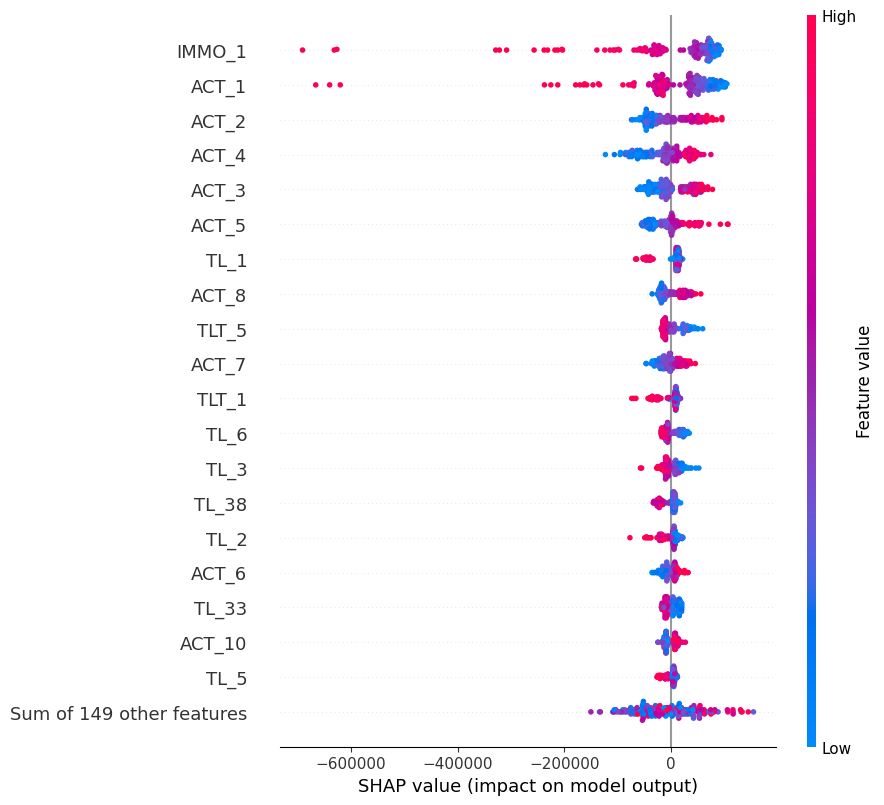

In [62]:
model_pvfp = study_PVFP(X_scaled, y_pvfp)


🔍 Décomposition SHAP pour le scénario 2 :


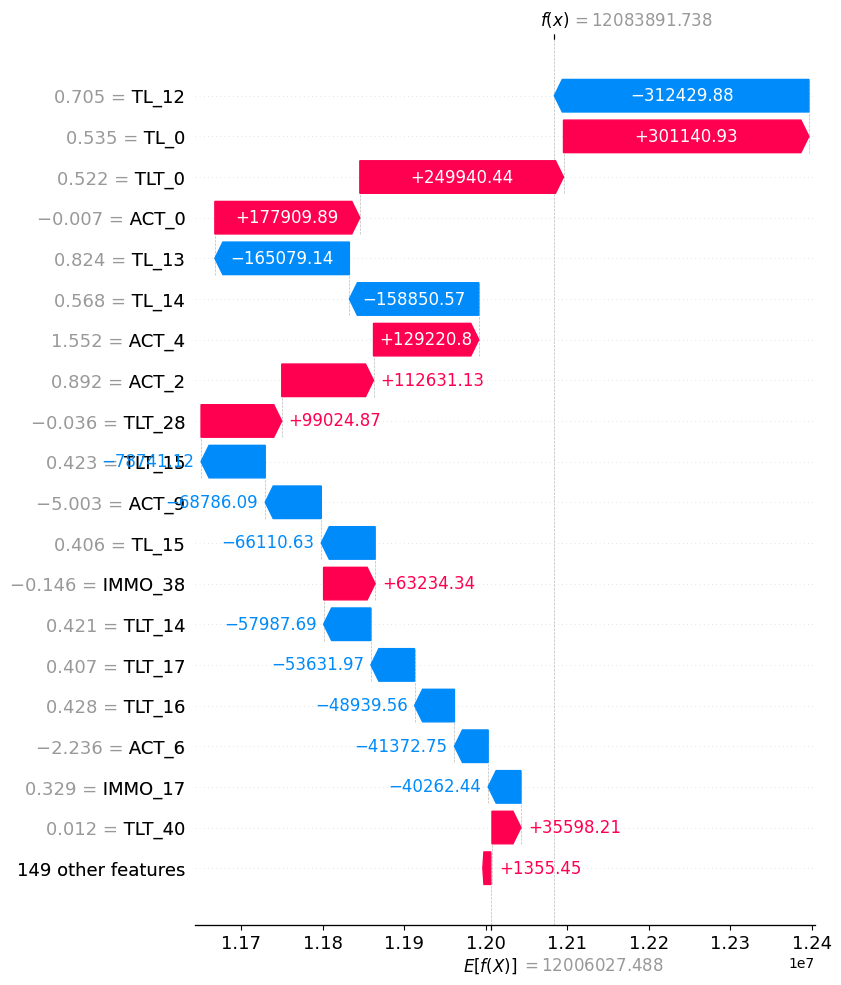

In [63]:
# 7. SHAP waterfall plot pour un scénario spécifique
scenario_index = 2  # tu peux changer ce numéro pour explorer d'autres scénarios

# Exemple de construction des noms de variables
feature_names = []

for prefix, matrix in zip(["TL", "TLT", "ACT", "IMMO"], [TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix]):
    for i in range(matrix.shape[1]):
        feature_names.append(f"{prefix}_{i}")
shap_values.feature_names = feature_names

print(f"\n🔍 Décomposition SHAP pour le scénario {scenario_index} :")
shap.plots.waterfall(shap_values[scenario_index], max_display=20)

In [64]:
# feature_names déjà définis
feature_names = [f"{prefix}_{i}" for prefix, matrix in zip(["TL", "TLT", "ACT", "IMMO"], [TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix]) for i in range(matrix.shape[1])]

# Recalculer les SHAP values avec noms explicites
explainer = shap.Explainer(model, X_pvfp_train, feature_names=feature_names)
shap_values = explainer(X_pvfp_test)

# Exemple : stocker les top variables pour chaque scénario
top_shap_by_scenario = []

for i in range(len(X_pvfp_test)):
    values = shap_values[i].values
    abs_values = np.abs(values)
    top_indices = np.argsort(abs_values)[::-1][:5]  # top 5 variables
    top_features = [feature_names[j] for j in top_indices]
    top_contributions = values[top_indices]
    top_shap_by_scenario.append(list(zip(top_features, top_contributions)))

# Affichage exemple pour les 3 premiers scénarios
for i in range(6):
    print(f"\n🔍 Scénario {i} – Top 5 variables SHAP :")
    for name, val in top_shap_by_scenario[i]:
        print(f"  {name}: {val:.4f}")


🔍 Scénario 0 – Top 5 variables SHAP :
  ACT_0: 306467.1957
  TLT_0: 223387.3985
  TL_0: 180021.7040
  TLT_28: -84653.3160
  TLT_40: -84159.7378

🔍 Scénario 1 – Top 5 variables SHAP :
  TL_16: 410984.6762
  TL_0: -290380.9374
  ACT_3: -133178.7718
  TLT_0: -125839.1228
  ACT_2: 123074.1978

🔍 Scénario 2 – Top 5 variables SHAP :
  TL_12: -312429.8768
  TL_0: 301140.9333
  TLT_0: 249940.4428
  ACT_0: 177909.8872
  TL_13: -165079.1372

🔍 Scénario 3 – Top 5 variables SHAP :
  TL_0: -552147.1691
  TLT_0: -244353.5140
  ACT_1: -229416.2915
  ACT_0: -116190.6428
  ACT_3: -97211.5635

🔍 Scénario 4 – Top 5 variables SHAP :
  TL_6: -263109.2050
  TLT_0: 240041.6011
  TLT_28: -215670.8924
  TLT_4: -127437.0120
  ACT_0: -111154.4748

🔍 Scénario 5 – Top 5 variables SHAP :
  TLT_28: -188528.7643
  TLT_0: 127498.1514
  ACT_0: -115232.0800
  TL_30: -97057.6974
  ACT_1: 94000.8583



🔍 Waterfall SHAP – Scénario 0


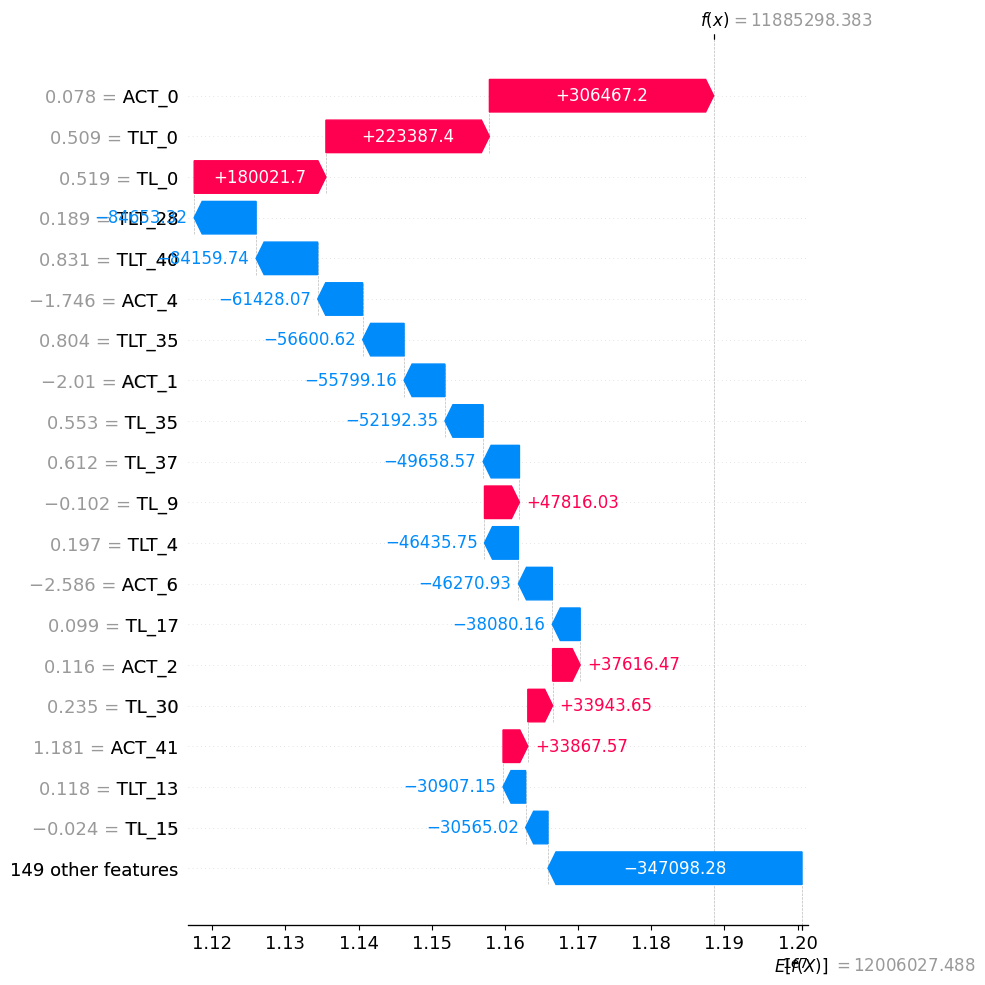


🔍 Waterfall SHAP – Scénario 1


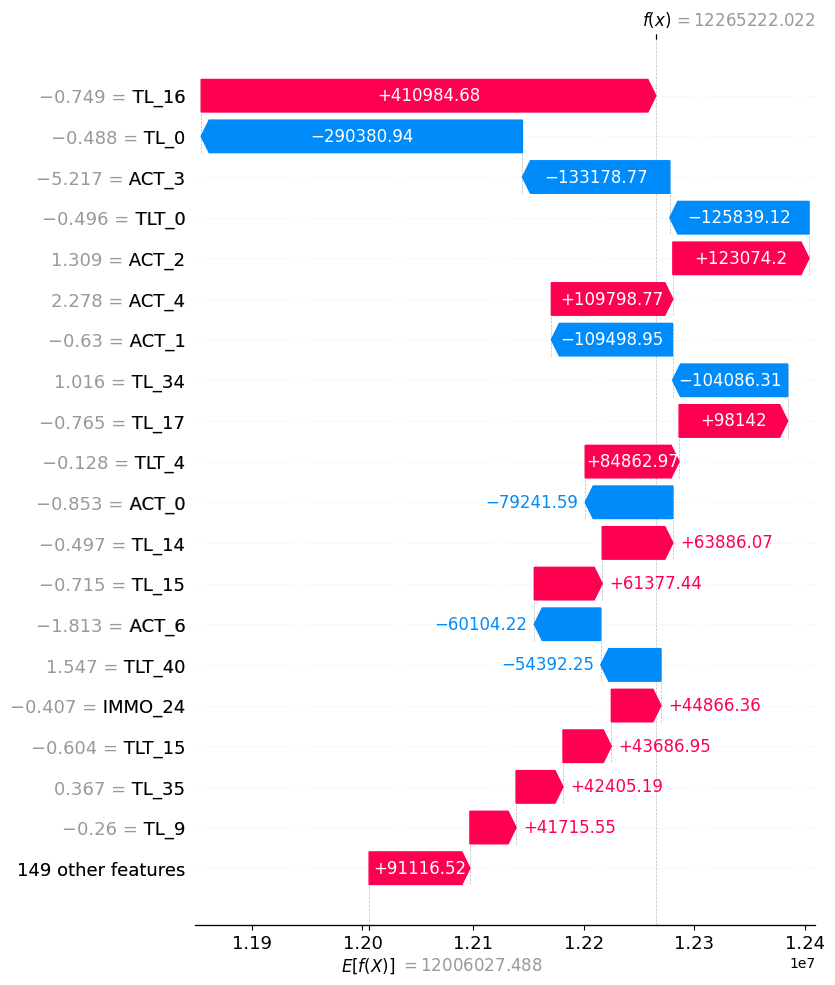


🔍 Waterfall SHAP – Scénario 2


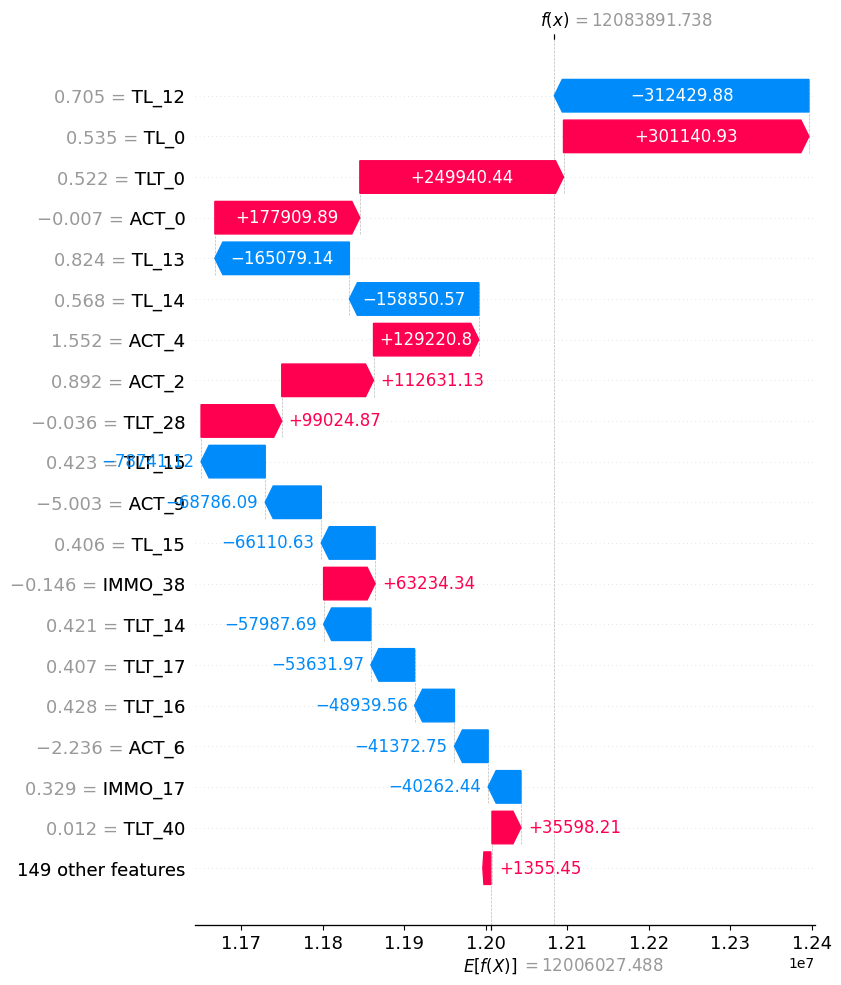

In [65]:
for i in range(3):  # ou range(len(X_test)) pour tous
    print(f"\n🔍 Waterfall SHAP – Scénario {i}")
    shap.plots.waterfall(shap_values[i], max_display=20)

In [66]:
# Définir les noms de variables
feature_names = [f"{prefix}_Year{i+1}" for prefix, matrix in zip(["TL", "TLT", "ACT", "IMMO"], [TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix]) for i in range(matrix.shape[1])]

# Recalculer les SHAP values avec noms
explainer = shap.Explainer(model, X_pvfp_train, feature_names=feature_names)
shap_values = explainer(X_pvfp_test)


In [67]:

# Extraire les valeurs SHAP dans un DataFrame
shap_df = pd.DataFrame(shap_values.values, columns=feature_names)

# Ajouter la prédiction du modèle et la vraie valeur
shap_df["PVFP_prédit"] = model.predict(X_pvfp_test)
shap_df["PVFP_réel"] = pd.Series(y_pvfp_test)


In [68]:
# Sauvegarder dans l'environnement Colab
shap_df.to_excel("shap_contributions_PVFP.xlsx", index=False)

# Télécharger le fichier
from google.colab import files
files.download("shap_contributions_PVFP.xlsx")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Section 4.3 PVFP avec X matrice explicative de dim réduit

Matrix explicative dim résuit : X_reduced

In [69]:
def transform_matrix(matrix, threshold):

    n_rows, n_cols = matrix.shape
    result = np.zeros((n_rows, 1))

    for i in range(n_rows):
        below = np.sum(matrix[i, :] < threshold) / n_cols
        #above = 1 - below
        result[i, 0] = below
        #result[i, 1] = above

    return result

def transform_matrix_taux(matrix, threshold1,threshold2):

    # Calcul des variations en %
    #variation = (matrix[:, 1:] - matrix[:, :-1]) / matrix[:, :-1] * 100
    variation = (matrix[:, 1:] - matrix[:, :-1])
    n_rows, n_cols = variation.shape
    result = np.zeros((n_rows, 2))

    for i in range(n_rows):
        above = np.sum(variation[i, :] > threshold1) / n_cols
        below = np.sum(variation[i, :] > threshold2) / n_cols
        result[i, 0] = above
        result[i, 1] = below

    return result



In [70]:
# reduction dim : pourcentage valeur < 0
TL_reduced = transform_matrix_taux(TL_matrix, threshold1=0.015, threshold2=0.08 )
TLT_reduced = transform_matrix_taux(TLT_matrix, threshold1=0.015, threshold2=0.06 )

ACT_reduced = transform_matrix(ACT_matrix, threshold=-0.05)  #  évolution de action est inf à -5%
IMMO_reduced = transform_matrix(IMMO_matrix, threshold=-0.05)  # évolution de immo est inf à -5%"

# agrégation de 4 paramètre dans un seul matrix
X_reduced = np.hstack([TL_reduced,
                       TLT_reduced,
                       ACT_reduced,
                       IMMO_reduced])

print("Shape finale de X_reduced :", X_reduced.shape)  # (1000, 16)
# Afficher les 10 premières lignes de X_reduced
print("Premières 10 lignes de X_reduced :")
#print(X_reduced[:10])

Shape finale de X_reduced : (1000, 6)
Premières 10 lignes de X_reduced :


In [71]:

# Définir les noms de colonnes explicites
feature_names = [
    "TL_reduced",  "TL_reduced_vitesse",
    "TLT_reduced", "TLT_reduced_vitesse",
    "ACT_reduced",
    "IMMO_reduced"
]

# Transformer X_reduced en DataFrame
X_reduced_df = pd.DataFrame(X_reduced, columns=feature_names)

# Vérifier la structure
print("Shape :", X_reduced_df.shape)
print("Premières lignes :\n", X_reduced_df.head())

# Exporter vers Excel
filename = "X_reduced_features bis.xlsx"
X_reduced_df.to_excel(filename, index=False)

print(f"Fichier Excel '{filename}' créé avec succès.")

from google.colab import files
# files.download("matrices_reduites.xlsx")
files.download("X_reduced_features bis.xlsx")

Shape : (1000, 6)
Premières lignes :
    TL_reduced  TL_reduced_vitesse  TLT_reduced  TLT_reduced_vitesse  \
0    0.073171                 0.0     0.000000                  0.0   
1    0.097561                 0.0     0.170732                  0.0   
2    0.000000                 0.0     0.000000                  0.0   
3    0.195122                 0.0     0.097561                  0.0   
4    0.048780                 0.0     0.073171                  0.0   

   ACT_reduced  IMMO_reduced  
0     0.357143      0.071429  
1     0.166667      0.023810  
2     0.404762      0.023810  
3     0.071429      0.071429  
4     0.142857      0.095238  
Fichier Excel 'X_reduced_features bis.xlsx' créé avec succès.


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Matrix de variation intra-annuelle

In [72]:

# Variation annuelle = différence entre colonnes successives
TL_var = np.diff(TL_matrix, axis=1)       # shape (1000, 41)
TLT_var = np.diff(TLT_matrix, axis=1)     # shape (1000, 41)
ACT_var = np.diff(ACT_matrix, axis=1)     # shape (1000, 41)
IMMO_var = np.diff(IMMO_matrix, axis=1)   # shape (1000, 41)

# Vérification des dimensions
print("TL_var:", TL_var.shape)
print("TLT_var:", TLT_var.shape)
print("ACT_var:", ACT_var.shape)
print("IMMO_var:", IMMO_var.shape)

# Exemple : afficher les 5 premières lignes et 5 premières colonnes de TL_var
print("Extrait TL_var:\n", TL_var[:5, :5])

TL_var: (1000, 41)
TLT_var: (1000, 41)
ACT_var: (1000, 41)
IMMO_var: (1000, 41)
Extrait TL_var:
 [[ 0.01586887  0.00421689 -0.01798701 -0.01281515 -0.00471259]
 [-0.01848702 -0.00297842  0.01489782  0.01380696  0.00777091]
 [-0.00618347 -0.00759255 -0.00411148  0.00127179  0.01065076]
 [-0.00054694  0.00848177  0.00965105 -0.00191213 -0.01313109]
 [-0.01306935 -0.00485808  0.00370912  0.00403385  0.00771879]]


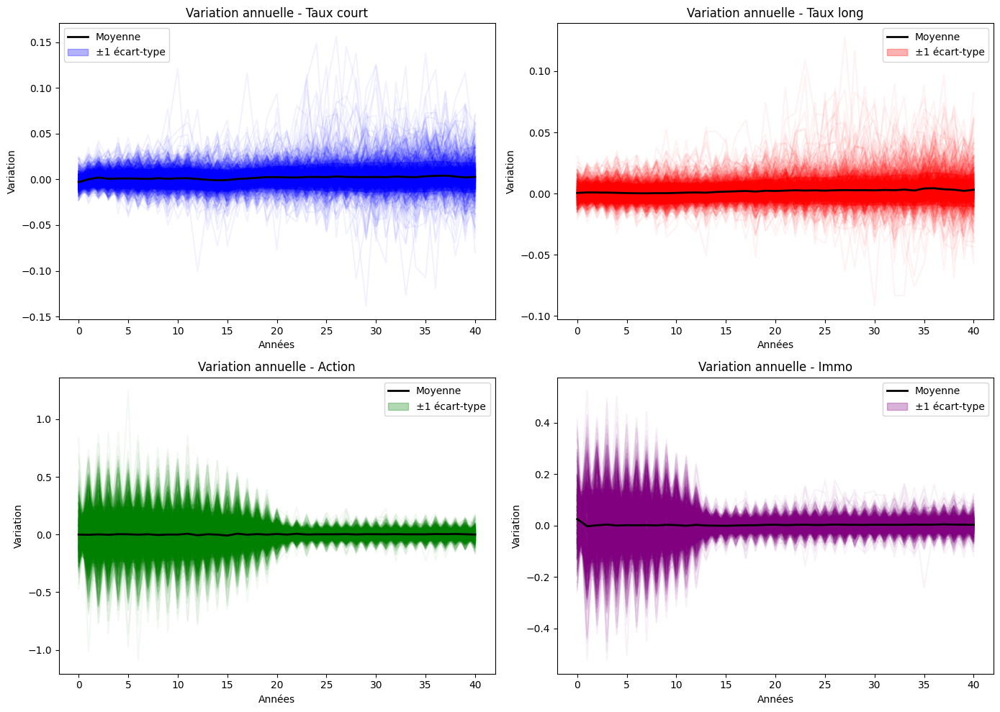

In [73]:
def plot_with_mean_and_ci(ax, data, color, title):
    # Tracer toutes les trajectoires avec faible opacité
    for i in range(data.shape[0]):
        ax.plot(data[i], color=color, alpha=0.05)

    # Calcul de la moyenne et de l'écart-type
    mean = data.mean(axis=0)
    std = data.std(axis=0)

    # Tracer la moyenne
    ax.plot(mean, color='black', linewidth=2, label='Moyenne')

    # Tracer l'intervalle de confiance ±1 écart-type
    ax.fill_between(range(data.shape[1]), mean-std, mean+std,
                    color=color, alpha=0.3, label='±1 écart-type')

    ax.set_title(title)
    ax.set_xlabel("Années")
    ax.set_ylabel("Variation")
    ax.legend()

# Création des sous-graphiques
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

plot_with_mean_and_ci(axes[0,0], TL_var, 'blue', "Variation annuelle - Taux court")
plot_with_mean_and_ci(axes[0,1], TLT_var, 'red', "Variation annuelle - Taux long")
plot_with_mean_and_ci(axes[1,0], ACT_var, 'green', "Variation annuelle - Action")
plot_with_mean_and_ci(axes[1,1], IMMO_var, 'purple', "Variation annuelle - Immo")

plt.tight_layout()
plt.show()

In [74]:
import numpy as np
import pandas as pd

def compute_stats(matrix, name):
    """
    Calcule min, max, moyenne et quantiles par année (colonnes),
    et la moyenne globale des maxima (moyenne des max sur toutes les années).
    matrix : numpy array (1000, nb_years)
    name   : nom du paramètre (string)
    """
    stats = {
        "min": matrix.min(axis=0),
        "max": matrix.max(axis=0),
        "mean": matrix.mean(axis=0),
        "q25": np.quantile(matrix, 0.25, axis=0),
        "median": np.quantile(matrix, 0.50, axis=0),
        "q75": np.quantile(matrix, 0.75, axis=0),
    }
    df_stats = pd.DataFrame(stats)
    df_stats.index = [f"Year {i+1}" for i in range(matrix.shape[1])]

    # Moyenne globale des maxima (moyenne des 41 valeurs de la colonne max)
    mean_of_max = df_stats["max"].mean()

    print(f"\nStatistiques pour {name}:")
    print(df_stats.head())  # aperçu des 5 premières années
    print(f"\nMoyenne des maxima pour {name} (moyenne des max sur {matrix.shape[1]} années) : {mean_of_max:.6f}")

    return df_stats, mean_of_max

# Exemple d'utilisation :
TL_stats,   TL_mean_of_max   = compute_stats(TL_var,   "Taux court")
TLT_stats,  TLT_mean_of_max  = compute_stats(TLT_var,  "Taux long")
ACT_stats,  ACT_mean_of_max  = compute_stats(ACT_var,  "Action")
IMMO_stats, IMMO_mean_of_max = compute_stats(IMMO_var, "Immo")

# Résumé
print("\nRésumé des moyennes des maxima :")
print(f"- Taux court : {TL_mean_of_max:.6f}")
print(f"- Taux long  : {TLT_mean_of_max:.6f}")
print(f"- Action     : {ACT_mean_of_max:.6f}")
print(f"- Immo       : {IMMO_mean_of_max:.6f}")


Statistiques pour Taux court:
             min       max      mean       q25    median       q75
Year 1 -0.023336  0.024610 -0.002985 -0.008138 -0.003421  0.001640
Year 2 -0.026671  0.034929  0.000117 -0.005699 -0.000353  0.005486
Year 3 -0.021473  0.041864  0.001921 -0.004641  0.001391  0.007994
Year 4 -0.023464  0.032954  0.000543 -0.005888  0.000050  0.006326
Year 5 -0.037017  0.045456  0.000916 -0.005726  0.000461  0.006911

Moyenne des maxima pour Taux court (moyenne des max sur 41 années) : 0.085103

Statistiques pour Taux long:
             min       max      mean       q25    median       q75
Year 1 -0.021431  0.030616  0.000522 -0.004887  0.000079  0.005433
Year 2 -0.023441  0.025570  0.000950 -0.004174  0.000681  0.005777
Year 3 -0.020170  0.028323  0.000862 -0.003743  0.000361  0.005171
Year 4 -0.021393  0.030583  0.000793 -0.004384  0.000325  0.005329
Year 5 -0.032270  0.034942  0.000616 -0.005005  0.000148  0.005830

Moyenne des maxima pour Taux long (moyenne des max sur 

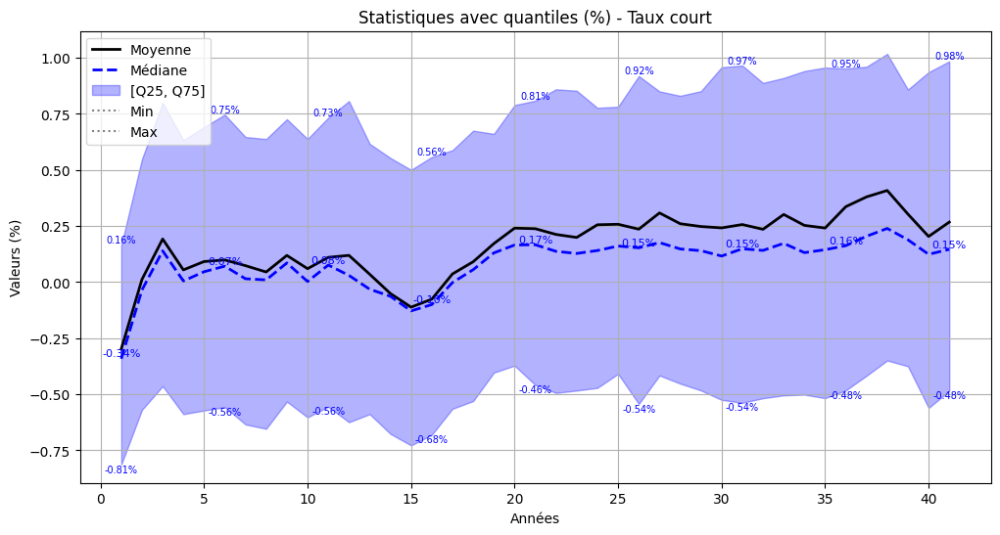

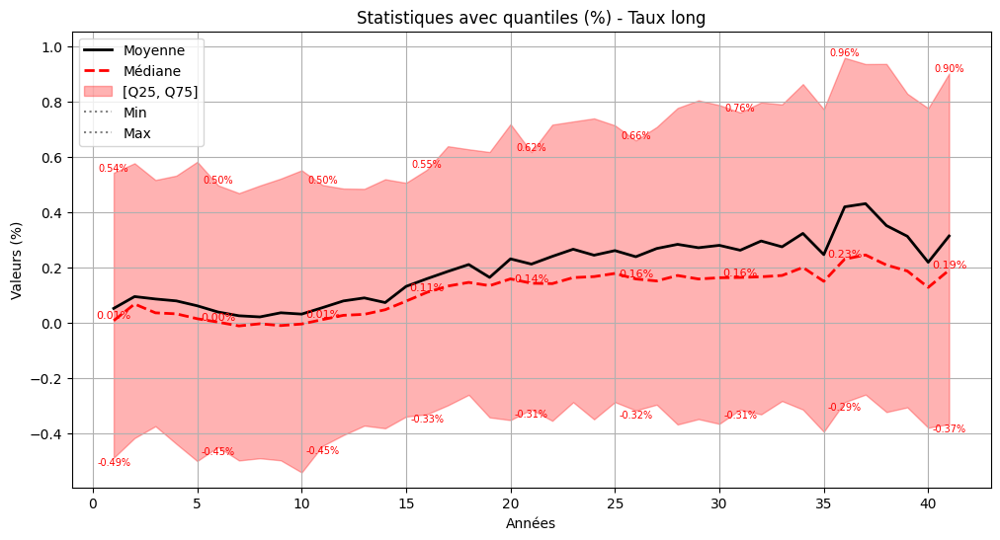

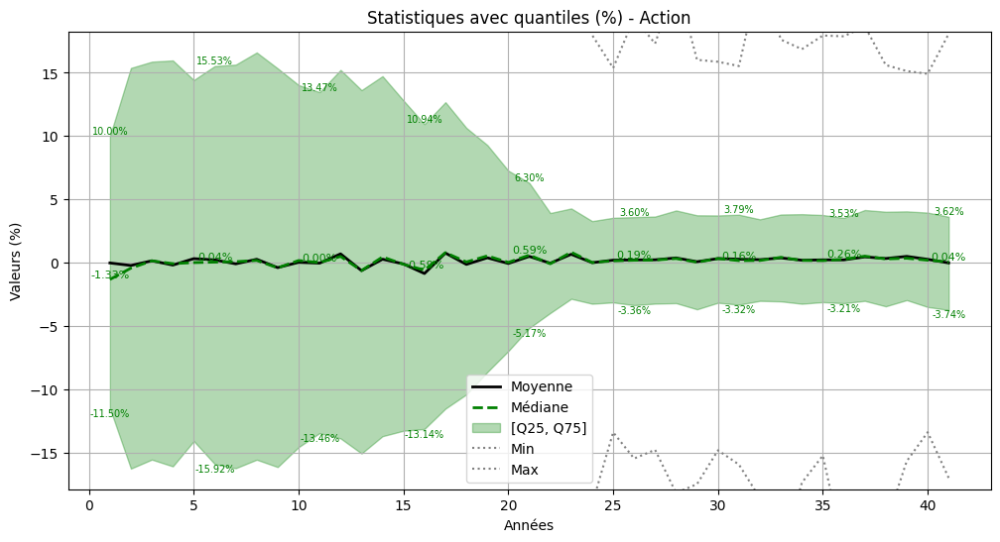

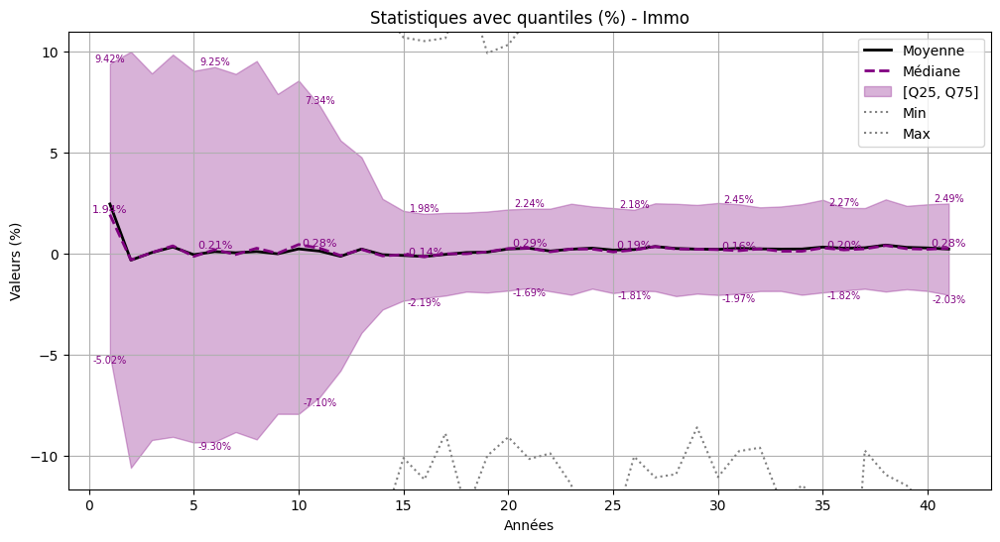

In [75]:
import matplotlib.pyplot as plt
import numpy as np

def plot_stats_with_labels_percent_zoom(matrix, name, color):
    """
    Trace min, max, moyenne et quantiles (25%, 50%, 75%) par année
    avec annotations en % et zoom sur la zone interquartile.
    """
    years = np.arange(1, matrix.shape[1]+1)

    # Calcul des statistiques
    min_vals = matrix.min(axis=0)
    max_vals = matrix.max(axis=0)
    mean_vals = matrix.mean(axis=0)
    q25 = np.quantile(matrix, 0.25, axis=0)
    median = np.quantile(matrix, 0.50, axis=0)
    q75 = np.quantile(matrix, 0.75, axis=0)

    # Conversion en %
    min_vals *= 100
    max_vals *= 100
    mean_vals *= 100
    q25 *= 100
    median *= 100
    q75 *= 100

    # Plot
    plt.figure(figsize=(12,6))
    plt.plot(years, mean_vals, color='black', linewidth=2, label='Moyenne')
    plt.plot(years, median, color=color, linestyle='--', linewidth=2, label='Médiane')
    plt.fill_between(years, q25, q75, color=color, alpha=0.3, label='[Q25, Q75]')
    plt.plot(years, min_vals, color='grey', linestyle=':', label='Min')
    plt.plot(years, max_vals, color='grey', linestyle=':', label='Max')

    # Ajouter des annotations (tous les 5 ans par exemple)
    for i in range(0, matrix.shape[1], 5):
        plt.text(years[i], median[i], f"{median[i]:.2f}%",
                 color=color, fontsize=8, ha='center', va='bottom')
        plt.text(years[i], q25[i], f"{q25[i]:.2f}%",
                 color=color, fontsize=7, ha='center', va='top')
        plt.text(years[i], q75[i], f"{q75[i]:.2f}%",
                 color=color, fontsize=7, ha='center', va='bottom')

    # Zoom sur la zone interquartile avec marge
    y_min = q25.min() - 0.1 * abs(q25.min())
    y_max = q75.max() + 0.1 * abs(q75.max())
    plt.ylim(y_min, y_max)

    plt.title(f"Statistiques avec quantiles (%) - {name}")
    plt.xlabel("Années")
    plt.ylabel("Valeurs (%)")
    plt.legend()
    plt.grid(True)
    plt.show()

# Exemple d’utilisation pour les 4 matrices
plot_stats_with_labels_percent_zoom(TL_var,   "Taux court", 'blue')
plot_stats_with_labels_percent_zoom(TLT_var,  "Taux long",  'red')
plot_stats_with_labels_percent_zoom(ACT_var,  "Action",     'green')
plot_stats_with_labels_percent_zoom(IMMO_var, "Immo",       'purple')

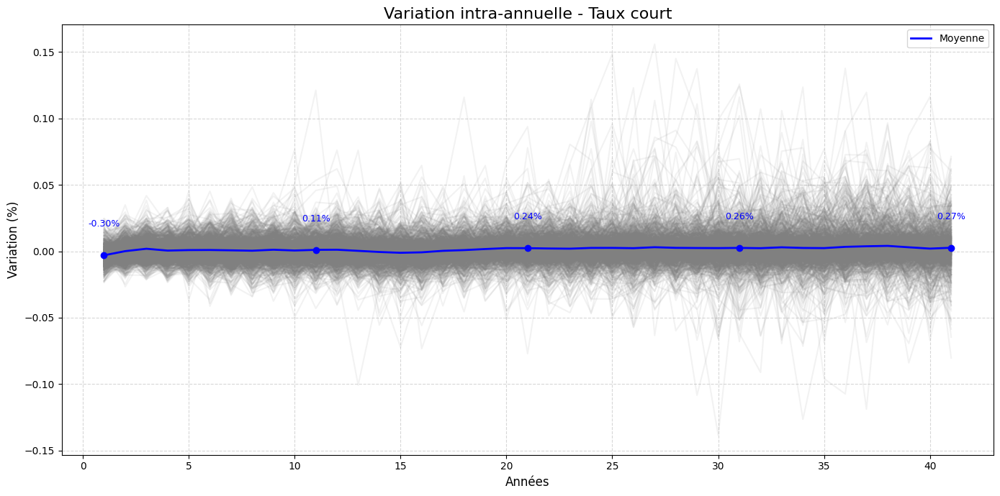

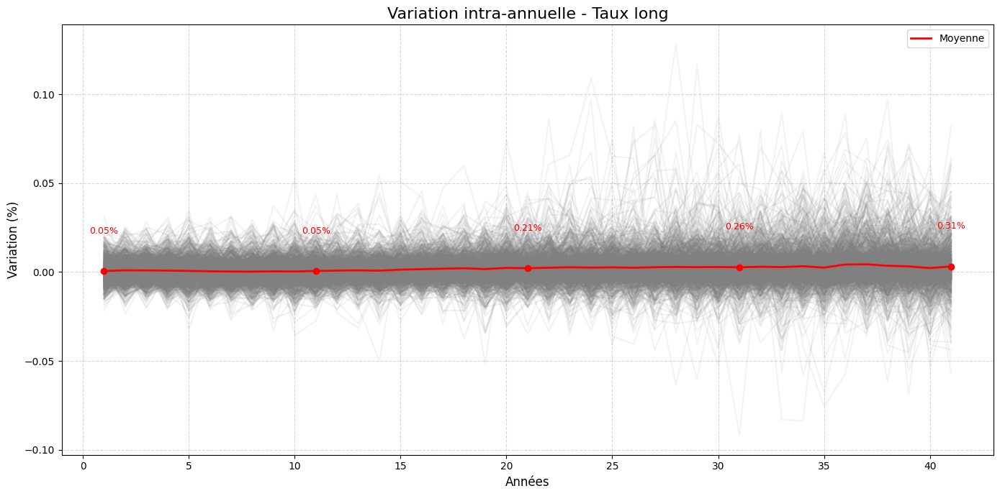

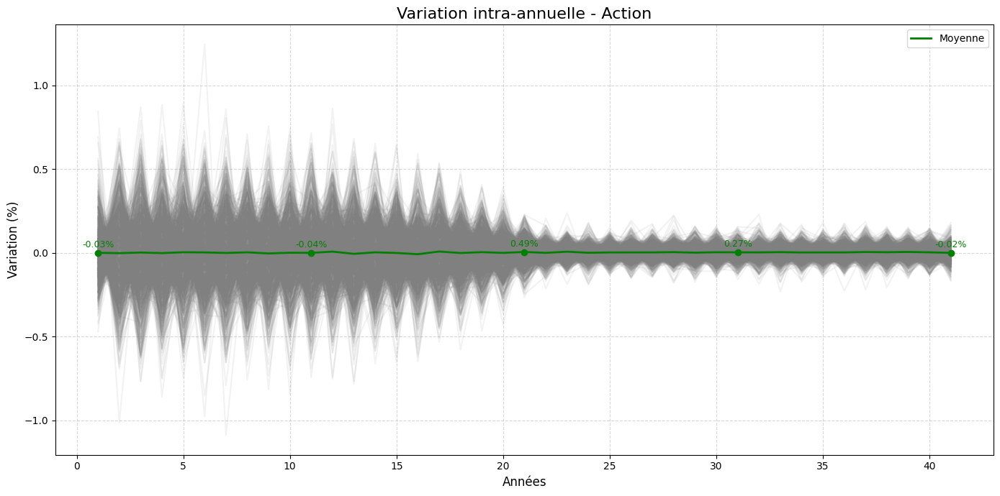

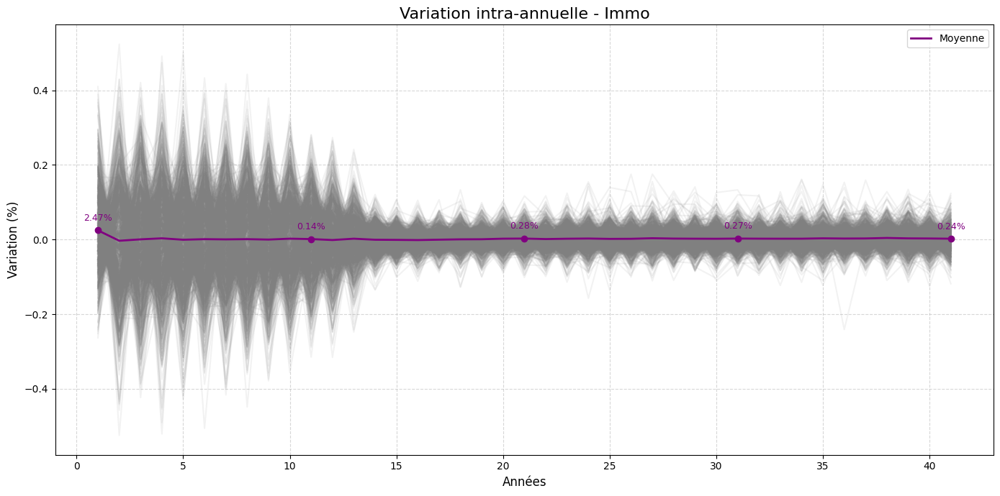

In [76]:
def plot_scenario_trajectories(matrix, maturities, plot_title, color):

    plt.figure(figsize=(14, 7))

    # Tracer tous les scénarios
    for i in range(matrix.shape[0]):
        plt.plot(maturities, matrix[i, :], color='gray', alpha=0.1)

    # Moyenne par année
    mean_by_year = matrix.mean(axis=0)
    plt.plot(maturities, mean_by_year, color=color, linewidth=2, label='Moyenne')

    # Points annotés (exemple : début, 10e, 20e, 30e, dernière année)
    indices_to_annotate = [0, 10, 20, 30, matrix.shape[1]-1]
    for idx in indices_to_annotate:
        if idx < len(maturities):
            x = maturities[idx]
            y = mean_by_year[idx]
            plt.scatter(x, y, color=color, zorder=5)
            plt.text(x, y + 0.02, f"{y*100:.2f}%", fontsize=9, ha='center', va='bottom', color=color)

    # Personnalisation
    plt.title(plot_title, fontsize=16)
    plt.xlabel("Années", fontsize=12)
    plt.ylabel("Variation (%)", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend()
    plt.tight_layout()
    plt.show()


# Exemple d’utilisation pour les 4 matrices de variation intra-annuelle
years = np.arange(1, TL_var.shape[1]+1)  # 41 années

plot_scenario_trajectories(TL_var,   years, "Variation intra-annuelle - Taux court", 'blue')
plot_scenario_trajectories(TLT_var,  years, "Variation intra-annuelle - Taux long",  'red')
plot_scenario_trajectories(ACT_var,  years, "Variation intra-annuelle - Action",     'green')
plot_scenario_trajectories(IMMO_var, years, "Variation intra-annuelle - Immo",       'purple')

# section 4.4 regression supervisée PVFP avec X_reduced

Regression supervisée

In [77]:
from sklearn.ensemble import GradientBoostingRegressor

# Supposons que tu as déjà défini transform_matrix et transform_variation_matrix

def build_features(TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix):
    # Étape 1 : seuil sur valeurs brutes
    TL_brut = transform_matrix_taux(TL_matrix, threshold1=0.015, threshold2=0.0098 )
    TLT_brut = transform_matrix_taux(TLT_matrix, threshold1=0.015, threshold2=0.0090 )
    ACT_brut = transform_matrix(ACT_matrix, threshold=-0.05)
    IMMO_brut = transform_matrix(IMMO_matrix, threshold=-0.05)

    # Concaténer les couples (brut + variation) pour chaque paramètre
    X = np.hstack([TL_brut,
                   TLT_brut,
                   ACT_brut,
                   IMMO_brut, ])
    return X

# Exemple d’utilisation
X = build_features(TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix)
y = pvfp_array  # shape (1000, 1)

# Régression Gradient Boosting
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = GradientBoostingRegressor(n_estimators=300, learning_rate=0.05, max_depth=3, random_state=42)
model.fit(X_train, y_train.ravel())

y_pred = model.predict(X_test)
r2 = r2_score(y_test, y_pred)

print("Shape de X :", X.shape)   # (1000, 8)
print("Score R² :", r2)



Shape de X : (1000, 6)
Score R² : 0.5807930590262966


Best méthode de regression pour X, X_reduced1, X_reduced2

In [78]:
def regression_study(X, y, test_size=0.2, random_state=42):

    models = {
        "LinearRegression": LinearRegression(),
        "Ridge": Ridge(alpha=1.0),
        "Lasso": Lasso(alpha=0.01),
        "RandomForest": RandomForestRegressor(n_estimators=200, random_state=random_state),
        "GradientBoosting": GradientBoostingRegressor(n_estimators=300, learning_rate=0.05, max_depth=3, random_state=random_state),
        "SVR": SVR(kernel="rbf", C=10, epsilon=0.1)
    }

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

    results = {}
    best_score = -np.inf
    best_model = None

    for name, model in models.items():
        model.fit(X_train, y_train.ravel())
        y_pred = model.predict(X_test)
        r2 = r2_score(y_test, y_pred)
        mse = mean_squared_error(y_test, y_pred)

        results[name] = {"R2": r2, "MSE": mse}

        if r2 > best_score:
            best_score = r2
            best_model = name

    return results, best_model


In [79]:
regression_study(X, y, test_size=0.2, random_state=42)

({'LinearRegression': {'R2': 0.5812873457483285, 'MSE': 42214752152.15928},
  'Ridge': {'R2': 0.5829500473014672, 'MSE': 42047118016.300156},
  'Lasso': {'R2': 0.5812875046133495, 'MSE': 42214736135.33384},
  'RandomForest': {'R2': 0.5556832584709344, 'MSE': 44796164936.13446},
  'GradientBoosting': {'R2': 0.5807930590262966, 'MSE': 42264586307.51809},
  'SVR': {'R2': 0.002020858518108515, 'MSE': 100616596328.99562}},
 'Ridge')

# Section 4.5 Regression logistique sur X_reduced et pvfp_binary

In [80]:
# rappeler la structure
print("Shape :", X_reduced_df.shape)
print("Premières lignes :\n", X_reduced_df.head())

Shape : (1000, 6)
Premières lignes :
    TL_reduced  TL_reduced_vitesse  TLT_reduced  TLT_reduced_vitesse  \
0    0.073171                 0.0     0.000000                  0.0   
1    0.097561                 0.0     0.170732                  0.0   
2    0.000000                 0.0     0.000000                  0.0   
3    0.195122                 0.0     0.097561                  0.0   
4    0.048780                 0.0     0.073171                  0.0   

   ACT_reduced  IMMO_reduced  
0     0.357143      0.071429  
1     0.166667      0.023810  
2     0.404762      0.023810  
3     0.071429      0.071429  
4     0.142857      0.095238  


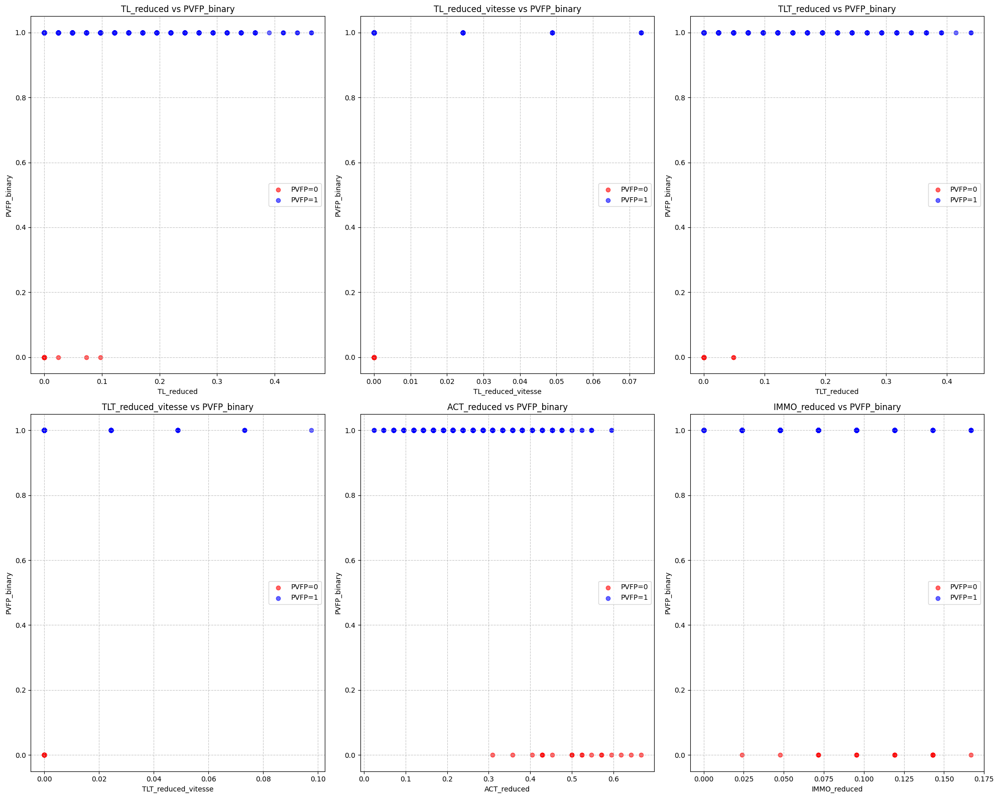

In [81]:
import matplotlib.pyplot as plt

# Nombre de colonnes
n_features = X_reduced_df.shape[1]

# Définir la grille (4x4 pour 16 features)
fig, axes = plt.subplots(2, 3, figsize=(20, 16))
axes = axes.flatten()  # transformer en liste pour itérer facilement

# Boucle sur chaque feature
for i in range(n_features):
    # Scatter avec couleurs selon pvfp_binary
    axes[i].scatter(
        X_reduced_df.iloc[:, i][pvfp_binary == 0], pvfp_binary[pvfp_binary == 0],
        color="red", alpha=0.6, label="PVFP=0"
    )
    axes[i].scatter(
        X_reduced_df.iloc[:, i][pvfp_binary == 1], pvfp_binary[pvfp_binary == 1],
        color="blue", alpha=0.6, label="PVFP=1"
    )

    axes[i].grid(True, linestyle="--", alpha=0.7)
    axes[i].set_xlabel(X_reduced_df.columns[i])
    axes[i].set_ylabel("PVFP_binary")
    axes[i].set_title(f"{X_reduced_df.columns[i]} vs PVFP_binary")
    axes[i].legend(loc="center right")

# Ajuster l'espacement
plt.tight_layout()
plt.show()

Regression logistique

In [82]:

# Séparer en train/test
X_train, X_test, y_train, y_test = train_test_split(X_reduced, pvfp_binary, test_size=0.2, random_state=42)

# Créer et entraîner le modèle de régression logistique
log_reg = LogisticRegression(max_iter=1000, solver="lbfgs")
log_reg.fit(X_train, y_train)

# Prédictions
y_pred = log_reg.predict(X_test)
y_proba = log_reg.predict_proba(X_test)[:, 1]

# Évaluation
acc = accuracy_score(y_test, y_pred)
auc = roc_auc_score(y_test, y_proba)
cm = confusion_matrix(y_test, y_pred)

print("Accuracy :", acc)
print("AUC :", auc)
print("Matrice de confusion :\n", cm)
print("\nRapport de classification :\n", classification_report(y_test, y_pred))

Accuracy : 0.995
AUC : 1.0
Matrice de confusion :
 [[  0   1]
 [  0 199]]

Rapport de classification :
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.99      1.00      1.00       199

    accuracy                           0.99       200
   macro avg       0.50      0.50      0.50       200
weighted avg       0.99      0.99      0.99       200



/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [83]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

# Tirage aléatoire : séparer en train/test
X_train, X_test, y_train, y_test = train_test_split(
    X_reduced, pvfp_binary, test_size=0.2, random_state=42, stratify=pvfp_binary
)

# Créer et entraîner le modèle de régression logistique
log_reg = LogisticRegression(max_iter=1000, solver="lbfgs", class_weight="balanced")
log_reg.fit(X_train, y_train)

# Prédictions sur l’échantillon test
y_pred = log_reg.predict(X_test)

# Calcul du pourcentage de réussite
accuracy = accuracy_score(y_test, y_pred) * 100

print(f"Pourcentage de réussite de la prédiction : {accuracy:.2f}%")

Pourcentage de réussite de la prédiction : 92.00%


In [84]:
# Coefficients associés à chaque feature
coefficients = log_reg.coef_[0]

# Intercept (biais du modèle)
intercept = log_reg.intercept_[0]

# Afficher les résultats
print("Intercept :", intercept)
print("Coefficients :")
for feature, coef in zip(X_reduced_df.columns, coefficients):
    print(f"{feature}: {coef:.4f}")

Intercept : 4.107480045191245
Coefficients :
TL_reduced: 2.6020
TL_reduced_vitesse: 0.0120
TLT_reduced: 1.7790
TLT_reduced_vitesse: 0.0187
ACT_reduced: -10.8301
IMMO_reduced: -2.3948


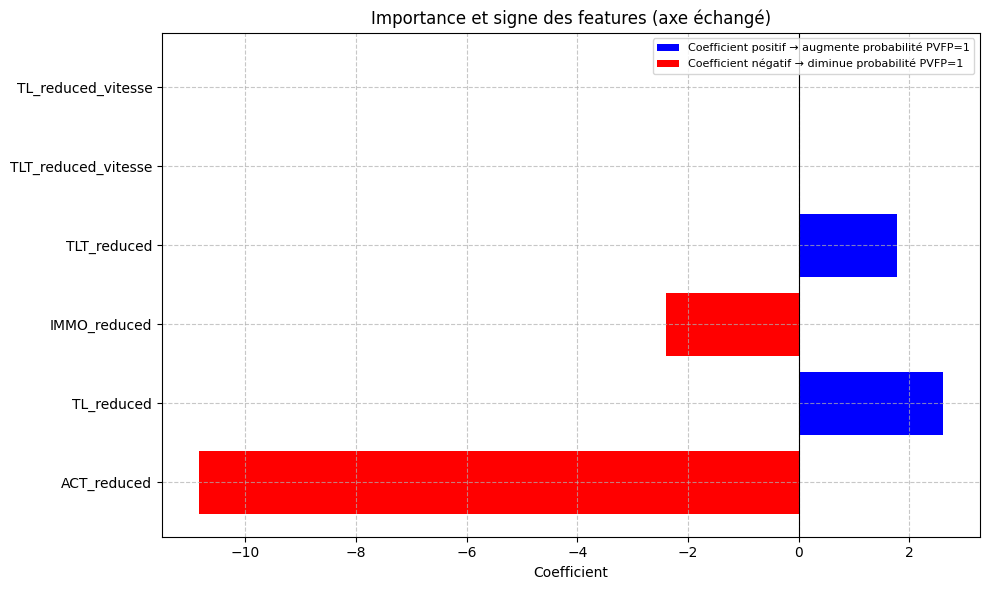

In [85]:
from matplotlib.patches import Patch

# Récupérer les coefficients et les noms de colonnes
coefficients = log_reg.coef_[0]
features = X_reduced_df.columns

# Trier par importance absolue
sorted_idx = np.argsort(np.abs(coefficients))[::-1]

# Couleurs : bleu si positif, rouge si négatif
colors = ["blue" if c > 0 else "red" for c in coefficients[sorted_idx]]

# Créer le barplot horizontal
plt.figure(figsize=(10,6))
plt.barh(range(len(coefficients)), coefficients[sorted_idx], color=colors)
plt.yticks(range(len(coefficients)), features[sorted_idx])
plt.xlabel("Coefficient")
plt.title("Importance et signe des features (axe échangé)")
plt.axvline(0, color="black", linewidth=0.8)  # ligne verticale à 0
plt.grid(True, linestyle="--", alpha=0.7)

# Ajouter une légende réduite en haut à droite
legend_elements = [
    Patch(facecolor="blue", label="Coefficient positif → augmente probabilité PVFP=1"),
    Patch(facecolor="red", label="Coefficient négatif → diminue probabilité PVFP=1")
]
plt.legend(handles=legend_elements, loc="upper right", fontsize=8)

plt.tight_layout()
plt.show()

# Section 5 - étude année par année


In [86]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np

def cluster_data(X, Y, k_x=3, k_y=3):

    # S'assurer que Y est en colonne
    Y = Y.reshape(-1, 1)

    # Clustering sur X
    kmeans_x = KMeans(n_clusters=k_x, random_state=42)
    clusters_x = kmeans_x.fit_predict(X)

    # Clustering sur Y
    kmeans_y = KMeans(n_clusters=k_y, random_state=42)
    clusters_y = kmeans_y.fit_predict(Y)

    # Affichage rapide
    print(f"Clusters X (hypo) :", np.unique(clusters_x))
    print(f"Clusters Y (RFA) :", np.unique(clusters_y))

    # Visualisation des clusters X (2 premières dimensions)
    plt.scatter(X[:,0], X[:,1], c=clusters_x, cmap="viridis", alpha=0.7)
    plt.xlabel("Paramètre 1")
    plt.ylabel("Paramètre 2")
    plt.title("Clustering X (hypothèses)")
    plt.show()

    # Visualisation des clusters Y
    plt.scatter(range(len(Y)), Y, c=clusters_y, cmap="plasma", alpha=0.7)
    plt.xlabel("Scénarios")
    plt.ylabel("RFA")
    plt.title("Clustering Y (RFA)")
    plt.show()

    return clusters_x, clusters_y

Clusters X (hypo) : [0 1 2]
Clusters Y (RFA) : [0 1 2]


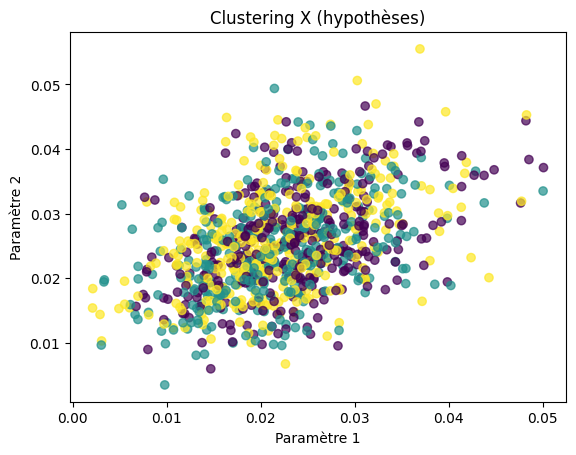

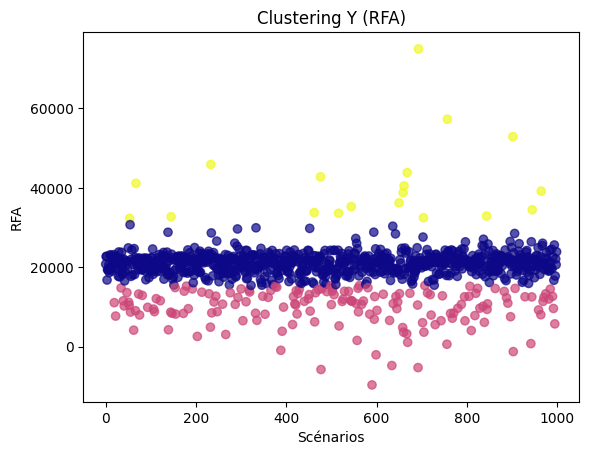

In [87]:
# Supposons que tu as déjà construit X et y pour une année donnée
# X.shape = (1000, 4), y.shape = (1000,)

clusters_x, clusters_y = cluster_data(hypo, RFA, k_x=3, k_y=3)

In [88]:
from sklearn.cluster import AgglomerativeClustering
import matplotlib.pyplot as plt
import numpy as np

def hierarchical_cluster_data(X, Y, k_x=3, k_y=3, linkage="ward"):

    # S'assurer que Y est en colonne
    Y = Y.reshape(-1, 1)

    # Clustering hiérarchique sur X
    hc_x = AgglomerativeClustering(n_clusters=k_x, linkage=linkage)
    clusters_x = hc_x.fit_predict(X)

    # Clustering hiérarchique sur Y
    hc_y = AgglomerativeClustering(n_clusters=k_y, linkage=linkage)
    clusters_y = hc_y.fit_predict(Y)

    # Affichage rapide
    print(f"Clusters X (hypo) :", np.unique(clusters_x))
    print(f"Clusters Y (RFA) :", np.unique(clusters_y))

    # Visualisation des clusters X (2 premières dimensions)
    plt.scatter(X[:,0], X[:,1], c=clusters_x, cmap="viridis", alpha=0.7)
    plt.xlabel("Paramètre 1")
    plt.ylabel("Paramètre 2")
    plt.title("Clustering hiérarchique X (hypothèses)")
    plt.show()

    # Visualisation des clusters Y
    plt.scatter(range(len(Y)), Y, c=clusters_y, cmap="plasma", alpha=0.7)
    plt.xlabel("Scénarios")
    plt.ylabel("RFA")
    plt.title("Clustering hiérarchique Y (RFA)")
    plt.show()

    return clusters_x, clusters_y

Clusters X (hypo) : [0 1 2]
Clusters Y (RFA) : [0 1 2]


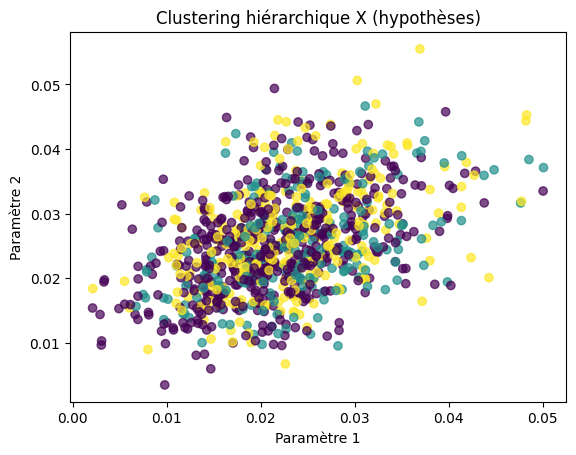

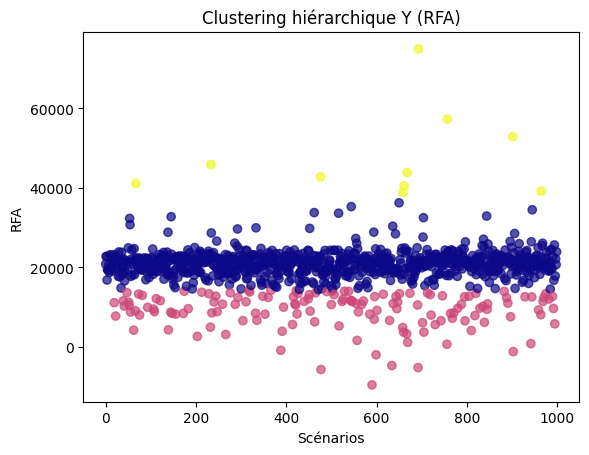

In [89]:
# Supposons que tu as déjà construit X et y pour une année donnée
clusters_x, clusters_y = hierarchical_cluster_data(hypo, RFA, k_x=3, k_y=3, linkage="ward")

search for the best regression approach

In [90]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR

def regression_study(X, y, test_size=0.2, random_state=42):

    # Séparer train/test
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

    # Liste des modèles à tester
    models = {
        "LinearRegression": LinearRegression(),
        "Ridge": Ridge(alpha=1.0),
        "Lasso": Lasso(alpha=0.01),
        "RandomForest": RandomForestRegressor(n_estimators=200, random_state=random_state),
        "GradientBoosting": GradientBoostingRegressor(n_estimators=200, random_state=random_state),
        "SVR": SVR(kernel="rbf")
    }

    results = {}

    # Entraînement et évaluation
    for name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        r2 = r2_score(y_test, y_pred)
        results[name] = r2
        print(f"{name} → R2 = {r2:.4f}")

    # Trouver le meilleur modèle
    best_model = max(results, key=results.get)
    print("\n✅ Meilleur modèle :", best_model, "avec R2 =", results[best_model])

    return results, best_model

In [91]:
# Supposons que tu as déjà X et y pour une année donnée
results, best_model = regression_study(hypo, RFA)

# Résultats sous forme de DataFrame pour plus de lisibilité
df_results = pd.DataFrame(list(results.items()), columns=["Modèle", "R2"])
print(df_results)

LinearRegression → R2 = 0.5312
Ridge → R2 = 0.5032
Lasso → R2 = 0.5312
RandomForest → R2 = 0.8577
GradientBoosting → R2 = 0.8792
SVR → R2 = -0.0392

✅ Meilleur modèle : GradientBoosting avec R2 = 0.8792329408690586
             Modèle        R2
0  LinearRegression  0.531229
1             Ridge  0.503155
2             Lasso  0.531225
3      RandomForest  0.857749
4  GradientBoosting  0.879233
5               SVR -0.039158


In [92]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.ensemble import GradientBoostingRegressor
import matplotlib.pyplot as plt
import shap

def gradient_boosting_with_shap(X, y, test_size=0.2, random_state=42,
                                n_estimators=300, learning_rate=0.05, max_depth=3,
                                feature_names=None):

    # Séparer train/test
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

    # Définir le modèle Gradient Boosting
    model = GradientBoostingRegressor(
        n_estimators=n_estimators,
        learning_rate=learning_rate,
        max_depth=max_depth,
        random_state=random_state
    )

    # Entraînement
    model.fit(X_train, y_train)

    # Prédictions
    y_pred = model.predict(X_test)

    # Évaluation
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)

    print(f"Gradient Boosting → R2 = {r2:.4f}, MSE = {mse:.4f}")

    # Visualisation : prédictions vs valeurs réelles
    plt.scatter(y_test, y_pred, alpha=0.7, color="blue")
    plt.xlabel("Valeurs réelles (y_test)")
    plt.ylabel("Prédictions (y_pred)")
    plt.title("Gradient Boosting : Réel vs Prédit")
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color="red", linestyle="--")
    plt.show()

    # --- Analyse SHAP ---
    explainer = shap.Explainer(model, X_train)
    shap_values = explainer(X_test)

    # Summary plot (importance globale des features)
    shap.summary_plot(shap_values, X_test, feature_names=feature_names)

    # Optionnel : dépendance d’une feature
    if feature_names:
        shap.dependence_plot(0, shap_values.values, X_test, feature_names=feature_names)

    return model, r2, mse

Gradient Boosting → R2 = 0.8840, MSE = 5364072.3025


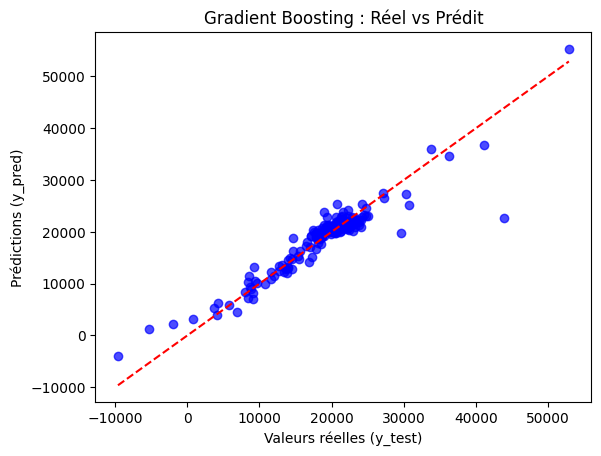

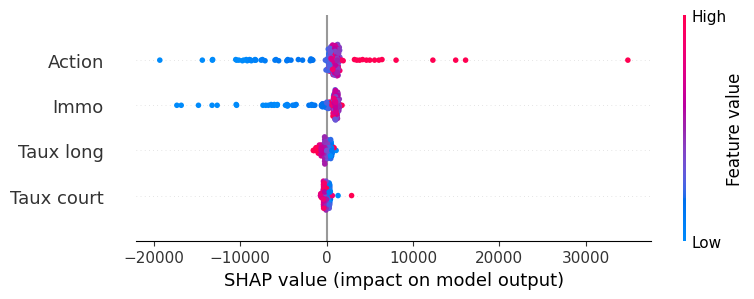

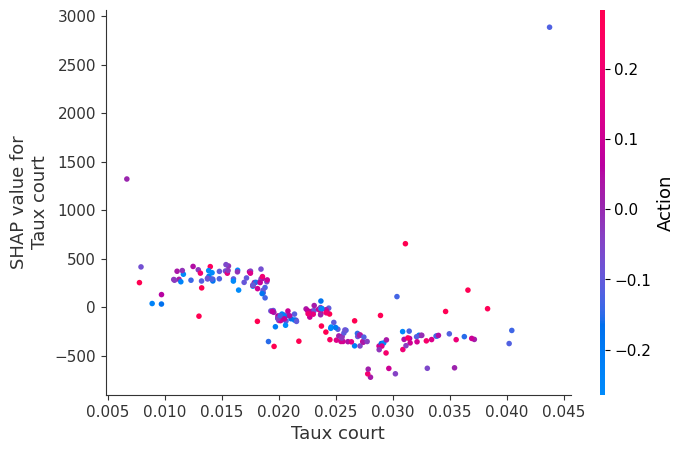

In [93]:
# Supposons que X et y soient déjà définis
feature_names = ["Taux court", "Taux long", "Action", "Immo"]

model, r2, mse = gradient_boosting_with_shap(hypo, RFA, feature_names=feature_names)

In [94]:
all_results = []

# Boucle sur les années 0 à 9 inclus
for year in range(0, 10):
    print(f"\n===== Année {year} =====")

    # Préparer X (hypo) et y (RFA) pour l'année donnée
    hypo, RFA = prepare_year_data(year, TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix, RFA_matrix)

    # Étude de régression avec comparaison des approches
    results, best_model = regression_study(hypo, RFA)

    # Stocker les résultats
    all_results.append({
        "Année": year,
        "BestModel": best_model,
        "Scores": results
    })

# Transformer en DataFrame lisible
df_summary = pd.DataFrame([
    {"Année": r["Année"], "BestModel": r["BestModel"], **r["Scores"]}
    for r in all_results
])

print("\nRésumé des meilleurs modèles par année :")
print(df_summary)


===== Année 0 =====
LinearRegression → R2 = 1.0000
Ridge → R2 = 1.0000
Lasso → R2 = 1.0000


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(


RandomForest → R2 = 1.0000
GradientBoosting → R2 = 1.0000
SVR → R2 = 1.0000

✅ Meilleur modèle : LinearRegression avec R2 = 1.0

===== Année 1 =====
LinearRegression → R2 = 0.5312
Ridge → R2 = 0.5032
Lasso → R2 = 0.5312
RandomForest → R2 = 0.8577
GradientBoosting → R2 = 0.8792
SVR → R2 = -0.0392

✅ Meilleur modèle : GradientBoosting avec R2 = 0.8792329408690586

===== Année 2 =====
LinearRegression → R2 = 0.2752
Ridge → R2 = 0.2673
Lasso → R2 = 0.2752
RandomForest → R2 = 0.1920
GradientBoosting → R2 = 0.1877
SVR → R2 = 0.0031

✅ Meilleur modèle : Lasso avec R2 = 0.275172014178512

===== Année 3 =====
LinearRegression → R2 = 0.3334
Ridge → R2 = 0.3197
Lasso → R2 = 0.3334
RandomForest → R2 = 0.1593
GradientBoosting → R2 = 0.0927
SVR → R2 = 0.0045

✅ Meilleur modèle : Lasso avec R2 = 0.33340686331546254

===== Année 4 =====
LinearRegression → R2 = 0.3880
Ridge → R2 = 0.3434
Lasso → R2 = 0.3880
RandomForest → R2 = 0.2538
GradientBoosting → R2 = 0.1993
SVR → R2 = -0.0012

✅ Meilleur modèle 

# Section 6 - étude rachat C


In [95]:
plot_scenario_trajectories(MRC_matrix, maturities2, "Trajectoire 1000 scénarios pour montant de rachar C sur 40 ans")

TypeError: plot_scenario_trajectories() missing 1 required positional argument: 'color'

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Étape 1 : Calculer la moyenne de chaque scénario sur 41 ans
scenario_means = MRC_matrix.mean(axis=1).reshape(-1, 1)

# Étape 2 : Clustering KMeans basé sur la moyenne
n_clusters = 3  # tu peux ajuster le nombre de clusters
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
labels = kmeans.fit_predict(scenario_means)

# Étape 3 : Scatter plot des scénarios selon leur moyenne
plt.figure(figsize=(10,6))

# Indices des scénarios
indices = np.arange(len(scenario_means))

# Tracer chaque cluster séparément
for cluster in range(n_clusters):
    plt.scatter(
        indices[labels == cluster],                # indices des scénarios du cluster
        scenario_means.flatten()[labels == cluster],  # moyennes correspondantes
        label=f"Cluster {cluster}",
        alpha=0.7
    )

# Ajouter les centres des clusters
plt.scatter(
    indices.mean() * np.ones(n_clusters),          # placer les centres au milieu de l'axe X
    kmeans.cluster_centers_.flatten(),
    c='red', marker='*', s=200, label='Centres'
)

plt.title("Clustering des scénarios selon la moyenne sur 41 ans")
plt.xlabel("Index du scénario")
plt.ylabel("Moyenne du scénario")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

In [ ]:
def plot_cluster_trajectories(cluster_id, labels,
                              TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix,
                              MRC_matrix, RFA_matrix,TRC_matrix,
                              years_42, years_41):

    # Sélectionner les indices des scénarios appartenant au cluster
    idx = np.where(labels == cluster_id)[0]

    # Calculer la max de chaque scénario du cluster (sur 42 ans, basé sur TL_matrix)
    scenario_max = MRC_matrix[idx].max(axis=1)
    top3_idx = idx[np.argsort(scenario_max)[-3:]]  # indices des 3 plus élevés

    # --- Plot 1 : 4 matrices de paramètres ---
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))

    # --- Taux court ---
    for i in idx:
        axes[0,0].plot(years_42, TL_matrix[i], color='blue', alpha=0.1)
    axes[0,0].plot(years_42, TL_matrix[idx].mean(axis=0), color='black', linewidth=2, label='Moyenne')
    for i in top3_idx:
        axes[0,0].plot(years_42, TL_matrix[i], linewidth=2, label=f"Scénario {i}")
        axes[0,0].text(years_42[-1], TL_matrix[i,-1], f"{i}", fontsize=9, color='blue')
    axes[0,0].set_title(f"Taux court - Cluster {cluster_id}")
    axes[0,0].set_xlabel("Années")
    axes[0,0].set_ylabel("Valeurs")
    axes[0,0].legend()

    # --- Taux long ---
    for i in idx:
        axes[0,1].plot(years_42, TLT_matrix[i], color='red', alpha=0.1)
    axes[0,1].plot(years_42, TLT_matrix[idx].mean(axis=0), color='black', linewidth=2, label='Moyenne')
    for i in top3_idx:
        axes[0,1].plot(years_42, TLT_matrix[i], linewidth=2, label=f"Scénario {i}")
        axes[0,1].text(years_42[-1], TLT_matrix[i,-1], f"{i}", fontsize=9, color='red')
    axes[0,1].set_title(f"Taux long - Cluster {cluster_id}")
    axes[0,1].set_xlabel("Années")
    axes[0,1].set_ylabel("Valeurs")
    axes[0,1].legend()

    # --- Action ---
    for i in idx:
        axes[1,0].plot(years_42, ACT_matrix[i], color='green', alpha=0.1)
    axes[1,0].plot(years_42, ACT_matrix[idx].mean(axis=0), color='black', linewidth=2, label='Moyenne')
    for i in top3_idx:
        axes[1,0].plot(years_42, ACT_matrix[i], linewidth=2, label=f"Scénario {i}")
        axes[1,0].text(years_42[-1], ACT_matrix[i,-1], f"{i}", fontsize=9, color='green')
    axes[1,0].set_title(f"Action - Cluster {cluster_id}")
    axes[1,0].set_xlabel("Années")
    axes[1,0].set_ylabel("Valeurs")
    axes[1,0].legend()

    # --- Immo ---
    for i in idx:
        axes[1,1].plot(years_42, IMMO_matrix[i], color='purple', alpha=0.1)
    axes[1,1].plot(years_42, IMMO_matrix[idx].mean(axis=0), color='black', linewidth=2, label='Moyenne')
    for i in top3_idx:
        axes[1,1].plot(years_42, IMMO_matrix[i], linewidth=2, label=f"Scénario {i}")
        axes[1,1].text(years_42[-1], IMMO_matrix[i,-1], f"{i}", fontsize=9, color='purple')
    axes[1,1].set_title(f"Immo - Cluster {cluster_id}")
    axes[1,1].set_xlabel("Années")
    axes[1,1].set_ylabel("Valeurs")
    axes[1,1].legend()
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

    # --- Plot 2 : MRC et RFA ---
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # --- MRC ---
    for i in idx:
        axes[0].plot(years_41, MRC_matrix[i], color='orange', alpha=0.1)
    axes[0].plot(years_41, MRC_matrix[idx].mean(axis=0), color='black', linewidth=2, label='Moyenne')
    for i in top3_idx:
        axes[0].plot(years_41, MRC_matrix[i], linewidth=2, label=f"Scénario {i}")
        axes[0].text(years_41[-1], MRC_matrix[i,-1], f"{i}", fontsize=9, color='orange')
    axes[0].set_title(f"MRC - Cluster {cluster_id}")
    axes[0].set_xlabel("Années")
    axes[0].set_ylabel("Valeurs")
    axes[0].legend()

    # --- RFA ---
    for i in idx:
        axes[1].plot(years_41, RFA_matrix[i], color='brown', alpha=0.1)
    axes[1].plot(years_41, RFA_matrix[idx].mean(axis=0), color='black', linewidth=2, label='Moyenne')
    for i in top3_idx:
        axes[1].plot(years_41, RFA_matrix[i], linewidth=2, label=f"Scénario {i}")
        axes[1].text(years_41[-1], RFA_matrix[i,-1], f"{i}", fontsize=9, color='brown')
    axes[1].set_title(f"RFA - Cluster {cluster_id}")
    axes[1].set_xlabel("Années")
    axes[1].set_ylabel("Valeurs")
    axes[1].legend()
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

    # --- Plot 3 : TRC ---
    fig, ax = plt.subplots(figsize=(7, 5))

    for i in idx:
        ax.plot(years_41, TRC_matrix[i], color='grey', alpha=0.1)
    ax.plot(years_41, TRC_matrix[idx].mean(axis=0), color='black', linewidth=2, label='Moyenne')
    for i in top3_idx:
        ax.plot(years_41, TRC_matrix[i], linewidth=2, label=f"Scénario {i}")
        ax.text(years_41[-1], TRC_matrix[i,-1], f"{i}", fontsize=9, color='orange')

    ax.set_title(f"TRC - Cluster {cluster_id}")
    ax.set_xlabel("Années")
    ax.set_ylabel("Valeurs")
    ax.legend()
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

In [ ]:
years_42 = np.arange(1, 43)  # pour TL, TLT, ACT, IMMO
years_41 = np.arange(1, 42)  # pour MRC, RFA

plot_cluster_trajectories(1, labels,
                          TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix,
                          MRC_matrix, RFA_matrix,TRC_matrix,
                          years_42, years_41)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_scenario_split(scenario_id,
                        TI_matrix, TLT_matrix, ACT_matrix, IMMO_matrix,
                        MRC_matrix, RFA_matrix, TRC_matrix):
    years_42 = np.arange(1, 43)  # 42 années
    years_41 = np.arange(1, 42)  # 41 années

    # --- Plot 1 : TI, TLT, ACT, IMMO, TRC ---
    plt.figure(figsize=(12,6))
    for data, label, color, years in [
        (TI_matrix[scenario_id], "Taux court (TI)", "blue", years_42),
        (TLT_matrix[scenario_id], "Taux long (TLT)", "red", years_42),
        (ACT_matrix[scenario_id], "Action (ACT)", "green", years_42),
        (IMMO_matrix[scenario_id], "Immo (IMMO)", "purple", years_42),
        (TRC_matrix[scenario_id], "Taux RC (TRC)", "pink", years_41)
    ]:
        plt.plot(years, data, label=label, color=color)
        # Annoter min et max
        min_idx, max_idx = np.argmin(data), np.argmax(data)
        plt.scatter(years[min_idx], data[min_idx], color=color, marker="o")
        plt.text(years[min_idx], data[min_idx],
                 f"Min={data[min_idx]:.2f}%", fontsize=8, color=color, ha="left", va="top")
        plt.scatter(years[max_idx], data[max_idx], color=color, marker="o")
        plt.text(years[max_idx], data[max_idx],
                 f"Max={data[max_idx]:.2f}%", fontsize=8, color=color, ha="left", va="bottom")

    plt.title(f"Trajectoires du scénario {scenario_id} - Paramètres financiers (TI, TLT, ACT, IMMO, TRC)")
    plt.xlabel("Années")
    plt.ylabel("Valeurs")
    # préciser toutes les années de l’axe X
    plt.xticks(np.arange(1, 43))
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

    # --- Plot 2 : MRC et RFA ---
    plt.figure(figsize=(12,6))
    for data, label, color in [
        (MRC_matrix[scenario_id], "Montant RC (MRC)", "orange"),
        (RFA_matrix[scenario_id], "RFA", "brown")
    ]:
        plt.plot(years_41, data, label=label, color=color)
        # Annoter min et max
        min_idx, max_idx = np.argmin(data), np.argmax(data)
        plt.scatter(years_41[min_idx], data[min_idx], color=color, marker="o")
        plt.text(years_41[min_idx], data[min_idx],
                 f"Min={data[min_idx]:.2f}%", fontsize=8, color=color, ha="left", va="top")
        plt.scatter(years_41[max_idx], data[max_idx], color=color, marker="o")
        plt.text(years_41[max_idx], data[max_idx],
                 f"Max={data[max_idx]:.2f}%", fontsize=8, color=color, ha="left", va="bottom")

    plt.title(f"Trajectoires du scénario {scenario_id} - Montant RC et RFA")
    plt.xlabel("Années")
    plt.ylabel("Valeurs")
    # préciser toutes les années de l’axe X
    plt.xticks(np.arange(1, 42))
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

In [ ]:
# Exemple : afficher le scénario numéro 100
plot_scenario_split(191, TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix, MRC_matrix, RFA_matrix, TRC_matrix)
plot_scenario_split(650, TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix, MRC_matrix, RFA_matrix, TRC_matrix)
plot_scenario_split(704, TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix, MRC_matrix, RFA_matrix, TRC_matrix)

#(New)Section 7 - réduction de dim

In [96]:
X = np.hstack([TL_matrix,
                       TLT_matrix,
                       ACT_matrix,
                       IMMO_matrix])
y = pvfp_array

Résumé statistique de GSE pour réduction de dim

In [97]:
def extract_features(matrix, window=3):
    n_scenarios, n_years = matrix.shape
    features = []

    # années pour calculer la tendance
    years = np.arange(n_years).reshape(-1, 1)

    for i in range(n_scenarios):
        serie = matrix[i]

        # Moyenne, variance, min, max par chaque ligne
        #mean_val = np.mean(serie)
        rolling_mean = pd.Series(serie).rolling(window=window).mean()
        mean_val = rolling_mean.mean()  # moyen mobile
        var_val = np.var(serie)
        min_val = np.min(serie)
        max_val = np.max(serie)

        # Tendance (pente de la régression linéaire sur la série)
        reg = LinearRegression().fit(years, serie)
        slope = reg.coef_[0]

        features.append([mean_val, var_val, min_val, max_val, slope])

    return np.array(features)
"""
# Exemple d’utilisation avec tes matrices
def build_feature_matrix(TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix):
    TL_features   = extract_features(TL_matrix)
    TLT_features  = extract_features(TLT_matrix)
    ACT_features  = extract_features(ACT_matrix)
    IMMO_features = extract_features(IMMO_matrix)

    # Concaténer les features pour chaque scénario
    X_reduced = np.hstack([TL_features, TLT_features, ACT_features, IMMO_features])

    # Colonnes explicites pour interprétation
    columns = []
    for name in ["TL", "TLT", "ACT", "IMMO"]:
        columns += [f"{name}_mean", f"{name}_var", f"{name}_min", f"{name}_max", f"{name}_trend"]

    return pd.DataFrame(X_reduced, columns=columns)
"""



'\n# Exemple d’utilisation avec tes matrices\ndef build_feature_matrix(TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix):\n    TL_features   = extract_features(TL_matrix)\n    TLT_features  = extract_features(TLT_matrix)\n    ACT_features  = extract_features(ACT_matrix)\n    IMMO_features = extract_features(IMMO_matrix)\n\n    # Concaténer les features pour chaque scénario\n    X_reduced = np.hstack([TL_features, TLT_features, ACT_features, IMMO_features])\n\n    # Colonnes explicites pour interprétation\n    columns = []\n    for name in ["TL", "TLT", "ACT", "IMMO"]:\n        columns += [f"{name}_mean", f"{name}_var", f"{name}_min", f"{name}_max", f"{name}_trend"]\n\n    return pd.DataFrame(X_reduced, columns=columns)\n'

In [98]:
def build_feature_matrix(TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix, filename="X_reduced_features.xlsx"):
    # Extraire les features
    TL_features   = extract_features(TL_matrix,3)
    TLT_features  = extract_features(TLT_matrix,3)
    ACT_features  = extract_features(ACT_matrix,3)
    IMMO_features = extract_features(IMMO_matrix,3)

    # Concaténer les features pour chaque scénario
    X_reduced = np.hstack([TL_features, TLT_features, ACT_features, IMMO_features])

    # Colonnes explicites pour interprétation
    columns = []
    for name in ["TL", "TLT", "ACT", "IMMO"]:
        columns += [f"{name}_mean", f"{name}_var", f"{name}_min", f"{name}_max", f"{name}_trend"]

    # Créer DataFrame
    X_reduced_df = pd.DataFrame(X_reduced, columns=columns)

    # Vérifier la structure
    print("Shape of X_redueced1:", X_reduced_df.shape)
    #print("Premières lignes :\n", X_reduced_df.head())

    # Exporter vers Excel
    X_reduced_df.to_excel(filename, index=False)
    print(f"Fichier Excel '{filename}' créé avec succès.")

    # Télécharger si on est sur Google Colab
    try:
        files.download(filename)
    except:
        print("Téléchargement automatique non disponible en dehors de Google Colab.")

    return X_reduced_df, columns

In [99]:
X_reduced1, columns_reduced1 = build_feature_matrix(TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix)

Shape of X_redueced1: (1000, 20)
Fichier Excel 'X_reduced_features.xlsx' créé avec succès.


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [100]:
# Afficher les lignes 191, 650 et 704
print(X_reduced1.iloc[[191, 650, 704]])

      TL_mean    TL_var    TL_min  TL_max  TL_trend  TLT_mean   TLT_var  \
191  0.264894  0.033242  0.021681     0.5  0.014178  0.284938  0.032130   
650  0.232658  0.031806  0.025454     0.5  0.013547  0.263927  0.032076   
704  0.229415  0.030942  0.023887     0.5  0.013719  0.250221  0.032328   

      TLT_min  TLT_max  TLT_trend  ACT_mean   ACT_var   ACT_min   ACT_max  \
191  0.024878      0.5   0.014210  0.185367  0.052740 -0.321442  0.532301   
650  0.024878      0.5   0.013989  0.185842  0.041858 -0.184448  0.507909   
704  0.024878      0.5   0.014330  0.240226  0.034492 -0.155418  0.527951   

     ACT_trend  IMMO_mean  IMMO_var  IMMO_min  IMMO_max  IMMO_trend  
191   0.016552   0.233448  0.043289 -0.194563  0.559977    0.015898  
650   0.013074   0.225796  0.034184 -0.088658  0.542649    0.013725  
704   0.009586   0.227211  0.031189 -0.106427  0.513340    0.012634  


In [101]:
def plot_trend_for_scenario(matrix, name, scenario_id=None):
    n_scenarios, n_years = matrix.shape
    years = np.arange(n_years).reshape(-1, 1)

    plt.figure(figsize=(12,6))

    # Si un scénario est donné, on ne trace que celui-là
    scenarios_to_plot = [scenario_id] if scenario_id is not None else range(n_scenarios)

    for i in scenarios_to_plot:
        serie = matrix[i]
        reg = LinearRegression().fit(years, serie)
        slope = reg.coef_[0]
        intercept = reg.intercept_

        # Série originale
        plt.plot(years, serie, label=f"Scénario {i}")

        # Droite de tendance
        plt.plot(years, reg.predict(years), linestyle='--',
                 label=f"Tendance {i+1} (pente={slope:.4f})")

    plt.title(f"Régression linéaire des trajectoires - {name}")
    plt.xlabel("Années")
    plt.ylabel("Valeurs")
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

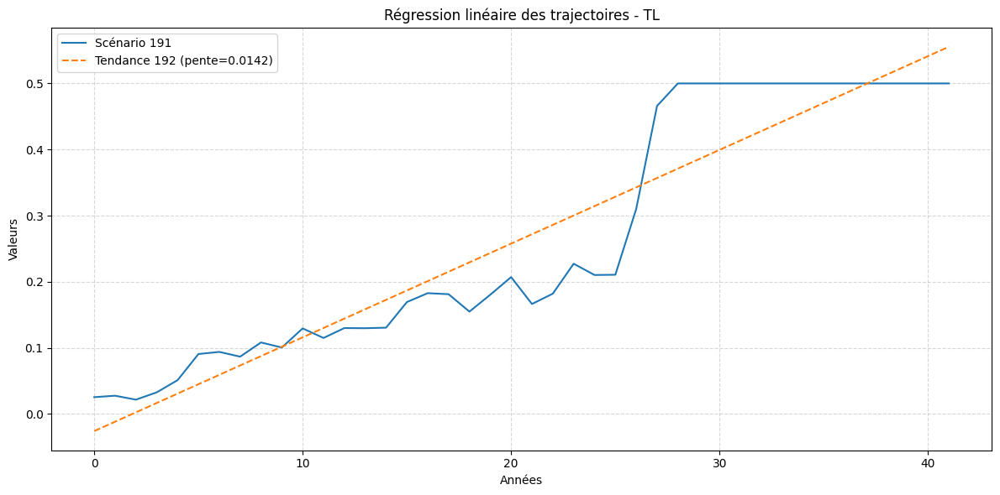

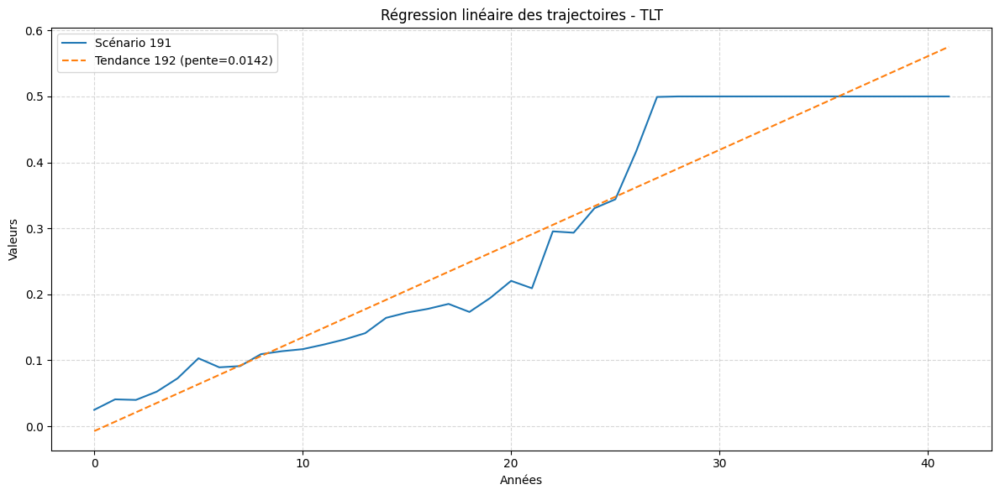

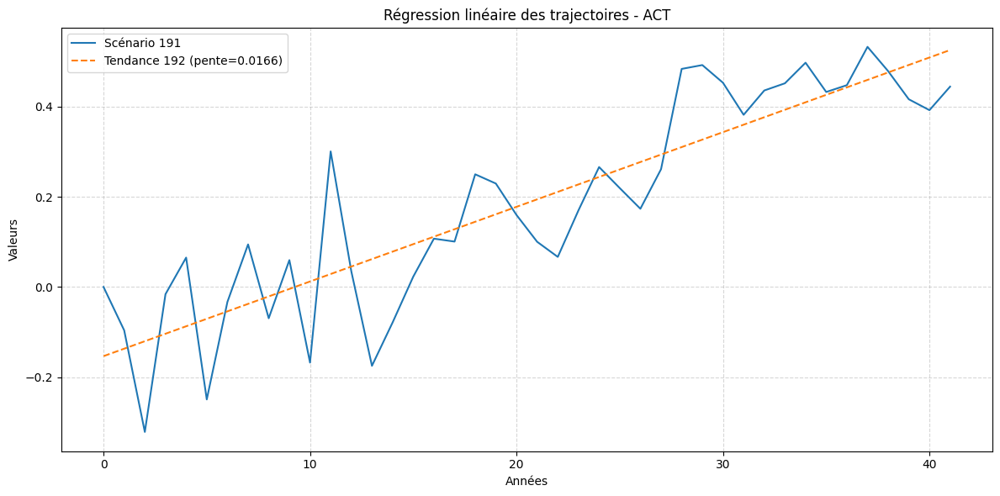

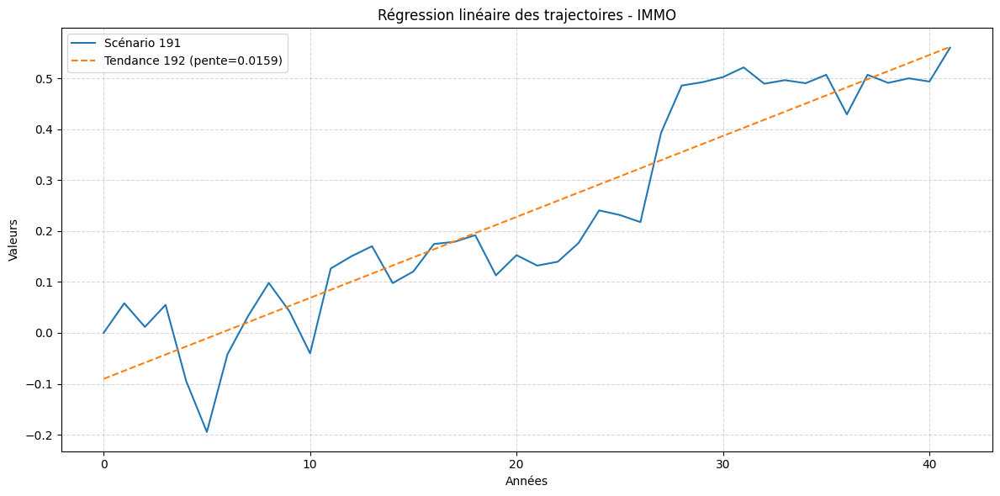

In [102]:
plot_trend_for_scenario(TL_matrix, "TL", scenario_id=191)
plot_trend_for_scenario(TLT_matrix, "TLT", scenario_id=191)
plot_trend_for_scenario(ACT_matrix, "ACT", scenario_id=191)
plot_trend_for_scenario(IMMO_matrix, "IMMO", scenario_id=191)

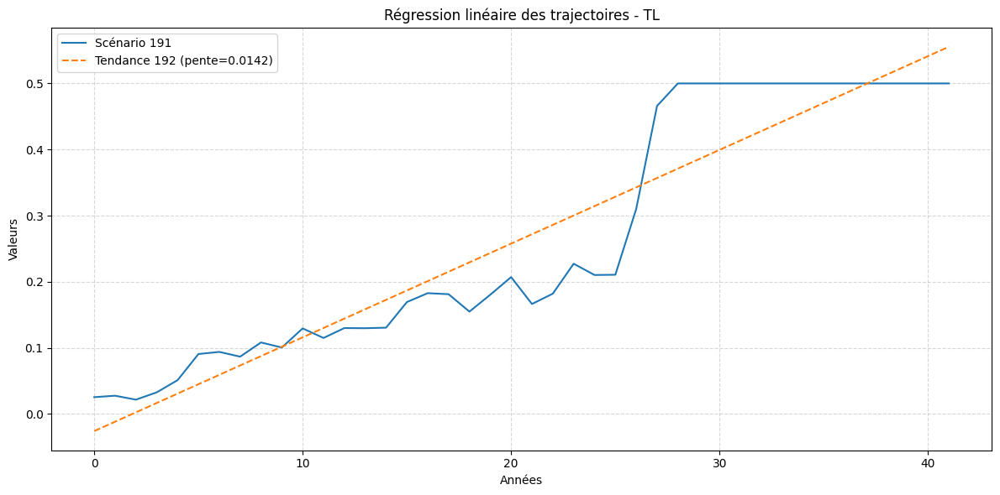

In [103]:
plot_trend_for_scenario(TL_matrix, "TL", scenario_id=191)

Concatenation de X_reduced et X_redueced1 à partir de réduction dim statistiques

In [104]:
X_reduced2 = np.hstack([TL_reduced,
                       TLT_reduced,
                       ACT_reduced,
                       IMMO_reduced])

X = np.hstack([X_reduced1, X_reduced2])
y = pvfp_array

In [105]:

# Transformer X_reduced en DataFrame
X_df = pd.DataFrame(X)

print("Premières lignes :\n", X_df.head())

# Exporter vers Excel
filename = "X_reduced_V2.xlsx"
X_df.to_excel(filename, index=False)

print(f"Fichier Excel '{filename}' créé avec succès.")

from google.colab import files
# files.download("matrices_reduites.xlsx")
files.download("X_reduced_V2.xlsx")

Premières lignes :
          0         1         2         3         4         5         6   \
0  0.017760  0.000124 -0.005236  0.045540 -0.000257  0.019426  0.000071   
1  0.062059  0.002097  0.003989  0.194211  0.003179  0.076143  0.003196   
2  0.006812  0.000106 -0.013469  0.025454 -0.000443  0.013510  0.000067   
3  0.088863  0.003641  0.024907  0.220722  0.004423  0.090969  0.003384   
4  0.037404  0.001187 -0.003903  0.126421  0.002316  0.049500  0.001761   

         7         8         9   ...        16        17        18        19  \
0  0.002801  0.035745 -0.000264  ...  0.001378 -0.094944  0.103403  0.000546   
1  0.018398  0.209410  0.004180  ...  0.003016 -0.055392  0.183499  0.002521   
2 -0.002692  0.026051 -0.000252  ...  0.004913 -0.116127  0.309194 -0.001957   
3  0.024878  0.186286  0.004524  ...  0.009098 -0.208988  0.229214  0.005873   
4  0.005653  0.144299  0.003080  ...  0.002350 -0.063970  0.134844  0.002360   

         20   21        22   23        24       

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [106]:
cols1 = columns_reduced1

# Colonnes explicites pour X_reduced2 (à définir selon ta logique)
cols2 = [
    "TL_reduced", "TL_reduced_vitesse",
    "TLT_reduced", "TLT_reduced_vitesse",
    "ACT_reduced",
    "IMMO_reduced"
]

# --- Concaténer ---
X = np.hstack([X_reduced1, X_reduced2])
all_columns = cols1 + cols2   # fusion des noms de colonnes

# --- Transformer en DataFrame avec headers ---
X_df = pd.DataFrame(X, columns=all_columns)

print("Shape :", X_df.shape)
print("Premières lignes :\n", X_df.head())

# --- Exporter vers Excel ---
filename = "X_reduced_V2.xlsx"
X_df.to_excel(filename, index=False)
print(f"Fichier Excel '{filename}' créé avec succès.")

try:
    files.download(filename)
except:
    print("Téléchargement automatique non disponible en dehors de Google Colab.")

Shape : (1000, 26)
Premières lignes :
     TL_mean    TL_var    TL_min    TL_max  TL_trend  TLT_mean   TLT_var  \
0  0.017760  0.000124 -0.005236  0.045540 -0.000257  0.019426  0.000071   
1  0.062059  0.002097  0.003989  0.194211  0.003179  0.076143  0.003196   
2  0.006812  0.000106 -0.013469  0.025454 -0.000443  0.013510  0.000067   
3  0.088863  0.003641  0.024907  0.220722  0.004423  0.090969  0.003384   
4  0.037404  0.001187 -0.003903  0.126421  0.002316  0.049500  0.001761   

    TLT_min   TLT_max  TLT_trend  ...  IMMO_var  IMMO_min  IMMO_max  \
0  0.002801  0.035745  -0.000264  ...  0.001378 -0.094944  0.103403   
1  0.018398  0.209410   0.004180  ...  0.003016 -0.055392  0.183499   
2 -0.002692  0.026051  -0.000252  ...  0.004913 -0.116127  0.309194   
3  0.024878  0.186286   0.004524  ...  0.009098 -0.208988  0.229214   
4  0.005653  0.144299   0.003080  ...  0.002350 -0.063970  0.134844   

   IMMO_trend  TL_reduced  TL_reduced_vitesse  TLT_reduced  \
0    0.000546    0.07

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Compar regression PCR & PLS (plus pour finance)

In [107]:
def compare_pcr_pls_with_metrics(X, y, max_components=40, test_size=0.2, random_state=42):
    """
    Compare PCR et PLS avec sélection automatique du nombre optimal de composantes,
    visualisation des résidus et calcul des métriques (RMSE, MAE).
    """

    # --- Standardisation ---
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # --- Split train/test ---
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=test_size, random_state=random_state)

    # --- PCR ---
    pcr_scores = []
    for n in range(1, max_components+1):
        pca = PCA(n_components=n)
        X_train_pca = pca.fit_transform(X_train)
        model = LinearRegression()
        scores = cross_val_score(model, X_train_pca, y_train, cv=5, scoring='r2')
        pcr_scores.append(np.mean(scores))
    best_pcr_n = np.argmax(pcr_scores) + 1
    best_pcr_score = np.max(pcr_scores)

    # Entraînement final PCR
    pca_final = PCA(n_components=best_pcr_n)
    X_train_pca_final = pca_final.fit_transform(X_train)
    X_test_pca_final = pca_final.transform(X_test)
    pcr_model = LinearRegression().fit(X_train_pca_final, y_train)
    y_pred_pcr = pcr_model.predict(X_test_pca_final)

    # --- PLS ---
    pls_scores = []
    for n in range(1, max_components+1):
        pls = PLSRegression(n_components=n)
        scores = cross_val_score(pls, X_train, y_train, cv=5, scoring='r2')
        pls_scores.append(np.mean(scores))
    best_pls_n = np.argmax(pls_scores) + 1
    best_pls_score = np.max(pls_scores)

    # Entraînement final PLS
    pls_final = PLSRegression(n_components=best_pls_n)
    pls_model = pls_final.fit(X_train, y_train)
    y_pred_pls = pls_model.predict(X_test).ravel()

    # --- Résultats ---
    print("=== Résultats comparatifs ===")
    print(f"PCR : {best_pcr_n} composantes, R² moyen CV = {best_pcr_score:.3f}")
    print(f"PLS : {best_pls_n} composantes, R² moyen CV = {best_pls_score:.3f}")

    # --- Métriques ---
    rmse_pcr = np.sqrt(mean_squared_error(y_test, y_pred_pcr))
    mae_pcr = mean_absolute_error(y_test, y_pred_pcr)
    r2_pcr = r2_score(y_test, y_pred_pcr)

    rmse_pls = np.sqrt(mean_squared_error(y_test, y_pred_pls))
    mae_pls = mean_absolute_error(y_test, y_pred_pls)
    r2_pls = r2_score(y_test, y_pred_pls)

    print("\n=== Métriques sur jeu de test ===")
    print(f"PCR : RMSE = {rmse_pcr:.3f}, MAE = {mae_pcr:.3f}, R² = {r2_pcr:.3f}")
    print(f"PLS : RMSE = {rmse_pls:.3f}, MAE = {mae_pls:.3f}, R² = {r2_pls:.3f}")

    # --- Visualisation des scores ---
    plt.figure(figsize=(10,6))
    plt.plot(range(1, max_components+1), pcr_scores, marker='o', label="PCR")
    plt.plot(range(1, max_components+1), pls_scores, marker='s', label="PLS")

    # Ajouter les valeurs R² au-dessus des points
    for i, score in enumerate(pcr_scores, start=1):
        plt.text(i, score+0.01, f"{score:.2f}", ha='center', color='blue', fontsize=8)
    for i, score in enumerate(pls_scores, start=1):
        plt.text(i, score-0.05, f"{score:.2f}", ha='center', color='red', fontsize=8)

    plt.axvline(best_pcr_n, color='blue', linestyle='--', alpha=0.6, label=f"PCR optimal = {best_pcr_n}")
    plt.axvline(best_pls_n, color='red', linestyle='--', alpha=0.6, label=f"PLS optimal = {best_pls_n}")
    plt.xlabel("Nombre de composantes")
    plt.ylabel("Score R² moyen (CV)")
    plt.title("Comparaison PCR vs PLS")
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

    # --- Visualisation des prédictions ---
    plt.figure(figsize=(12,5))

    # PCR
    plt.subplot(1,2,1)
    plt.scatter(y_test, y_pred_pcr, color='blue', alpha=0.7)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--')
    plt.xlabel("Valeurs réelles")
    plt.ylabel("Valeurs prédites")
    plt.title(f"PCR ({best_pcr_n} comp.) - RMSE={rmse_pcr:.2f}, MAE={mae_pcr:.2f}, R²={r2_pcr:.2f}")

    # PLS
    plt.subplot(1,2,2)
    plt.scatter(y_test, y_pred_pls, color='red', alpha=0.7)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--')
    plt.xlabel("Valeurs réelles")
    plt.ylabel("Valeurs prédites")
    plt.title(f"PLS ({best_pls_n} comp.) - RMSE={rmse_pls:.2f}, MAE={mae_pls:.2f}, R²={r2_pls:.2f}")

    plt.tight_layout()
    plt.show()

    return {
        "PCR": {"model": pcr_model, "pca": pca_final, "n_components": best_pcr_n,
                "cv_score": best_pcr_score, "rmse": rmse_pcr, "mae": mae_pcr, "r2": r2_pcr},
        "PLS": {"model": pls_model, "n_components": best_pls_n,
                "cv_score": best_pls_score, "rmse": rmse_pls, "mae": mae_pls, "r2": r2_pls}
    }

=== Résultats comparatifs ===
PCR : 19 composantes, R² moyen CV = 0.762
PLS : 10 composantes, R² moyen CV = 0.765

=== Métriques sur jeu de test ===
PCR : RMSE = 143516.591, MAE = 105001.427, R² = 0.796
PLS : RMSE = 138021.949, MAE = 99943.922, R² = 0.811


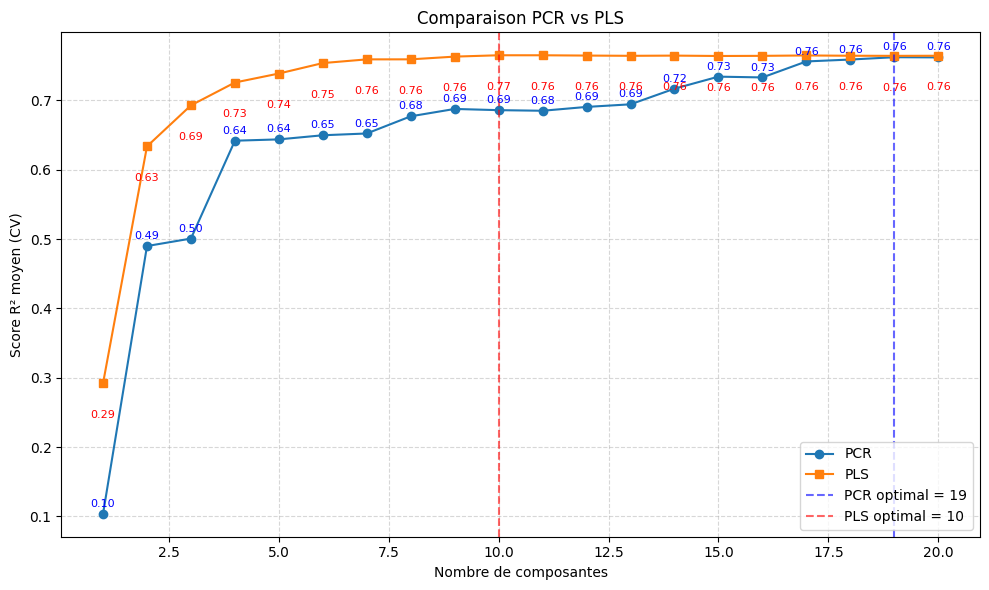

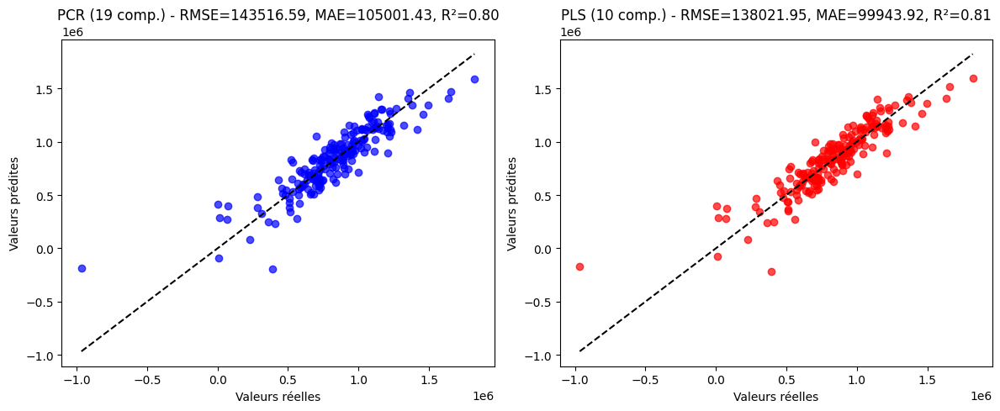

In [108]:
# Exemple d’utilisation :
results = compare_pcr_pls_with_metrics(X, y, max_components=20)

Regression PLS avec étude de importance

In [109]:
def pls_regression_with_importance(X, y, max_components=20, test_size=0.2, random_state=42, feature_names=None):
    """
    Réalise une régression PLS avec sélection du nombre optimal de composantes
    et analyse d’importance des variables (coefficients + SHAP).
    """

    # --- Standardisation ---
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # --- Split train/test ---
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=test_size, random_state=random_state)

    # --- Sélection du nombre optimal de composantes ---
    pls_scores = []
    for n in range(1, max_components+1):
        pls = PLSRegression(n_components=n)
        scores = cross_val_score(pls, X_train, y_train, cv=5, scoring='r2')
        pls_scores.append(np.mean(scores))
    best_n = np.argmax(pls_scores) + 1
    best_score = np.max(pls_scores)

    print(f"Nombre optimal de composantes : {best_n}")
    print(f"Score R² moyen en CV : {best_score:.3f}")

    # --- Entraînement final ---
    pls_final = PLSRegression(n_components=best_n)
    pls_final.fit(X_train, y_train)
    y_pred = pls_final.predict(X_test).ravel()

    # --- Métriques ---
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    print(f"RMSE = {rmse:.3f}, MAE = {mae:.3f}")

    # --- Importance via coefficients ---
    coefs = pls_final.coef_.ravel()

    # Définir noms des variables
    if feature_names is not None and len(feature_names) == len(coefs):
        labels = feature_names
    else:
        labels = [f"Var{i}" for i in range(len(coefs))]

    # Trier par valeur absolue des coefficients
    sorted_idx = np.argsort(np.abs(coefs))[::-1]  # tri décroissant
    coefs_sorted = coefs[sorted_idx]
    labels_sorted = [labels[i] for i in sorted_idx]

    # Fonction de formatage automatique k/M/G
    def format_large_number(value):
        if abs(value) >= 1e9:
            return f"{value/1e9:.2f}G"
        elif abs(value) >= 1e6:
            return f"{value/1e6:.2f}M"
        elif abs(value) >= 1e3:
            return f"{value/1e3:.2f}k"
        else:
            return f"{value:.2f}"

    # Graphique horizontal
    plt.figure(figsize=(12, 6))
    bars = plt.barh(range(len(coefs_sorted)), coefs_sorted, color="skyblue")

    # Ajouter les valeurs numériques formatées sur chaque barre
    for i, bar in enumerate(bars):
        plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2,
                 format_large_number(coefs_sorted[i]),
                 va='center', ha='left', fontsize=9)

    plt.yticks(range(len(coefs_sorted)), labels_sorted)
    plt.xlabel("Coefficient")
    plt.title("Importance des variables (coefficients PLS, triées par |valeur|)")
    plt.grid(axis='y', linestyle='--', alpha=0.7)  # ✅ grille verticale pour lecture facile
    plt.tight_layout()
    plt.show()

    # --- SHAP analysis ---
    explainer = shap.Explainer(pls_final.predict, X_train)
    shap_values = explainer(X_test)

    # Summary plot global
    shap.summary_plot(shap_values, X_test, feature_names=feature_names)

    return pls_final, best_n, best_score, rmse, mae

Nombre optimal de composantes : 10
Score R² moyen en CV : 0.765
RMSE = 138021.949, MAE = 99943.922


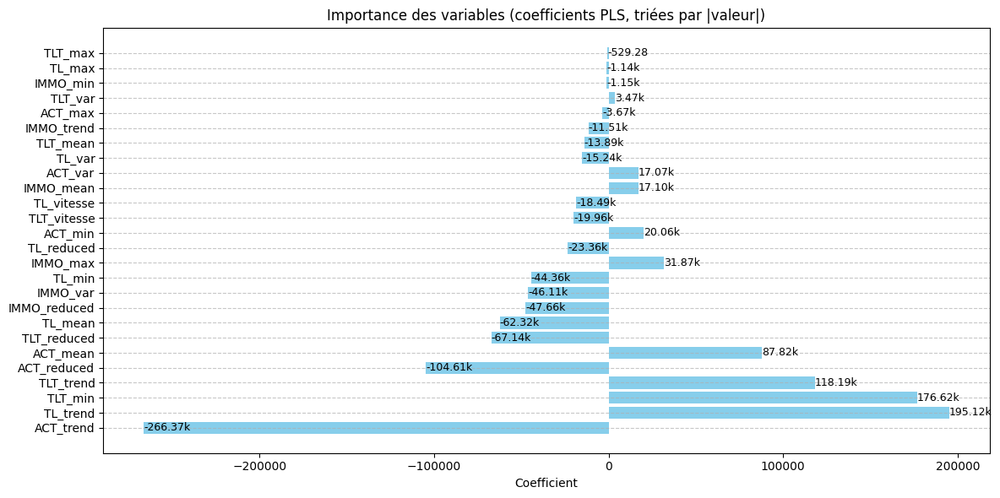

/tmp/ipython-input-2613666811.py:83: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_test, feature_names=feature_names)


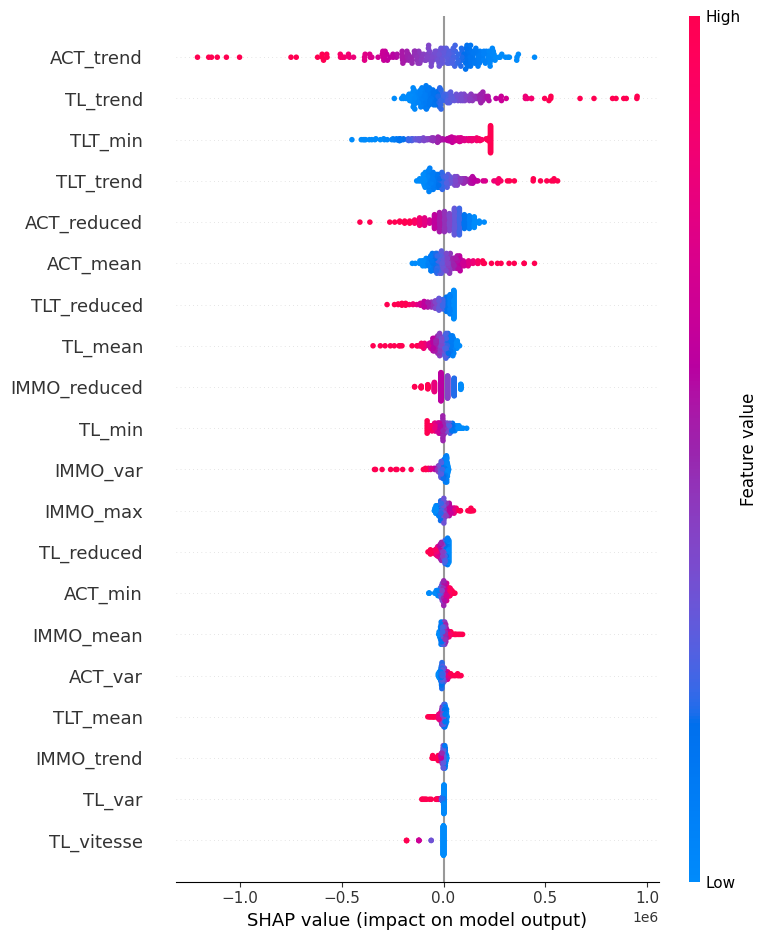

In [110]:
# Exemple avec tes données
X = np.hstack([X_reduced, X_reduced1])
y = pvfp_array.ravel()   # s'assurer que y est 1D

# Si tu as des noms de variables (par ex. TL_mean, ACT_trend, etc.)
feature_names = ["TL_reduced","TL_vitesse","TLT_reduced","TLT_vitesse","ACT_reduced","IMMO_reduced",
                 "TL_mean","TL_var","TL_min","TL_max","TL_trend",
                 "TLT_mean","TLT_var","TLT_min","TLT_max","TLT_trend",
                 "ACT_mean","ACT_var","ACT_min","ACT_max","ACT_trend",
                 "IMMO_mean","IMMO_var","IMMO_min","IMMO_max","IMMO_trend",
                 # + noms de X_reduced1 si tu en as
                ]

pls_model, best_n, best_score, rmse, mae = pls_regression_with_importance(X, y, max_components=20,test_size=0.2, feature_names=feature_names)

#7.1 - Etude de la formule PLS

In [111]:
# Exemple avec tes données
X_reduced2 = np.hstack([TL_reduced,
                       TLT_reduced,
                       ACT_reduced,
                       IMMO_reduced])

X = np.hstack([X_reduced2, X_reduced1])
print("X.shape", X.shape)

y = pvfp_array
# Si tu as des noms de variables (par ex. TL_mean, ACT_trend, etc.)
feature_names = ["TL_reduced","TL_vitesse","TLT_reduced","TLT_vitesse","ACT_reduced","IMMO_reduced",
                 "TL_mean","TL_var","TL_min","TL_max","TL_trend",
                 "TLT_mean","TLT_var","TLT_min","TLT_max","TLT_trend",
                 "ACT_mean","ACT_var","ACT_min","ACT_max","ACT_trend",
                 "IMMO_mean","IMMO_var","IMMO_min","IMMO_max","IMMO_trend",
                 # + noms de X_reduced1 si tu en as
                ]



X.shape (1000, 26)


update regression PLS avec coeff & formule

In [112]:
def pls_regression_analysis(X, y, n_components=5, feature_names=None, outlier_threshold=2.0, scenario_ids=None):
    # --- Standardisation ---
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # --- Régression PLS ---
    pls = PLSRegression(n_components=n_components)
    pls.fit(X_scaled, y)
    y_pred = pls.predict(X_scaled).ravel()

    # --- Qualité de la régression ---
    r2 = r2_score(y, y_pred)
    print(f"\nR² global = {r2:.3f}")

    # --- Détection des outliers ---
    residuals = y - y_pred
    std_res = np.std(residuals)
    outliers = np.where(np.abs(residuals) > outlier_threshold * std_res)[0]

    if scenario_ids is None:
        scenario_ids = np.arange(len(y))
    outlier_scenarios = scenario_ids[outliers]

    print(f"Nombre d'outliers détectés (>{outlier_threshold}σ) : {len(outliers)}")
    print("Scénarios outliers :", outlier_scenarios)

    # --- Plot prédictions vs réelles ---
    plt.figure(figsize=(8,6))
    plt.scatter(y, y_pred, alpha=0.7, label="Points")
    plt.scatter(y[outliers], y_pred[outliers], color="red", label="Outliers", marker="x")
    plt.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', label="Idéal")
    plt.xlabel("Valeurs réelles")
    plt.ylabel("Valeurs prédites")
    plt.title(f"Régression PLS ({n_components} composantes) - R²={r2:.3f}")
    plt.legend()
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.tight_layout()
    plt.show()

    # --- Formule explicite de la prédiction ---
    coefs = pls.coef_.ravel()
    intercept = pls.intercept_[0]

    if feature_names is not None and len(feature_names) == len(coefs):
        labels = feature_names
    else:
        labels = [f"Var{i}" for i in range(len(coefs))]

    formule = "y_pred = " + " + ".join([f"{coef:.3f}*{name}" for coef, name in zip(coefs, labels)]) + f" + {intercept:.3f}"
    print("\nFormule de prédiction PLS :")
    print(formule)

    return pls, y_pred, r2, outliers, outlier_scenarios, coefs, intercept


R² global = 0.783
Nombre d'outliers détectés (>2.0σ) : 41
Scénarios outliers : [ 14  29  30  35  78 130 133 184 191 213 220 247 297 363 370 373 393 491
 532 544 555 582 652 675 705 706 713 732 766 826 840 865 895 897 906 957
 967 968 969 991 997]


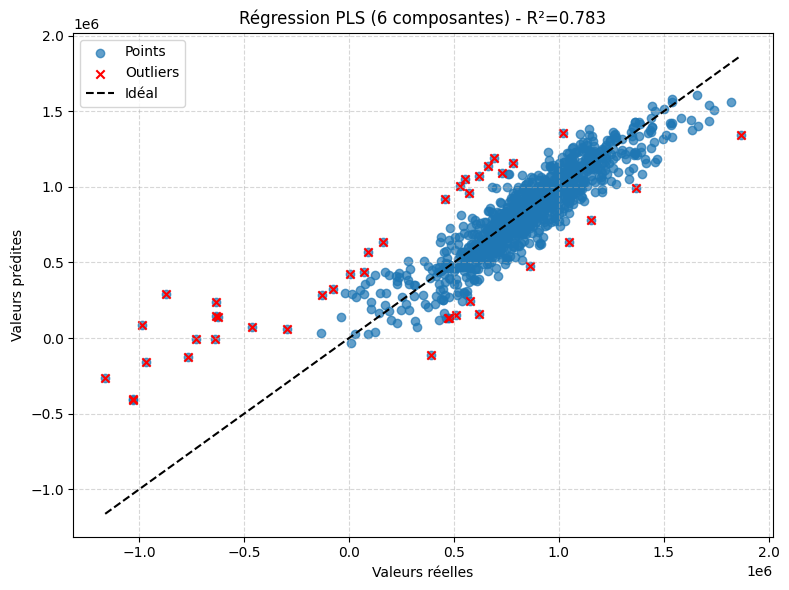


Formule de prédiction PLS :
y_pred = -32745.141*TL_reduced + -45345.843*TL_vitesse + -55402.309*TLT_reduced + -36274.190*TLT_vitesse + -112014.851*ACT_reduced + -42096.678*IMMO_reduced + -52201.555*TL_mean + -5225.452*TL_var + -17649.719*TL_min + 28015.134*TL_max + 114140.148*TL_trend + -21867.230*TLT_mean + 19629.619*TLT_var + 142527.115*TLT_min + 34916.116*TLT_max + 95879.545*TLT_trend + 106892.707*ACT_mean + 29366.552*ACT_var + 21691.231*ACT_min + -10809.230*ACT_max + -244826.355*ACT_trend + -22636.597*IMMO_mean + -28717.696*IMMO_var + 11584.205*IMMO_min + 30836.492*IMMO_max + 11032.692*IMMO_trend + 818580.508


In [113]:
pls_model, y_pred, r2, outliers, outlier_scenarios, coefs, intercept = pls_regression_analysis(
    X, y, n_components=6, feature_names=feature_names, scenario_ids=np.arange(1, len(y)+1)
)

Trouver les meuilleurs NB de component PLS

Nombre optimal de composantes : 20
R² maximal obtenu : 0.796


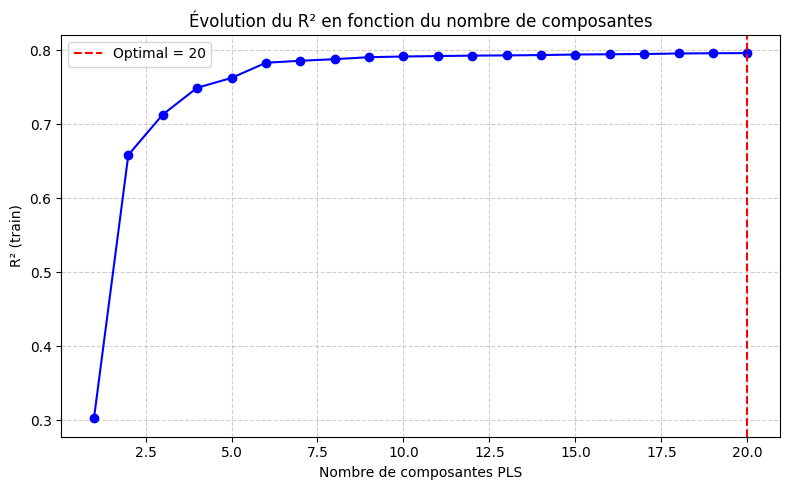

In [114]:
def find_best_pls_components(X, y, max_components=20):
    """
    Boucle sur le nombre de composantes PLS pour trouver le R² maximal.
    Retourne le nombre optimal et le score associé.
    """

    # Standardisation
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    r2_scores = []
    for n in range(1, max_components+1):
        pls = PLSRegression(n_components=n)
        pls.fit(X_scaled, y)
        y_pred = pls.predict(X_scaled).ravel()
        r2_scores.append(r2_score(y, y_pred))

    # Trouver le meilleur
    best_n = np.argmax(r2_scores) + 1
    best_r2 = np.max(r2_scores)

    print(f"Nombre optimal de composantes : {best_n}")
    print(f"R² maximal obtenu : {best_r2:.3f}")

    # Tracer l’évolution du R²
    plt.figure(figsize=(8,5))
    plt.plot(range(1, max_components+1), r2_scores, marker='o', color="blue")
    plt.axvline(best_n, color="red", linestyle="--", label=f"Optimal = {best_n}")
    plt.xlabel("Nombre de composantes PLS")
    plt.ylabel("R² (train)")
    plt.title("Évolution du R² en fonction du nombre de composantes")
    plt.legend()
    plt.grid(True, linestyle="--", alpha=0.6)
    plt.tight_layout()
    plt.show()

    return best_n, best_r2, r2_scores

    # Recherche du nombre optimal
best_n, best_r2, r2_scores = find_best_pls_components(X, y, max_components=20)

Scénario de outliers

In [115]:
def plot_X_for_one_scenario(X, feature_names, scenario_id, scenario_ids=None, standardized=False):

    if scenario_ids is None:
        scenario_ids = np.arange(len(X))

    # Créer DataFrame
    df = pd.DataFrame(X, columns=feature_names)
    df["Scenario_ID"] = scenario_ids

    # Extraire le scénario demandé
    df_scenario = df[df["Scenario_ID"] == scenario_id]

    if df_scenario.empty:
        print(f"⚠️ Scénario {scenario_id} introuvable.")
        return None

    # Tracer les valeurs
    plt.figure(figsize=(12,6))
    plt.plot(feature_names, df_scenario.iloc[0][feature_names], marker="o", color="blue")
    plt.xticks(rotation=90)
    plt.xlabel("Variables explicatives")
    plt.ylabel("Valeurs" + (" (standardisées)" if standardized else ""))
    plt.title(f"Profil des variables X pour le scénario {scenario_id}")
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.tight_layout()
    plt.show()

    return df_scenario

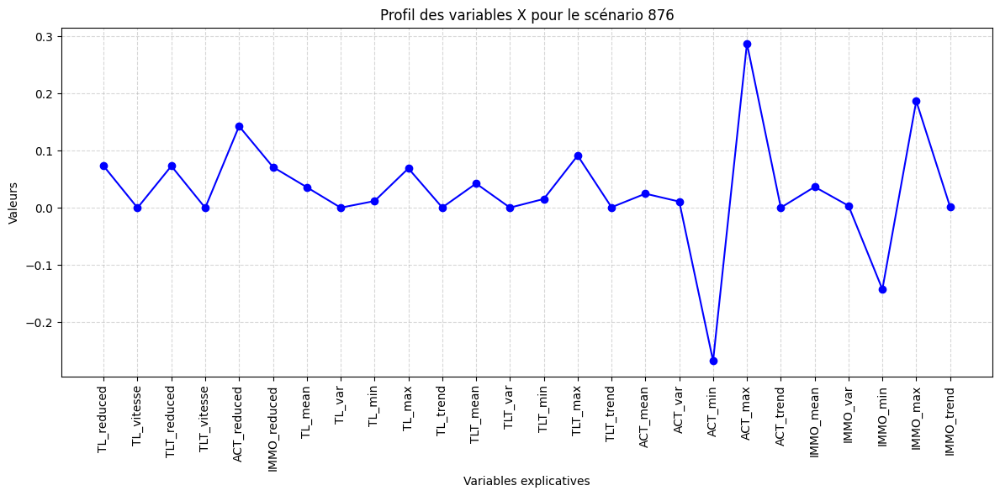

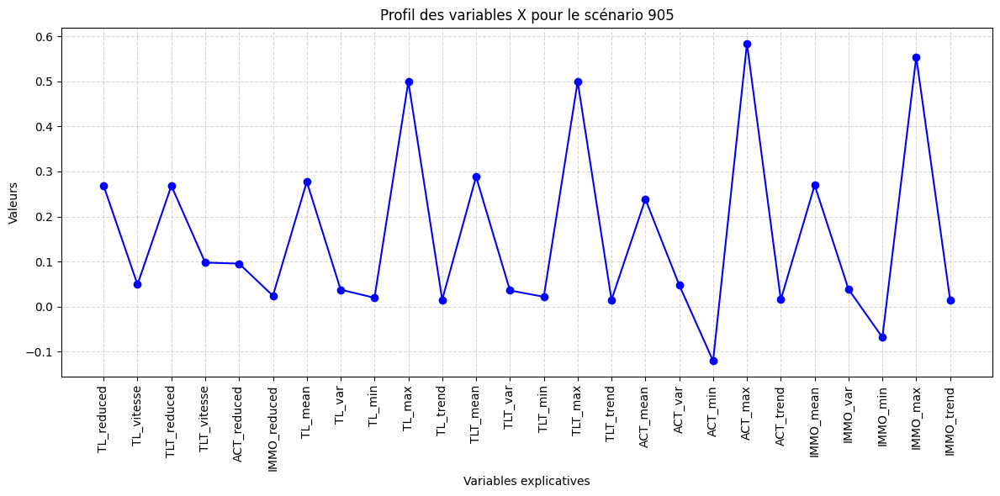

In [116]:
# Supposons que scenario_ids = [1,2,3,...]
df_scenario = plot_X_for_one_scenario(X, feature_names, scenario_id=876, scenario_ids=np.arange(1, len(y)+1), standardized=False)

df_scenario = plot_X_for_one_scenario(X, feature_names, scenario_id=905, scenario_ids=np.arange(1, len(y)+1), standardized=False)



# Section 7.1.2 - étude outliers

In [117]:
from scipy.spatial.distance import mahalanobis

def analyze_outliers(X, y, y_pred, outlier_indices, feature_names, scenario_ids=None):
    """
    Analyse détaillée des outliers détectés dans une régression PLS.

    Étapes :
    1. Distribution des résidus
    2. Profil des variables explicatives pour chaque outlier
    3. Distance de Mahalanobis
    4. Influence sur le modèle (Cook's distance simplifiée)
    """

    if scenario_ids is None:
        scenario_ids = np.arange(len(y))

    # --- 1. Distribution des résidus ---
    residuals = y - y_pred
    plt.figure(figsize=(8,5))
    plt.hist(residuals, bins=30, color="skyblue", edgecolor="black")
    plt.axvline(0, color="red", linestyle="--")
    plt.title("Distribution des résidus")
    plt.xlabel("Résidu (y - y_pred)")
    plt.ylabel("Fréquence")
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.show()

    # --- 2. Profil des variables explicatives pour chaque outlier ---
    df = pd.DataFrame(X, columns=feature_names)
    df["Scenario_ID"] = scenario_ids
    df_outliers = df.iloc[outlier_indices]

    plt.figure(figsize=(12,6))
    for _, row in df_outliers.iterrows():
        plt.plot(feature_names, row[feature_names], marker="o", label=f"Scénario {row['Scenario_ID']}")
    plt.xticks(rotation=90)
    plt.title("Profil des variables explicatives pour les outliers")
    plt.xlabel("Variables")
    plt.ylabel("Valeurs")
    plt.legend()
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.tight_layout()
    plt.show()

    # --- 3. Distance de Mahalanobis ---
    cov_matrix = np.cov(X.T)
    inv_cov = np.linalg.inv(cov_matrix)
    mean_vec = np.mean(X, axis=0)

    mahal_distances = [mahalanobis(x, mean_vec, inv_cov) for x in X]
    df["Mahalanobis"] = mahal_distances

    plt.figure(figsize=(8,5))
    plt.scatter(range(len(mahal_distances)), mahal_distances, alpha=0.7)
    plt.scatter(outlier_indices, np.array(mahal_distances)[outlier_indices], color="red", label="Outliers")
    plt.title("Distance de Mahalanobis (mesure d'atypicité multivariée)")
    plt.xlabel("Index scénario")
    plt.ylabel("Distance")
    plt.legend()
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.show()

    # --- 4. Influence sur le modèle (approximation Cook's distance) ---
    # Cook's distance ~ résidu^2 / (p * MSE)
    p = X.shape[1]
    mse = np.mean(residuals**2)
    cooks_distance = (residuals**2) / (p * mse)
    df["Cook_Distance"] = cooks_distance

    plt.figure(figsize=(8,5))
    plt.scatter(range(len(cooks_distance)), cooks_distance, alpha=0.7)
    plt.scatter(outlier_indices, np.array(cooks_distance)[outlier_indices], color="red", label="Outliers")
    plt.title("Approximation Cook's Distance (influence sur le modèle)")
    plt.xlabel("Index scénario")
    plt.ylabel("Cook's distance")
    plt.legend()
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.show()

    return df, df_outliers


R² global = 0.796
Nombre d'outliers détectés (>2.0σ) : 41
Scénarios outliers : [ 14  29  30  78  99 130 133 184 191 213 220 244 247 264 297 363 370 373
 491 532 544 555 582 652 705 706 713 732 766 826 840 864 865 895 897 906
 957 967 968 969 991]


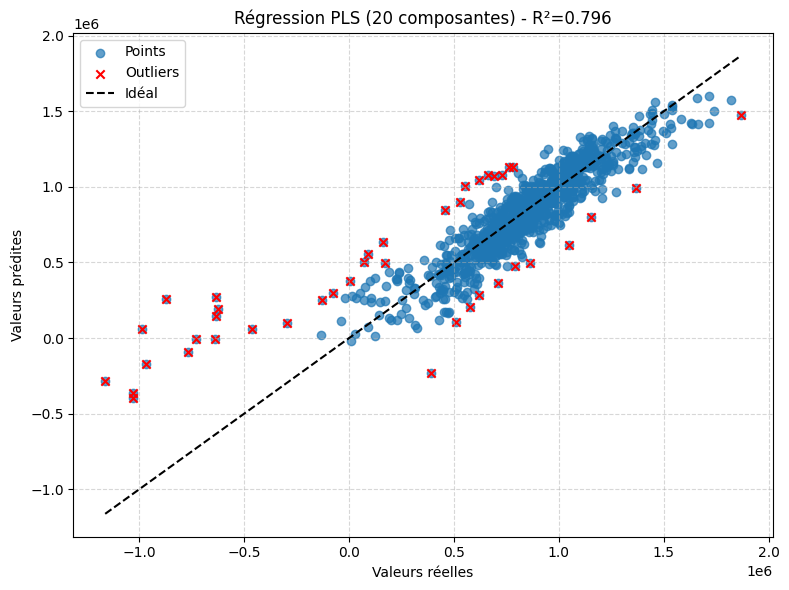


Formule de prédiction PLS :
y_pred = -27922.500*TL_reduced + -19921.349*TL_vitesse + -54253.828*TLT_reduced + -16600.072*TLT_vitesse + -105442.564*ACT_reduced + -29415.365*IMMO_reduced + -183651.896*TL_mean + -176578.246*TL_var + -26046.477*TL_min + 46787.227*TL_max + 427206.619*TL_trend + 132115.504*TLT_mean + 166760.144*TLT_var + 162424.355*TLT_min + -40862.709*TLT_max + -91427.804*TLT_trend + 100954.341*ACT_mean + 30484.344*ACT_var + 23700.694*ACT_min + -15280.364*ACT_max + -257871.351*ACT_trend + -2579.464*IMMO_mean + -47595.921*IMMO_var + 2213.400*IMMO_min + 26107.784*IMMO_max + -83716.285*IMMO_trend + 818580.508


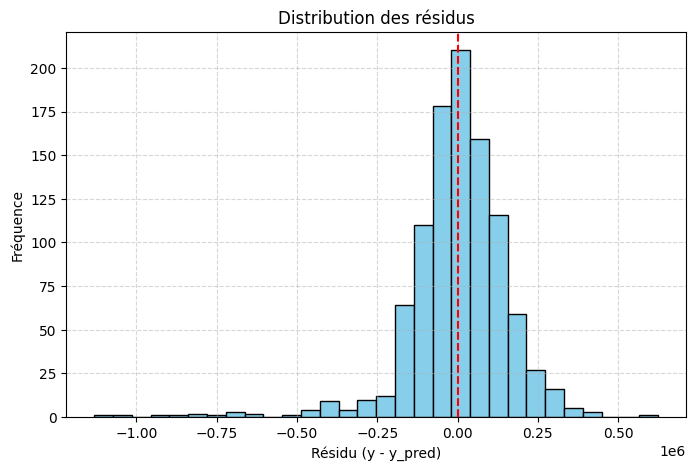

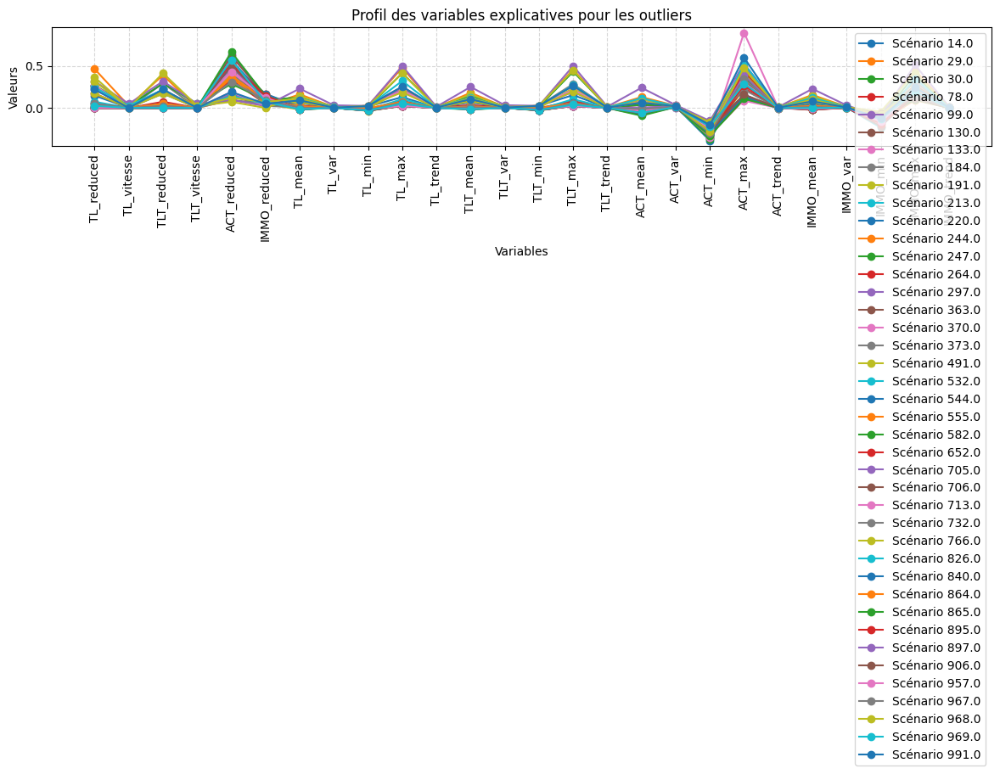

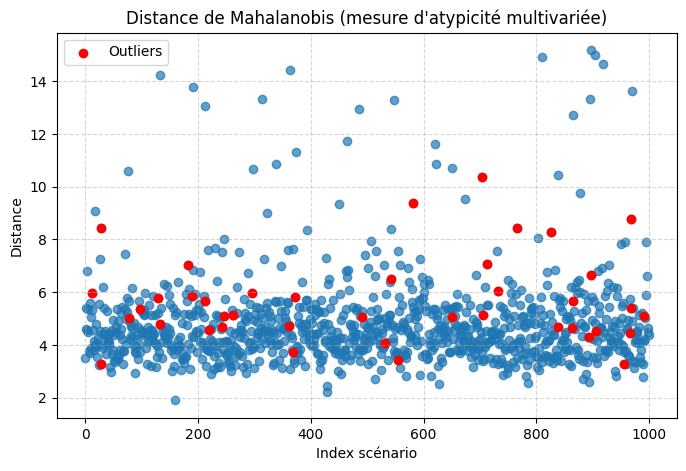

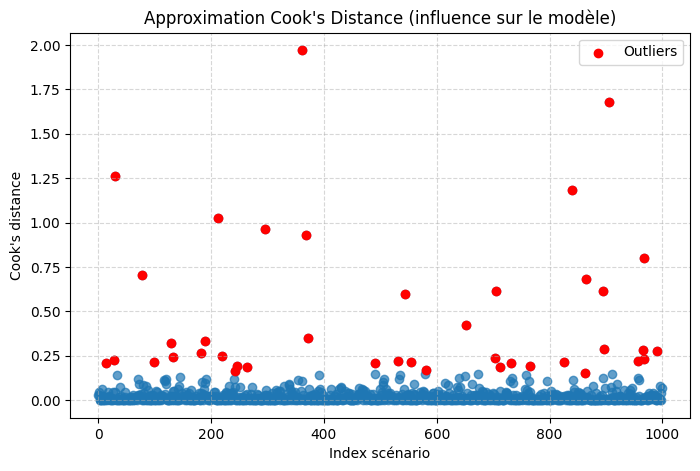

In [118]:
# Après ta fonction pls_regression_analysis
pls, y_pred, r2, outliers, outlier_scenarios, coefs, intercept = pls_regression_analysis(
    X, y, n_components=20, feature_names=feature_names, scenario_ids=np.arange(1, len(y)+1)
)

# Analyse des outliers
df_all, df_outliers = analyze_outliers(X, y, y_pred, outliers, feature_names, scenario_ids=np.arange(1, len(y)+1))

In [119]:
from google.colab import files

def compute_mahalanobis_distances(X):
    """
    Distance de Mahalanobis par rapport à la moyenne de X.
    Utilise la pseudo-inverse pour robustesse (covariance potentiellement singulière).
    """
    mean_vec = np.mean(X, axis=0)
    cov = np.cov(X.T)
    inv_cov = np.linalg.pinv(cov)
    diffs = X - mean_vec
    # d_M(x) = sqrt( (x-μ)^T Σ^{-1} (x-μ) )
    d = np.sqrt(np.einsum('ij,jk,ik->i', diffs, inv_cov, diffs))
    return d

def export_outlier_analysis_excel(
    pls,
    X,
    y,
    y_pred,
    outlier_indices,
    feature_names,
    scenario_ids=None,
    scaler=None,
    filename="outlier_analysis.xlsx"
):
    """
    Exporte un fichier Excel multi-onglets:
    1) X standardisé + y réel + y_pred + résidu
    2) X brut
    3) Outliers (profils X + métriques)
    4) Métriques globales (résidus, Mahalanobis, Cook)
    """

    n_samples = X.shape[0]
    if scenario_ids is None:
        scenario_ids = np.arange(n_samples)

    # X standardisé si scaler est fourni
    if scaler is not None:
        X_scaled = scaler.transform(X)
    else:
        X_scaled = X  # si pas de scaler, on place X brut (et on l'indique)

    # Résidus
    residuals = y - y_pred
    p = X.shape[1]
    mse = np.mean(residuals**2)
    cooks_distance = (residuals**2) / (p * mse)

    # Mahalanobis (sur X brut)
    mahal_dist = compute_mahalanobis_distances(X)

    # Feuille 1: X standardisé + y réel + y_pred + résidu
    df_scaled = pd.DataFrame(X_scaled, columns=feature_names)
    df_scaled.insert(0, "Scenario_ID", scenario_ids)
    df_scaled["Y_real"] = y
    df_scaled["Y_predicted"] = y_pred
    df_scaled["Residual"] = residuals
    df_scaled["Cook_Distance"] = cooks_distance
    df_scaled["Mahalanobis"] = mahal_dist
    df_scaled_meta_note = "Note: Si aucun scaler n'est fourni, X_standardisé contient X brut."

    # Feuille 2: X brut
    df_raw = pd.DataFrame(X, columns=feature_names)
    df_raw.insert(0, "Scenario_ID", scenario_ids)

    # Feuille 3: Outliers uniquement
    df_outliers = df_scaled.iloc[outlier_indices].copy()

    # Feuille 4: Métriques globales (vue compacte)
    df_metrics = pd.DataFrame({
        "Scenario_ID": scenario_ids,
        "Y_real": y,
        "Y_predicted": y_pred,
        "Residual": residuals,
        "Cook_Distance": cooks_distance,
        "Mahalanobis": mahal_dist
    })

    # Export Excel multi-onglets (openpyxl)
    with pd.ExcelWriter(filename, engine="openpyxl") as writer:
        df_scaled.to_excel(writer, sheet_name="X_standardisé", index=False)
        # Ajouter une petite note dans une seconde feuille méta si besoin
        pd.DataFrame({"Meta": [df_scaled_meta_note]}).to_excel(writer, sheet_name="Meta", index=False)
        df_raw.to_excel(writer, sheet_name="X_brut", index=False)
        df_outliers.to_excel(writer, sheet_name="Outliers", index=False)
        df_metrics.to_excel(writer, sheet_name="Métriques_globales", index=False)

    files.download(filename)

    return {
        "X_standardisé": df_scaled,
        "X_brut": df_raw,
        "Outliers": df_outliers,
        "Métriques_globales": df_metrics
    }


R² global = 0.796
Nombre d'outliers détectés (>2.0σ) : 41
Scénarios outliers : [ 14  29  30  78  99 130 133 184 191 213 220 244 247 264 297 363 370 373
 491 532 544 555 582 652 705 706 713 732 766 826 840 864 865 895 897 906
 957 967 968 969 991]


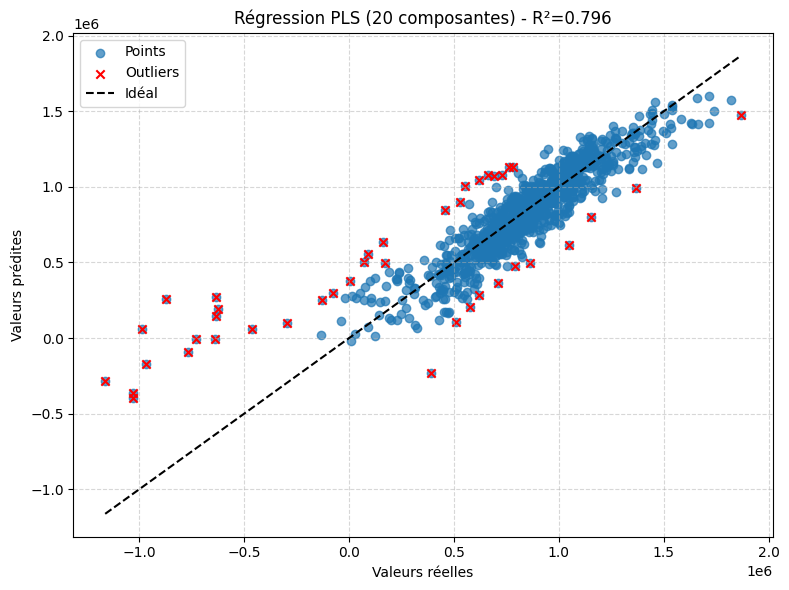


Formule de prédiction PLS :
y_pred = -27922.500*TL_reduced + -19921.349*TL_vitesse + -54253.828*TLT_reduced + -16600.072*TLT_vitesse + -105442.564*ACT_reduced + -29415.365*IMMO_reduced + -183651.896*TL_mean + -176578.246*TL_var + -26046.477*TL_min + 46787.227*TL_max + 427206.619*TL_trend + 132115.504*TLT_mean + 166760.144*TLT_var + 162424.355*TLT_min + -40862.709*TLT_max + -91427.804*TLT_trend + 100954.341*ACT_mean + 30484.344*ACT_var + 23700.694*ACT_min + -15280.364*ACT_max + -257871.351*ACT_trend + -2579.464*IMMO_mean + -47595.921*IMMO_var + 2213.400*IMMO_min + 26107.784*IMMO_max + -83716.285*IMMO_trend + 818580.508


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [120]:
# Après votre analyse PLS
pls, y_pred, r2, outliers, outlier_scenarios, coefs, intercept = pls_regression_analysis(
    X, y, n_components=20, feature_names=feature_names, scenario_ids=np.arange(1, len(y)+1)
)

# IMPORTANT: réutiliser le même scaler que celui utilisé dans pls_regression_analysis
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(X)  # si votre fonction a déjà un scaler, passez-le ici

# Export et téléchargement
outputs = export_outlier_analysis_excel(
    pls=pls,
    X=X,
    y=y,
    y_pred=y_pred,
    outlier_indices=outliers,
    feature_names=feature_names,
    scenario_ids=np.arange(1, len(y)+1),
    scaler=scaler,  # remplacez par votre scaler réel si différent
    filename="outlier_analysis.xlsx"
)

# Section 7.1.3 PLS avec résidus en %

In [123]:
def pls_regression_analysis_with_relative_residuals(X, y, n_components=5, feature_names=None, outlier_threshold=2.0, scenario_ids=None):

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # --- Régression PLS ---
    pls = PLSRegression(n_components=n_components)
    pls.fit(X_scaled, y)
    y_pred = pls.predict(X_scaled).ravel()

    # --- Qualité de la régression ---
    r2 = r2_score(y, y_pred)
    print(f"\nR² global = {r2:.3f}")

    # --- Résidus absolus et relatifs ---
    residuals = abs(y - y_pred)
    relative_residuals = residuals / y * 100  # en %

    # --- Détection des outliers en % ---
    std_res = np.std(relative_residuals)
    outliers = np.where(np.abs(relative_residuals) > outlier_threshold * std_res)[0]

    if scenario_ids is None:
        scenario_ids = np.arange(len(y))

    outlier_scenarios = scenario_ids[outliers]

    print(f"Nombre d'outliers détectés (>{outlier_threshold}σ en %) : {len(outliers)}")
    print("Scénarios outliers :", outlier_scenarios)

    # --- Plot prédictions vs réelles ---
    plt.figure(figsize=(8,6))
    plt.scatter(y, y_pred, alpha=0.7, label="Points")
    plt.scatter(y[outliers], y_pred[outliers], color="red", label="Outliers", marker="x")
    plt.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', label="Idéal")
    plt.xlabel("Valeurs réelles")
    plt.ylabel("Valeurs prédites")
    plt.title(f"Régression PLS ({n_components} composantes) - R²={r2:.3f}")
    plt.legend()
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.tight_layout()
    plt.show()

    # --- Plot des résidus relatifs ---
    plt.figure(figsize=(8,6))
    plt.scatter(scenario_ids, relative_residuals, alpha=0.7)
    plt.axhline(0, color="black", linestyle="--")
    plt.scatter(scenario_ids[outliers], relative_residuals[outliers], color="red", marker="x", label="Outliers")
    plt.xlabel("Scénarios")
    plt.ylabel("Résidu relatif (%)")
    plt.title("Résidus relatifs en % (y_real vs y_pred)")
    plt.legend()
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.tight_layout()
    plt.show()

    return pls, y_pred, r2, residuals, relative_residuals, outliers, outlier_scenarios


R² global = 0.796
Nombre d'outliers détectés (>2.0σ en %) : 3
Scénarios outliers : [ 71 554 764]


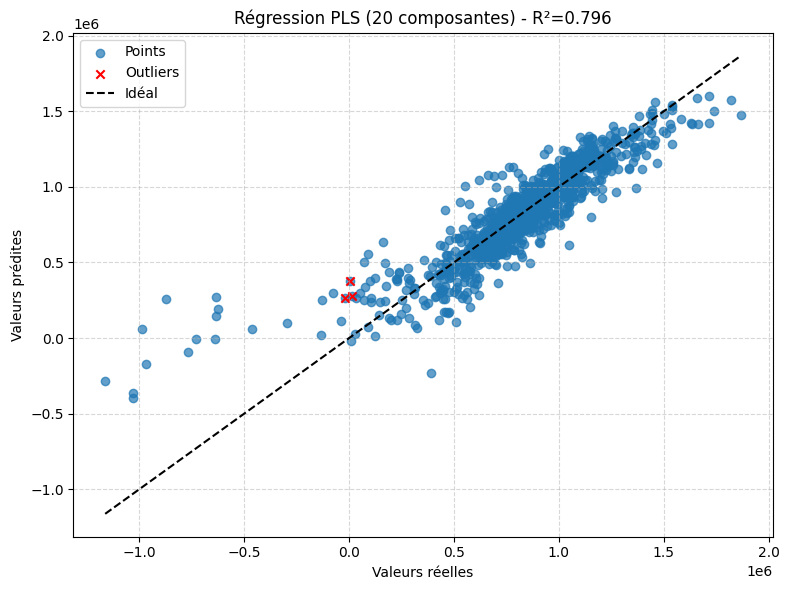

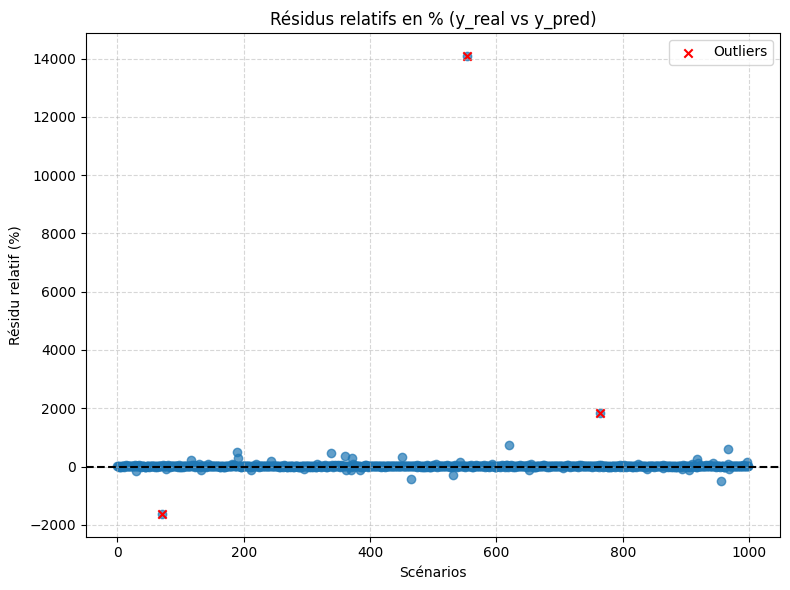

(PLSRegression(n_components=20),
 array([ 279981.68524273, 1450740.43762509,  335679.81647225,
        1377656.16139412, 1000781.35036646,  779436.15424261,
         821156.22963111,  547944.37032018, 1231132.55638893,
         433770.16528205,  923421.18884002,  741132.1279439 ,
         703109.67770741,  900098.03595207, 1243735.0426106 ,
         620032.99161299,  895389.29605053,  961539.10640721,
         873588.50973716,  403733.76038696,  715786.76830331,
         949153.00916477,  830037.58267021, 1073920.01121108,
         785741.7031667 ,  855542.09505874,  721934.77339568,
         738864.14364781, 1072871.79116672,  271261.07506919,
         783152.58563414,  602320.26437743,  854317.68329008,
         762789.62518609,  172890.60253976, 1269065.27889916,
        1014729.57051024,  693239.61429366,  831872.0091352 ,
         592354.55878044, 1061393.11547383,  439684.72352567,
        1107484.04906415,  682341.23343499, 1199917.12625791,
         532335.46794055,  686445.196

In [124]:
pls_regression_analysis_with_relative_residuals(X, y, n_components=20, feature_names=feature_names, outlier_threshold=2.0, scenario_ids=None)

# Nouvelle section PLS


In [125]:
# Exemple avec tes données

X_reduced1, columns_reduced1 = build_feature_matrix(TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix)

X_reduced2 = np.hstack([TL_reduced,
                       TLT_reduced,
                       ACT_reduced,
                       IMMO_reduced])

X = np.hstack([X_reduced2, X_reduced1])
print("X.shape", X.shape)

y = pvfp_array
# Si tu as des noms de variables (par ex. TL_mean, ACT_trend, etc.)
feature_names = ["TL_reduced","TL_vitesse","TLT_reduced","TLT_vitesse","ACT_reduced","IMMO_reduced",
                 "TL_mean","TL_var","TL_min","TL_max","TL_trend",
                 "TLT_mean","TLT_var","TLT_min","TLT_max","TLT_trend",
                 "ACT_mean","ACT_var","ACT_min","ACT_max","ACT_trend",
                 "IMMO_mean","IMMO_var","IMMO_min","IMMO_max","IMMO_trend",
                 # + noms de X_reduced1 si tu en as
                ]



Shape of X_redueced1: (1000, 20)
Fichier Excel 'X_reduced_features.xlsx' créé avec succès.


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

X.shape (1000, 26)


Fonction de regression

In [126]:


def pls_regression_analysis_split(X, y, n_components=40, feature_names=None,
                                  outlier_threshold=2.0, scenario_ids=None,
                                  train_size=1.0, random_state=42):
    # --- Standardisation ---
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # --- Split train/test ---
    if train_size < 1.0:
        X_train, X_test, y_train, y_test = train_test_split(
            X_scaled, y, train_size=train_size, random_state=random_state
        )
    else:
        X_train, X_test, y_train, y_test = X_scaled, X_scaled, y, y

    # --- Régression PLS ---
    pls = PLSRegression(n_components=n_components)
    pls.fit(X_train, y_train)
    y_pred = pls.predict(X_test).ravel()

    # --- Qualité de la régression ---
    r2 = r2_score(y_test, y_pred)
    print(f"\nR² global = {r2:.3f}")

    # --- Détection des outliers par résidus ---
    residuals = y_test - y_pred
    std_res = np.std(residuals)
    outliers_resid = np.where(np.abs(residuals) > outlier_threshold * std_res)[0]

    if scenario_ids is None:
        scenario_ids = np.arange(len(y_test))
    outlier_scenarios_resid = scenario_ids[outliers_resid]

    print(f"Outliers résiduels (>{outlier_threshold}σ) : {len(outliers_resid)}")

    # --- Distance de Mahalanobis ---
    X_test = np.asarray(X_test, dtype=float)
    y_test = np.asarray(y_test, dtype=float)
    VI = np.linalg.inv(np.cov(X_test.T))
    mahal_dist = np.array([distance.mahalanobis(x, X_test.mean(axis=0), VI) for x in X_test])

    # seuil chi² à 97.5% (2.5% outliers)
    p = X_test.shape[1]
    mahal_threshold = np.sqrt(chi2.ppf(0.975, df=p))
    outliers_mahal = np.where(mahal_dist > mahal_threshold)[0]
    outlier_scenarios_mahal = scenario_ids[outliers_mahal]

    print(f"Outliers Mahalanobis (> {mahal_threshold:.2f}) : {len(outliers_mahal)}")

    # --- Distance de Cook ---
    X_test_sm = sm.add_constant(X_test)
    ols_model = sm.OLS(y_test, X_test_sm).fit()
    influence = ols_model.get_influence()
    cooks_d = influence.cooks_distance[0]

    n = len(y_test)
    cook_threshold = 4/n
    outliers_cook = np.where(cooks_d > cook_threshold)[0]
    outlier_scenarios_cook = scenario_ids[outliers_cook]

    print(f"Outliers Cook (> {cook_threshold:.4f}) : {len(outliers_cook)}")

    # --- Plot prédictions vs réelles ---
    plt.figure(figsize=(8,6))
    plt.scatter(y_test, y_pred, alpha=0.7, label="Points")
    plt.scatter(y_test[outliers_resid], y_pred[outliers_resid], color="red", label="Outliers résiduels", marker="x")
    plt.scatter(y_test[outliers_mahal], y_pred[outliers_mahal], color="orange", label="Outliers Mahalanobis", marker="^")
    plt.scatter(y_test[outliers_cook], y_pred[outliers_cook], color="pink", label="Outliers Cook", marker="s")
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', label="Idéal")
    plt.xlabel("Valeurs réelles")
    plt.ylabel("Valeurs prédites")
    plt.title(f"Régression PLS ({n_components} composantes) - R²={r2:.3f}")
    plt.legend()
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.tight_layout()
    plt.show()

    # --- Formule explicite de la prédiction ---
    coefs = pls.coef_.ravel()
    intercept = pls.intercept_[0]

    if feature_names is not None and len(feature_names) == len(coefs):
        labels = feature_names
    else:
        labels = [f"Var{i}" for i in range(len(coefs))]

    formule = "y_pred = " + " + ".join([f"{coef:.3f}*{name}" for coef, name in zip(coefs, labels)]) + f" + {intercept:.3f}"
    print("\nFormule de prédiction PLS :")
    print(formule)

    return (pls, y_pred, r2,
            outliers_resid, outlier_scenarios_resid,
            outliers_mahal, outlier_scenarios_mahal,
            outliers_cook, outlier_scenarios_cook,
            coefs, intercept, X_test, y_test,
            mahal_dist, cooks_d)


R² global = 0.796
Outliers résiduels (>2.0σ) : 41
Outliers Mahalanobis (> 6.47) : 83
Outliers Cook (> 0.0040) : 66


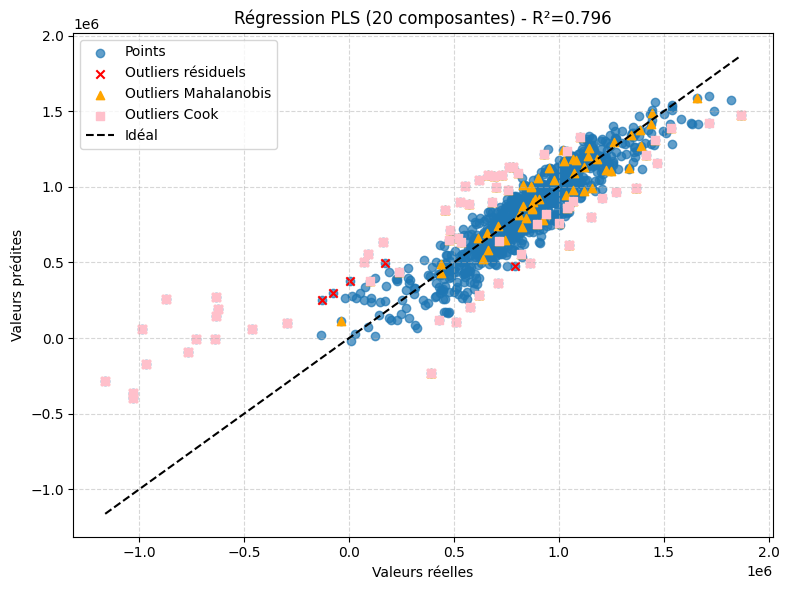


Formule de prédiction PLS :
y_pred = -27922.500*TL_reduced + -19921.349*TL_vitesse + -54253.828*TLT_reduced + -16600.072*TLT_vitesse + -105442.564*ACT_reduced + -29415.365*IMMO_reduced + -183651.896*TL_mean + -176578.246*TL_var + -26046.477*TL_min + 46787.227*TL_max + 427206.619*TL_trend + 132115.504*TLT_mean + 166760.144*TLT_var + 162424.355*TLT_min + -40862.709*TLT_max + -91427.804*TLT_trend + 100954.341*ACT_mean + 30484.344*ACT_var + 23700.694*ACT_min + -15280.364*ACT_max + -257871.351*ACT_trend + -2579.464*IMMO_mean + -47595.921*IMMO_var + 2213.400*IMMO_min + 26107.784*IMMO_max + -83716.285*IMMO_trend + 818580.508

Résumé des résultats :
R² sur test : 0.796
Outliers résiduels détectés : [ 13  28  29  77  98 129 132 183 190 212 219 243 246 263 296 362 369 372
 490 531 543 554 581 651 704 705 712 731 765 825 839 863 864 894 896 905
 956 966 967 968 990]
Outliers Mahalanobis détectés : [  3  18  27  28  70  76 133 183 191 192 203 213 218 231 242 247 272 288
 297 314 317 322 339 348 3

In [127]:
# --- cas 1 100% -  Application de ta fonction ---
pls, y_pred, r2, outliers_resid, outlier_scenarios_resid, \
outliers_mahal, outlier_scenarios_mahal, \
outliers_cook, outlier_scenarios_cook, \
coefs, intercept, X_test, y_test, mahal_dist, cooks_d = pls_regression_analysis_split(
    X, y,
    n_components=20,
    feature_names=feature_names,
    outlier_threshold=2.0,
    train_size=1.0,   # 90% train, 10% test
    random_state=42
)

# --- Résumé des résultats ---
print("\nRésumé des résultats :")
print(f"R² sur test : {r2:.3f}")
print(f"Outliers résiduels détectés : {outlier_scenarios_resid}")
print(f"Outliers Mahalanobis détectés : {outlier_scenarios_mahal}")
print(f"Outliers Cook détectés : {outlier_scenarios_cook}")

# --- Tableau récapitulatif ---
df_outliers = pd.DataFrame({
    "y_test": y_test,
    "y_pred": y_pred,
    "residuals": y_test - y_pred,
    "mahal_dist": mahal_dist,
    "cooks_d": cooks_d
})

# Ajout des flags outliers
df_outliers["is_outlier_resid"] = df_outliers.index.isin(outliers_resid)
df_outliers["is_outlier_mahal"] = df_outliers.index.isin(outliers_mahal)
df_outliers["is_outlier_cook"] = df_outliers.index.isin(outliers_cook)


R² global = 0.819
Outliers résiduels (>2.0σ) : 2
Outliers Mahalanobis (> 6.47) : 6
Outliers Cook (> 0.0400) : 5


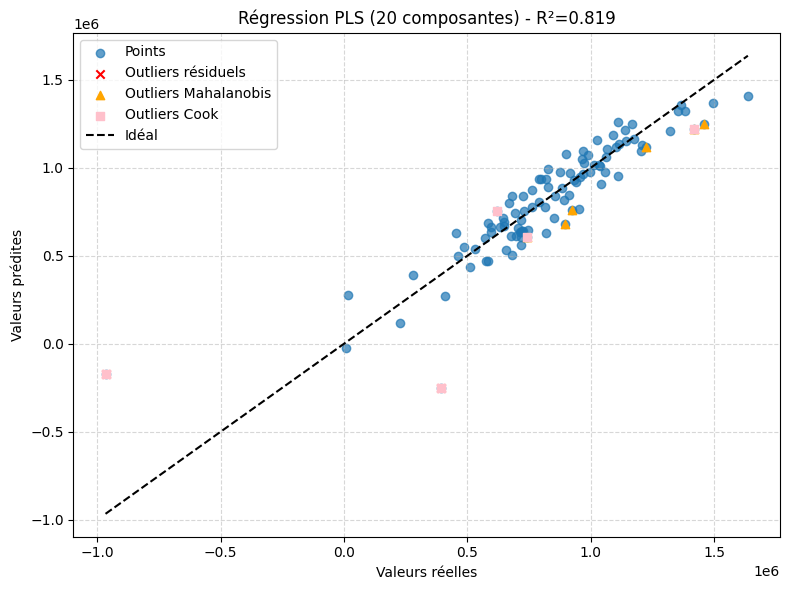


Formule de prédiction PLS :
y_pred = -31133.362*TL_reduced + -25518.764*TL_vitesse + -51139.545*TLT_reduced + -19511.568*TLT_vitesse + -105538.997*ACT_reduced + -31413.427*IMMO_reduced + -183911.981*TL_mean + -186172.447*TL_var + -22989.037*TL_min + 31513.948*TL_max + 464722.893*TL_trend + 135266.734*TLT_mean + 176775.002*TLT_var + 164069.804*TLT_min + -35617.760*TLT_max + -121463.028*TLT_trend + 91791.321*ACT_mean + 27439.746*ACT_var + 22158.153*ACT_min + -11584.054*ACT_max + -261975.480*ACT_trend + -1973.908*IMMO_mean + -37565.214*IMMO_var + 4456.549*IMMO_min + 20978.097*IMMO_max + -76948.111*IMMO_trend + 817316.091

Résumé des résultats :
R² sur test : 0.819
Outliers résiduels détectés : [60 69]
Outliers Mahalanobis détectés : [11 32 62 68 85 93]
Outliers Cook détectés : [ 3 32 60 62 69]

Tableau récapitulatif des 10 premières observations du test :
        y_test        y_pred      residuals  mahal_dist       cooks_d  \
0   227348.496  1.162825e+05  111066.005214    5.163351  4.45

In [128]:

# --- cas 2 = 90% ---- Application de ta fonction ---
pls, y_pred, r2, outliers_resid, outlier_scenarios_resid, \
outliers_mahal, outlier_scenarios_mahal, \
outliers_cook, outlier_scenarios_cook, \
coefs, intercept, X_test, y_test, mahal_dist, cooks_d = pls_regression_analysis_split(
    X, y,
    n_components=20,
    feature_names=feature_names,
    outlier_threshold=2.0,
    train_size=0.9,   # 90% train, 10% test
    random_state=42
)

# --- Résumé des résultats ---
print("\nRésumé des résultats :")
print(f"R² sur test : {r2:.3f}")
print(f"Outliers résiduels détectés : {outlier_scenarios_resid}")
print(f"Outliers Mahalanobis détectés : {outlier_scenarios_mahal}")
print(f"Outliers Cook détectés : {outlier_scenarios_cook}")

# --- Tableau récapitulatif ---
df_outliers = pd.DataFrame({
    "y_test": y_test,
    "y_pred": y_pred,
    "residuals": y_test - y_pred,
    "mahal_dist": mahal_dist,
    "cooks_d": cooks_d
})

# Ajout des flags outliers
df_outliers["is_outlier_resid"] = df_outliers.index.isin(outliers_resid)
df_outliers["is_outlier_mahal"] = df_outliers.index.isin(outliers_mahal)
df_outliers["is_outlier_cook"] = df_outliers.index.isin(outliers_cook)

print("\nTableau récapitulatif des 10 premières observations du test :")
print(df_outliers.head(10))

Exportation de résultats

In [129]:
import pandas as pd
import numpy as np
from google.colab import files

def export_pls_results_to_excel_bis(X, X_scaled, y_test, y_pred, residuals,
                                    outliers_indices, coefs, intercept, feature_names,
                                    scenario_ids=None,
                                    filename="pls_results.xlsx"):
    # --- Gestion des scenario_ids ---
    n_samples = X.shape[0]
    if scenario_ids is None:
        scenario_ids = np.arange(n_samples)

    # Adapter la taille des scenario_ids à X_scaled si besoin
    if len(scenario_ids) != X_scaled.shape[0]:
        scenario_ids = np.arange(X_scaled.shape[0])

    # --- Onglet 1 : input X brut ---
    df_raw = pd.DataFrame(X, columns=feature_names)
    df_raw.insert(0, "scenario_id", np.arange(df_raw.shape[0]))

    # --- Onglet 2 : X_scaled + y_réel + y_pred + residuals ---
    df_scaled = pd.DataFrame(X_scaled, columns=feature_names)
    df_scaled.insert(0, "scenario_id", scenario_ids)
    df_scaled["y_real"] = y_test
    df_scaled["y_pred"] = y_pred
    df_scaled["residuals"] = residuals

    # --- Onglet 3 : uniquement les outliers ---
    df_outliers = df_scaled.iloc[outliers_indices].copy()
    df_outliers["outlier_index"] = outliers_indices

    # --- Onglet 4 : formule PLS (coefficients + intercept) ---
    df_coefs = pd.DataFrame({
        "Variable": feature_names,
        "Coefficient": coefs
    })
    df_intercept = pd.DataFrame({"Variable": ["Intercept"], "Coefficient": [intercept]})
    df_formula = pd.concat([df_coefs, df_intercept], ignore_index=True)

    # --- Export vers Excel ---
    with pd.ExcelWriter(filename, engine="openpyxl") as writer:
        df_raw.to_excel(writer, sheet_name="X_brut", index=False)
        df_scaled.to_excel(writer, sheet_name="X_scaled_pred", index=False)
        df_outliers.to_excel(writer, sheet_name="Outliers", index=False)
        df_formula.to_excel(writer, sheet_name="Formule_PLS", index=False)

    # --- Téléchargement dans Colab ---
    files.download(filename)

In [130]:

# --- Calcul des résidus ---
residuals = y_test - y_pred

# --- Définition des scenario_ids ---
n_samples = X.shape[0]
scenario_ids = np.arange(n_samples)

# --- Export vers Excel ---
export_pls_results_to_excel_bis(
    X=X,
    X_scaled=X_test,   # ou X_scaled complet si tu veux tout
    y_test=y_test,
    y_pred=y_pred,
    residuals=residuals,
    outliers_indices=outliers_resid,   # indices des outliers détectés
    coefs=coefs,
    intercept=intercept,
    feature_names=feature_names,
    scenario_ids=scenario_ids,         # ✅ ajout pour exporter les numéros de scénario
    filename="pls_results.xlsx"
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Re-application de formule PLS obtenur sur l'ensemble de X

In [131]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

def apply_pls_formula(X, y, coefs, intercept, feature_names=None):
    """
    Re-applique la formule PLS obtenue sur l'ensemble de X
    et calcule les métriques de qualité de la régression.
    """
    # --- Prédictions avec la formule explicite ---
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    y_pred_full = np.dot(X_scaled, coefs) + intercept

    # --- Qualité de la régression ---
    r2_full = r2_score(y, y_pred_full)
    rmse_full = np.sqrt(mean_squared_error(y, y_pred_full))
    mae_full = mean_absolute_error(y, y_pred_full)

    print(f"\nQualité de la régression sur tout le dataset :")
    print(f"R² = {r2_full:.3f}, RMSE = {rmse_full:.3f}, MAE = {mae_full:.3f}")

    # --- Plot prédictions vs réelles ---
    plt.figure(figsize=(8,6))
    plt.scatter(y, y_pred_full, alpha=0.7, label="Points")
    plt.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', label="Idéal")
    plt.xlabel("Valeurs réelles")
    plt.ylabel("Valeurs prédites")
    plt.title(f"Régression PLS (formule appliquée) - R²={r2_full:.3f}")
    plt.legend()
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.tight_layout()
    plt.show()

    return X, X_scaled, y_pred_full, r2_full, rmse_full, mae_full


Qualité de la régression sur tout le dataset :
R² = 0.795, RMSE = 158283.361, MAE = 107342.851


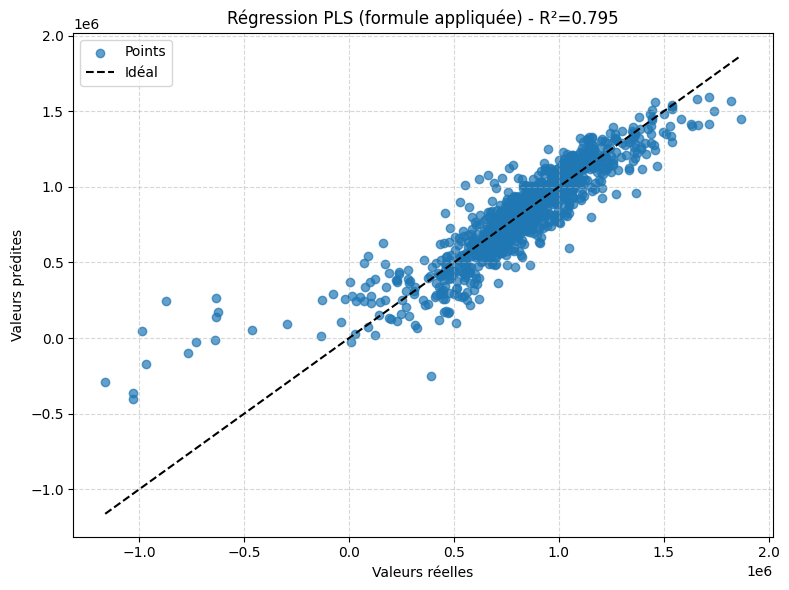

In [132]:
X, X_scaled, y_pred_full, r2_full, rmse_full, mae_full = apply_pls_formula(
    X, y, coefs, intercept, feature_names=feature_names
)

Distance leverage pour les outliers

In [133]:
import numpy as np

def compute_pls_structural_metrics(pls, X_scaled):
    """
    Calcule leverage (h), Hotelling T² et SPE pour X à partir d'un modèle PLS scikit-learn.
    Entrées:
        - pls: PLSRegression déjà fit
        - X_scaled: données X standardisées (les mêmes que celles utilisées pour fit/prédire)
    Sorties:
        - h: leverage par observation
        - T2: Hotelling T² par observation
        - SPE: Squared Prediction Error par observation
        - T: scores X (n x A)
        - P: loadings X (p x A)
    """
    # Scores et loadings X (forme: n x A, p x A)
    T = pls.x_scores_
    P = pls.x_loadings_
    n, A = T.shape

    # 1) Leverage h_i = t_i^T (T^T T)^{-1} t_i
    TT_inv = np.linalg.inv(T.T @ T)
    h = np.einsum('ij,jk,ik->i', T, TT_inv, T)

    # 2) Hotelling T²: T2_i = t_i^T Σ_T^{-1} t_i
    # Utilise la covariance des scores (variance par composante)
    # Σ_T ≈ diag(var(t_a)), on peut le rendre plus stable via np.cov(T, rowvar=False)
    Sigma_T = np.cov(T, rowvar=False)  # A x A
    Sigma_T_inv = np.linalg.pinv(Sigma_T)
    T2 = np.einsum('ij,jk,ik->i', T, Sigma_T_inv, T)

    # 3) SPE: erreur de reconstruction de X via X_hat = T P^T
    X_hat = T @ P.T
    residuals_X = X_scaled - X_hat
    SPE = np.sum(residuals_X**2, axis=1)

    return h, T2, SPE, T, P

def default_thresholds(h, T2, SPE, T, alpha=0.975):
    """
    Propose des seuils empiriques/paramétriques:
    - Leverage: seuil ≈ 3*A/n (règle de pouce robuste)
    - Hotelling T²: seuil paramétrique via F (analogue PCA)
    - SPE: quantile empirique (alpha)
    """
    n, A = T.shape

    # Leverage: règle souvent utilisée en PCA/PLS
    h_thr = 3 * A / n

    # T²: seuil basé sur la loi F (Jackson analogie PCA)
    # T²_lim = (A*(n-1)/(n-A)) * F_{A, n-A}(alpha)
    from scipy.stats import f
    T2_thr = (A * (n - 1) / (n - A)) * f.ppf(alpha, A, n - A)

    # SPE: on prend un quantile empirique (alpha) pour rester simple et robuste
    SPE_thr = np.quantile(SPE, alpha)

    return h_thr, T2_thr, SPE_thr

In [134]:
def pls_regression_analysis_split_with_structural(X, y, n_components=40, feature_names=None,
                                                  outlier_threshold=2.0, scenario_ids=None,
                                                  train_size=1.0, random_state=42,
                                                  alpha_struct=0.975):
    # --- Standardisation ---
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # --- Split train/test ---
    if train_size < 1.0:
        X_train, X_test, y_train, y_test = train_test_split(
            X_scaled, y, train_size=train_size, random_state=random_state
        )
    else:
        X_train, X_test, y_train, y_test = X_scaled, X_scaled, y, y

    # --- Régression PLS ---
    pls = PLSRegression(n_components=n_components)
    pls.fit(X_train, y_train)
    y_pred = pls.predict(X_test).ravel()

    # --- Qualité de la régression ---
    r2 = r2_score(y_test, y_pred)
    print(f"\nR² global = {r2:.3f}")

    # --- Outliers par résidus (Y) ---
    residuals = y_test - y_pred
    std_res = np.std(residuals)
    outliers_resid = np.where(np.abs(residuals) > outlier_threshold * std_res)[0]

    if scenario_ids is None:
        scenario_ids = np.arange(len(y_test))
    outlier_scenarios_resid = scenario_ids[outliers_resid]
    print(f"Outliers résiduels (>{outlier_threshold}σ) : {len(outliers_resid)}")

    # --- Mahalanobis sur X (diagnostic global) ---
    X_test = np.asarray(X_test, dtype=float)
    y_test = np.asarray(y_test, dtype=float)
    VI = np.linalg.pinv(np.cov(X_test.T))
    mahal_dist = np.array([distance.mahalanobis(x, X_test.mean(axis=0), VI) for x in X_test])

    p = X_test.shape[1]
    mahal_threshold = np.sqrt(chi2.ppf(alpha_struct, df=p))
    outliers_mahal = np.where(mahal_dist > mahal_threshold)[0]
    outlier_scenarios_mahal = scenario_ids[outliers_mahal]
    print(f"Outliers Mahalanobis (> {mahal_threshold:.2f}) : {len(outliers_mahal)}")

    # --- Distance de Cook (OLS sur X -> Y) ---
    X_test_sm = sm.add_constant(X_test)
    ols_model = sm.OLS(y_test, X_test_sm).fit()
    influence = ols_model.get_influence()
    cooks_d = influence.cooks_distance[0]

    n = len(y_test)
    cook_threshold = 4/n
    outliers_cook = np.where(cooks_d > cook_threshold)[0]
    outlier_scenarios_cook = scenario_ids[outliers_cook]
    print(f"Outliers Cook (> {cook_threshold:.4f}) : {len(outliers_cook)}")

    # --- METRIQUES PLS STRUCTURELLES: leverage, Hotelling T², SPE ---
    # Utiliser les scores/loadings issus du fit (attention: scores du set d'entraînement; on refit sur tout si besoin)
    # Pour diagnostiquer le set "test", on recalcule T_test via transformation: T_test = (X_test - Xmean) * W (approx)
    # En scikit-learn, on peut obtenir les scores "x_scores_" du fit. Pour une cohérence simple, on refit sur X_test.
    pls_struct = PLSRegression(n_components=n_components)
    pls_struct.fit(X_test, y_test)
    h, T2, SPE, T, P = compute_pls_structural_metrics(pls_struct, X_test)
    h_thr, T2_thr, SPE_thr = default_thresholds(h, T2, SPE, T, alpha=alpha_struct)

    outliers_h = np.where(h > h_thr)[0]
    outliers_T2 = np.where(T2 > T2_thr)[0]
    outliers_SPE = np.where(SPE > SPE_thr)[0]

    print(f"Outliers leverage h (> {h_thr:.4f}) : {len(outliers_h)}")
    print(f"Outliers Hotelling T² (> {T2_thr:.4f}) : {len(outliers_T2)}")
    print(f"Outliers SPE (> Q{int(alpha_struct*100)}%) : {len(outliers_SPE)}")

    # --- Plot prédictions vs réelles ---
    plt.figure(figsize=(8,6))
    plt.scatter(y_test, y_pred, alpha=0.7, label="Points")
    plt.scatter(y_test[outliers_resid], y_pred[outliers_resid], color="red", label="Outliers résiduels", marker="x")
    plt.scatter(y_test[outliers_mahal], y_pred[outliers_mahal], color="orange", label="Outliers Mahalanobis", marker="^")
    plt.scatter(y_test[outliers_cook], y_pred[outliers_cook], color="pink", label="Outliers Cook", marker="s")
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', label="Idéal")
    plt.xlabel("Valeurs réelles")
    plt.ylabel("Valeurs prédites")
    plt.title(f"Régression PLS ({n_components} composantes) - R²={r2:.3f}")
    plt.legend()
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.tight_layout()
    plt.show()

    # --- Scatter des diagnostics structurels ---
    fig, axes = plt.subplots(1, 3, figsize=(15,4))
    axes[0].scatter(np.arange(n), h, alpha=0.7)
    axes[0].axhline(h_thr, color="r", linestyle="--")
    axes[0].set_title("Leverage h")
    axes[0].set_xlabel("Index")
    axes[0].set_ylabel("h")

    axes[1].scatter(np.arange(n), T2, alpha=0.7)
    axes[1].axhline(T2_thr, color="r", linestyle="--")
    axes[1].set_title("Hotelling T²")
    axes[1].set_xlabel("Index")
    axes[1].set_ylabel("T²")

    axes[2].scatter(np.arange(n), SPE, alpha=0.7)
    axes[2].axhline(SPE_thr, color="r", linestyle="--")
    axes[2].set_title("SPE (erreur reconstruction X)")
    axes[2].set_xlabel("Index")
    axes[2].set_ylabel("SPE")

    plt.tight_layout()
    plt.show()

    # --- Formule explicite de la prédiction ---
    coefs = pls.coef_.ravel()
    intercept = pls.intercept_[0]

    if feature_names is not None and len(feature_names) == len(coefs):
        labels = feature_names
    else:
        labels = [f"Var{i}" for i in range(len(coefs))]

    formule = "y_pred = " + " + ".join([f"{coef:.3f}*{name}" for coef, name in zip(coefs, labels)]) + f" + {intercept:.3f}"
    print("\nFormule de prédiction PLS :")
    print(formule)

    # --- Récapitulatif Pandas ---
    df_outliers = pd.DataFrame({
        "y_test": y_test,
        "y_pred": y_pred,
        "residuals": residuals,
        "mahal_dist": mahal_dist,
        "cooks_d": cooks_d,
        "leverage_h": h,
        "hotelling_T2": T2,
        "SPE": SPE
    })

    df_outliers["is_outlier_resid"] = df_outliers.index.isin(outliers_resid)
    df_outliers["is_outlier_mahal"] = df_outliers.index.isin(outliers_mahal)
    df_outliers["is_outlier_cook"] = df_outliers.index.isin(outliers_cook)
    df_outliers["is_outlier_h"] = df_outliers.index.isin(outliers_h)
    df_outliers["is_outlier_T2"] = df_outliers.index.isin(outliers_T2)
    df_outliers["is_outlier_SPE"] = df_outliers.index.isin(outliers_SPE)

    return {
        "pls": pls,
        "y_pred": y_pred,
        "r2": r2,
        "outliers": {
            "residuals_idx": outliers_resid,
            "mahal_idx": outliers_mahal,
            "cook_idx": outliers_cook,
            "h_idx": outliers_h,
            "T2_idx": outliers_T2,
            "SPE_idx": outliers_SPE
        },
        "thresholds": {
            "mahal": float(mahal_threshold),
            "cook": float(cook_threshold),
            "h": float(h_thr),
            "T2": float(T2_thr),
            "SPE": float(SPE_thr)
        },
        "coef_intercept": (coefs, intercept),
        "X_test": X_test,
        "y_test": y_test,
        "diagnostics": {
            "mahal_dist": mahal_dist,
            "cooks_d": cooks_d,
            "leverage_h": h,
            "hotelling_T2": T2,
            "SPE": SPE
        },
        "df_outliers": df_outliers
    }


R² global = 0.796
Outliers résiduels (>2.0σ) : 41
Outliers Mahalanobis (> 6.47) : 83
Outliers Cook (> 0.0040) : 66
Outliers leverage h (> 0.0600) : 30
Outliers Hotelling T² (> 35.1198) : 77
Outliers SPE (> Q97%) : 25


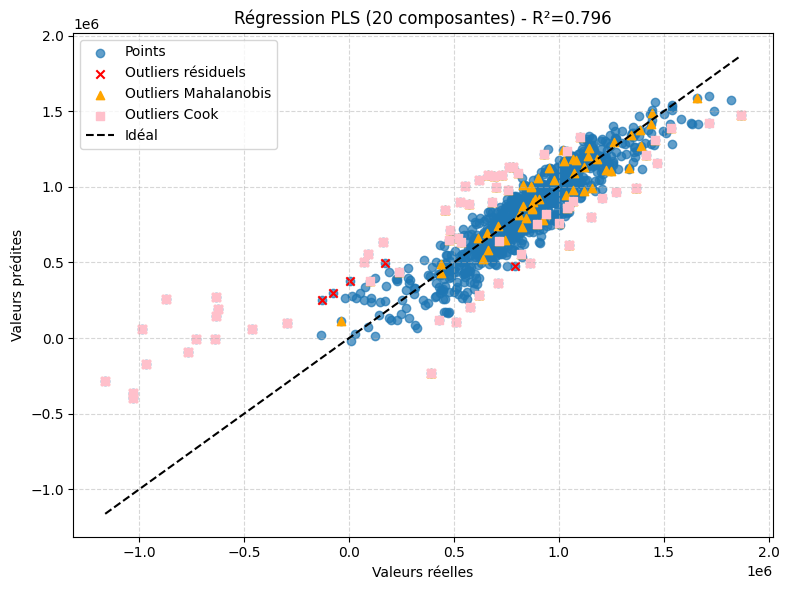

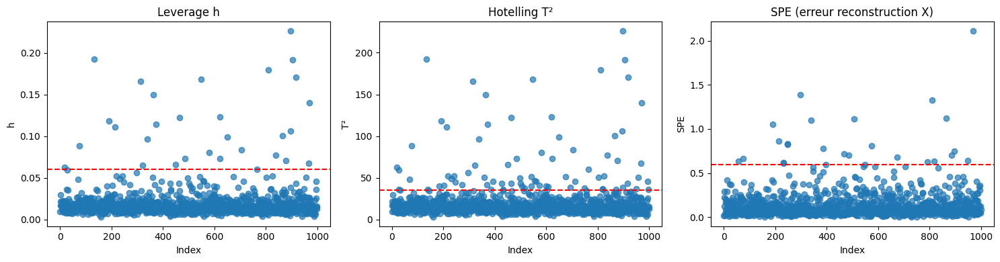


Formule de prédiction PLS :
y_pred = -27922.500*TL_reduced + -19921.349*TL_vitesse + -54253.828*TLT_reduced + -16600.072*TLT_vitesse + -105442.564*ACT_reduced + -29415.365*IMMO_reduced + -183651.896*TL_mean + -176578.246*TL_var + -26046.477*TL_min + 46787.227*TL_max + 427206.619*TL_trend + 132115.504*TLT_mean + 166760.144*TLT_var + 162424.355*TLT_min + -40862.709*TLT_max + -91427.804*TLT_trend + 100954.341*ACT_mean + 30484.344*ACT_var + 23700.694*ACT_min + -15280.364*ACT_max + -257871.351*ACT_trend + -2579.464*IMMO_mean + -47595.921*IMMO_var + 2213.400*IMMO_min + 26107.784*IMMO_max + -83716.285*IMMO_trend + 818580.508

Résumé des résultats :
R² sur test : 0.796
Outliers résiduels détectés : [ 13  28  29  77  98 129 132 183 190 212 219 243 246 263 296 362 369 372
 490 531 543 554 581 651 704 705 712 731 765 825 839 863 864 894 896 905
 956 966 967 968 990]
Outliers Mahalanobis détectés : [  3  18  27  28  70  76 133 183 191 192 203 213 218 231 242 247 272 288
 297 314 317 322 339 348 3

In [135]:
# --- Application sur ton cas ---
results = pls_regression_analysis_split_with_structural(
    X, y,
    n_components=20,             # nombre de composantes PLS
    feature_names=feature_names, # noms des variables
    outlier_threshold=2.0,       # seuil résiduel (2σ)
    train_size=1.0,              # tout le dataset
    random_state=42,
    alpha_struct=0.975           # seuils statistiques (97.5%)
)

# --- Résumé des résultats ---
print("\nRésumé des résultats :")
print(f"R² sur test : {results['r2']:.3f}")
print("Outliers résiduels détectés :", results['outliers']['residuals_idx'])
print("Outliers Mahalanobis détectés :", results['outliers']['mahal_idx'])
print("Outliers Cook détectés :", results['outliers']['cook_idx'])
print("Outliers leverage détectés :", results['outliers']['h_idx'])
print("Outliers Hotelling T² détectés :", results['outliers']['T2_idx'])
print("Outliers SPE détectés :", results['outliers']['SPE_idx'])

# --- Tableau récapitulatif ---
df_outliers = results['df_outliers']
print(df_outliers.head())